In [1]:
!jt -t chesterish

In [1]:
import seaborn as sns
import numpy as np
import scipy
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score as r_sq
from sklearn.metrics import mean_squared_error
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm
import plotly
from re import compile,search
from itertools import combinations
import networkx as nx
from math import sqrt
import random
from collections import defaultdict
from textwrap import wrap
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
# unused but required import for doing 3d projections with matplotlib < 3.2
import mpl_toolkits.mplot3d  # noqa: F4
import plotly.express as px
import random
from sklearn.preprocessing import StandardScaler
from IPython.display import display, Markdown, Latex
import statsmodels.api as sm
import statsmodels
import statsmodels.stats.api as sms
import statsmodels.regression.linear_model as smf
from statsmodels.stats.outliers_influence import variance_inflation_factor as  vif
from statsmodels.tools.tools import add_constant
from statsmodels.distributions.empirical_distribution import ECDF
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity,calculate_kmo
from factor_analyzer import FactorAnalyzer
import pymc3 as pmc
from pymc3 import fit
from pymc3 import Model,Uniform,Gamma,Normal,HalfNormal, Exponential, HalfCauchy
import arviz as az
import theano
import nxviz
from nxviz import annotate
from collections import namedtuple
from itertools import count
import itertools
from warnings import warn
from typing import Optional, Union, Callable
from os.path import join

/media/alexander-fyrogenis/Elements/Οργανοθειικά Ατμόσφαιρα/Data Analysis/venv/lib/python3.10/site-packages/nxviz/__init__.py:18: UserWarning: 
nxviz has a new API! Version 0.7.4 onwards, the old class-based API is being
deprecated in favour of a new API focused on advancing a grammar of network
graphics. If your plotting code depends on the old API, please consider
pinning nxviz at version 0.7.4, as the new API will break your old code.

To check out the new API, please head over to the docs at
https://ericmjl.github.io/nxviz/ to learn more. We hope you enjoy using it!

(This deprecation message will go away in version 1.0.)

  warnings.warn(


In [2]:
# Ενεργοποιούμε τις κάτω επιλογές για να εμφανίζεται ο πλήρεις πίνακας
# pd.set_option('display.max_rows', None)
# pd.set_option('display.max_columns', None)
# pd.set_option('display.width', None)
# pd.set_option('display.max_colwidth', None)


# Σε διαδραστικό mode
fsize = (14,6)
# Σε στατικό mode
# fsize = (14,12)
# params = {'mathtext.default': 'regular' } 
# plt.rcParams.update(params)
# matplotlib.rcParams.update({'legend.loc':'upper right'})
%matplotlib widget
# plt.rcParams["figure.figsize"] = (16,12)
font = {'family' : 'Arial',
        'weight' : 'normal',
        'size'   : 20}
%config InlineBackend.figure_format = 'retina' 
%load_ext autoreload 
%autoreload 2
plt.rcParams["figure.figsize"] = fsize
plt.rcParams["font.family"] = "arial"
plt.rcParams["font.size"] = 15
plt.rcParams["font.weight"] = "normal"
base_fpath = "/media/alexander-fyrogenis/Elements/Οργανοθειικά Ατμόσφαιρα/Διαγράμματα"

# Εισαγωγικά
Φορτώνουμε όλα τα δεδομένα μας

In [3]:
raw_data = pd.read_csv('Datasets/os_data.csv',header=0)
quantification_data = pd.read_csv('Datasets/quantification_data.csv',header = 0)
validation_curves = pd.read_csv('Datasets/validation_curves.csv',header=0)
ions = pd.read_csv('Datasets/ion_ids.csv',header=0)

**Το ιόν 319,1741 να αλλαχθεί σε 309,1736. Το ιόν 319,1741 δεν αναζητήθηκε**

In [4]:
# Γενικής χρήσης βοηθητικές συναρτήσεις

In [5]:
get_random_hex_color = lambda n: list(map(lambda i: "#" + "%06x" % random.randint(0, 0xFFFFFF),range(n)))
latex = lambda x: display(Latex(x))
markdown = lambda x: display(Markdown(x))

seek_ion_group = lambda df2,e: df2[df2['Exact mass'] == e]['Group'].values[0]

reducer = lambda e1,e2: e1>=10*e2
gaussian_greek_converter = lambda df,e: 'Ναι' if is_gaussian(df,e) else 'Όχι'
translator = lambda e : 'Ναι' if e else 'Όχι'

def excluded_groups(grps,exc_grps=["mnapOS","napOS"])->list:
        for grp in exc_grps:
            while True:
                try:
                    grps.remove(grp)
                except ValueError:
                    break
        return grps

def to_groups(data:pd.DataFrame,ion_idx:pd.DataFrame,exc_groups:list[str] = ["mnapOS","napOS"]):
    groups = excluded_groups(ion_idx.loc[:,"Group"].unique().tolist(),exc_groups)
    l = []
    groups_df = pd.DataFrame()
    for group in groups:
        grouped_ions = select_ions_from_group(ion_idx, group)
        g = data.loc[:, grouped_ions].sum(axis=1)
        groups_df = pd.concat([groups_df,g],axis=1)
    groups_df.columns = groups
    return groups_df

def transform_df_to_groups(df:pd.DataFrame,ion_idx:pd.DataFrame,exc_groups:list[str] = ["mnapOS", "napOS"])->pd.DataFrame:
    groups = [i for i  in ion_idx.loc[:,"Group"].unique().tolist()]
    groups = excluded_groups(groups,exc_groups)
    grouped_df = pd.DataFrame()
    for group in groups:
        g_ions = ion_idx[ion_idx.loc[:,"Group"] == group].loc[:,"Exact mass"].tolist()
        sub_df = df.loc[:,g_ions]
        mu,stderr = sub_df.stack().values.mean(),scipy.stats.sem(sub_df.stack().values)
        grouped_df = pd.concat([grouped_df,
                               pd.DataFrame(data ={"$\mu$": [mu],"$\sigma$": [stderr]},columns = ["$\mu$", "$\sigma$"], index = [group])
                               ],axis = 0)
    return grouped_df


In [6]:
def select_ions_from_group(ion_idx:pd.DataFrame, group:str)->pd.DataFrame:
    ions = ion_idx[ion_idx["Group"] == group].loc[:,"Exact mass"].tolist()
    return ions

In [7]:
def get_ion_to_group_corrs(grp:str, ion_idx:pd.DataFrame, ion:str,data:pd.DataFrame):
    coefs = []
    group_ions = select_ions_from_group(ion_idx, grp)
    for col in group_ions:
        coefs.append(np.corrcoef(data[col], data[ion]))
    coefs = [it[0,1]*100 for it in coefs]
    odf = pd.DataFrame(data=coefs, index=group_ions,columns=["%$r_{pearson}$"])
    return odf

## Επεξεργασία Δεδομένων και Μετατροπή Σε Τελικές Συγκεντρώσεις

In [8]:
# Ακαίρεος των παραμέτρων στην αρχή του πίνακα που ΔΕΝ είναι συγκέντρωση οργανοθειικών
global data_start
data_start = 6

Τα πρωτογενοί μας δεδομένα. Θα μετασχηματιστούν σε τελικές συγκεντρώσεις ως εξής
1. Κάθε σήμα διαιρείται με αυτό το εσωτερικού προτύπου (εκτός του ίδιου το εσωτερικού προτύπου), δηλαδή ${S^i}^{\prime}=\dfrac{S^i_{^{m}/_{z}}}{S^i_{internal\ standard}}$
2. Κάθε $^m/_{z}$ μετατρέπεται σε συγκέντρωση μέσω της κατάλληλης καμπύλης $C_i = \dfrac{ {S^i}^{\prime} - \beta^{j}_0 }{\beta^{j}_1}$ όπου j το αντίστοιχο πρότυπο (βλέπε πίνακα αντιστοιχίας ιόντων)
3. Από κάθε συγκέντρωση εφτάδα συγκεντρώσεων (μετρήσεις ενός μήνα) αφαιρείται η συγκέντρωση του αντίστοιχου λευκού ${C_i}^{\prime} = C_{i}-C^{blank}$
4. Για κάθε συγκέντρωση τέτοια ώστε ${C^j_i}^{\prime\prime}<LOQ^j$ είναι ${C^j_i}^{\prime}<\frac{LOD^j}2$
5. Οι συγκεντρώσεις $(ng\ mL^{-1})$ μετατρέπονται σε $(ng\ m^{-3})$ ως εξής ${C^j_i}^{\prime\prime} = 2*\ (\text{μισό φίλτρο})\ *\ 0.5 (\mu g L)\ *\ V_{amp} (ng\ m^{-3})\ *\ {C^j_i}^{\prime\prime}  (\mu g\ L)$

In [9]:
# Inspect the data
raw_data

,Sample,Date,PM,Δm,V_amb,C_pm,110.9758,124.9914,130.0228,139.0071,...,362.1279,382.1177,257.0139,273.0063,275.0228,320.0021,217.9751,231.0333,287.0243,289.0387
0,emep_h10_7,01/08/19,10.0,4.540,632.7,7.175449,3263425,834024,3437141,3071159,...,0,0,0,0,0,0,0,101029,0,0
1,emep_h10_9,01/09/19,10.0,8.370,758.1,11.040672,701684,166345,2194278,1606204,...,0,0,0,26522,0,0,0,60129,0,0
2,emep_h10_10,01/10/19,10.0,5.600,758.5,7.382720,1086033,329073,1838170,1861935,...,0,0,0,38904,0,0,0,118440,0,0
3,emep_h10_11,01/11/19,10.0,10.940,759.9,14.397332,839227,400394,2650308,1435567,...,0,0,11709,0,0,0,0,160647,0,0
4,emep_h10_12,01/12/19,10.0,19.760,764.0,25.863976,18533507,534679,2962230,1990894,...,0,0,70664,0,0,0,0,232456,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,emep_l2.5_339,12/05/19,2.5,0.325,55.1,5.895157,521450,125363,751194,1586915,...,0,0,0,0,24773,0,0,0,0,0
92,emep_l2.5_340,12/06/19,2.5,0.327,55.1,5.931435,1819013,249164,774652,2512380,...,0,0,0,0,26562,0,0,0,0,0
93,emep_l2.5_341,12/07/19,2.5,0.487,55.1,8.833666,2720690,476167,834786,3100053,...,0,0,0,0,17966,0,0,0,0,0
94,emep_l2.5_342,12/08/19,2.5,0.464,55.1,8.416470,718064,635528,844456,3192762,...,0,0,0,0,27559,0,0,0,0,0


<!-- Τα δεδομένα των καμπύλων βαθμονόμησης προτύπων -->

In [10]:
# validation_curves

Δεδομένα προσοτικοποίησης

In [11]:
quantification_data

,ion,curve_std,lin_lower,lin_upper,curve_slope,curve_intercept,r_sq,precision_25,precision_100,accuracy_25,accuracy_100,lod,loq,equation
0,110.9758,MeS,34.0,500,0.0052,-0.0117,0.9961,7.83,2.61,86.1,81.1,11.00,34.00,y=0.0052(±0.00023) x-0.0117(±0.0589)
1,124.9914,EtS,1.7,500,0.0081,-0.0242,0.9988,1.20,2.00,98.1,85.8,0.57,1.70,y=0.0081(±0.00012) x-0.0242(±0.0234)
2,138.9707,HAS,1.0,500,0.0029,-0.0087,0.9996,8.81,1.79,92.3,85.8,0.12,0.37,y=0.0029(±0.00002) x-0.0087(±0.0048)
3,139.0071,PrS,2.4,500,0.0174,-0.0569,0.9986,2.76,2.27,82.0,78.5,0.80,2.40,y=0.0174(±0.00027) x-0.0569(±0.0536)
4,152.9863,HAS,1.0,500,0.0029,-0.0087,0.9996,8.81,1.79,92.3,85.8,0.12,0.37,y=0.0029(±0.00002) x-0.0087(±0.0048)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86,347.1170,10CSA,2.2,250,0.0040,0.0104,0.9995,3.72,0.39,86.7,89.4,0.72,2.20,y=0.0040(±0.00004) x+0.0104(±0.0042)
87,349.1326,10CSA,2.2,250,0.0040,0.0104,0.9995,3.72,0.39,86.7,89.4,0.72,2.20,y=0.0040(±0.00004) x+0.0104(±0.0042)
88,362.1279,10CSA,2.2,250,0.0040,0.0104,0.9995,3.72,0.39,86.7,89.4,0.72,2.20,y=0.0040(±0.00004) x+0.0104(±0.0042)
89,382.1177,10CSA,2.2,250,0.0040,0.0104,0.9995,3.72,0.39,86.7,89.4,0.72,2.20,y=0.0040(±0.00004) x+0.0104(±0.0042)


In [12]:
def apply_internal_std(df:pd.DataFrame,std_col:str)->pd.DataFrame:
    '''
        Accepts a dataframe and a string that specifies an internal standard column
        and returns a copy of the dataframe where Si -> Si/S_intStd
    '''
    new_df = df.copy(deep = True)
    for idx,col in new_df.iloc[:,data_start:].iteritems():
        if not idx == std_col:
            new_df[str(idx)] = new_df[str(idx)]/new_df[std_col]
    new_df.drop(std_col,axis=1,inplace=True)
    return new_df

In [13]:
raw_data['Date'] = pd.to_datetime(raw_data['Date'])
df1 = apply_internal_std(raw_data, '130.0228')
df1

,Sample,Date,PM,Δm,V_amb,C_pm,110.9758,124.9914,139.0071,152.9863,...,362.1279,382.1177,257.0139,273.0063,275.0228,320.0021,217.9751,231.0333,287.0243,289.0387
0,emep_h10_7,2019-01-08,10.0,4.540,632.7,7.175449,0.949459,0.242651,0.893521,0.351928,...,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.029393,0.0,0.0
1,emep_h10_9,2019-01-09,10.0,8.370,758.1,11.040672,0.319779,0.075809,0.731997,0.166012,...,0.0,0.0,0.000000,0.012087,0.000000,0.0,0.0,0.027403,0.0,0.0
2,emep_h10_10,2019-01-10,10.0,5.600,758.5,7.382720,0.590823,0.179022,1.012929,0.314356,...,0.0,0.0,0.000000,0.021165,0.000000,0.0,0.0,0.064434,0.0,0.0
3,emep_h10_11,2019-01-11,10.0,10.940,759.9,14.397332,0.316653,0.151075,0.541660,0.335324,...,0.0,0.0,0.004418,0.000000,0.000000,0.0,0.0,0.060614,0.0,0.0
4,emep_h10_12,2019-01-12,10.0,19.760,764.0,25.863976,6.256606,0.180499,0.672093,0.778515,...,0.0,0.0,0.023855,0.000000,0.000000,0.0,0.0,0.078473,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,emep_l2.5_339,2019-12-05,2.5,0.325,55.1,5.895157,0.694162,0.166885,2.112524,0.317942,...,0.0,0.0,0.000000,0.000000,0.032978,0.0,0.0,0.000000,0.0,0.0
92,emep_l2.5_340,2019-12-06,2.5,0.327,55.1,5.931435,2.348168,0.321646,3.243237,0.443514,...,0.0,0.0,0.000000,0.000000,0.034289,0.0,0.0,0.000000,0.0,0.0
93,emep_l2.5_341,2019-12-07,2.5,0.487,55.1,8.833666,3.259147,0.570406,3.713590,0.488329,...,0.0,0.0,0.000000,0.000000,0.021522,0.0,0.0,0.000000,0.0,0.0
94,emep_l2.5_342,2019-12-08,2.5,0.464,55.1,8.416470,0.850327,0.752589,3.780851,0.557245,...,0.0,0.0,0.000000,0.000000,0.032635,0.0,0.0,0.000000,0.0,0.0


In [14]:
def signal_to_concentration(signal:float, slope:float, intercept:float)->float:
    return (signal-intercept)/slope

def convert_to_concentration(data_df:pd.DataFrame,quantification_df:pd.DataFrame)->pd.DataFrame:
    '''
        Accepts a data dataframe and a validation data dataframe. Replaces each signal in the data
        dataframe with the concentration from the curve given by the validation_df dataframe.
    '''
    output = data_df.copy(deep = True)
    for idx,col in output.iloc[:,data_start:].iteritems():
        lin_eq = quantification_df.loc[quantification_data['ion'] == str(idx)]
        w0 = lin_eq['curve_intercept']
        w1 = lin_eq['curve_slope']
        output[str(idx)] = output[str(idx)].apply(lambda x:signal_to_concentration(x,w1,w0))
    return output

In [15]:
df2 = convert_to_concentration(df1,quantification_data)
df2

,Sample,Date,PM,Δm,V_amb,C_pm,110.9758,124.9914,139.0071,152.9863,...,362.1279,382.1177,257.0139,273.0063,275.0228,320.0021,217.9751,231.0333,287.0243,289.0387
0,emep_h10_7,2019-01-08,10.0,4.540,632.7,7.175449,184.838300,32.944507,54.621919,124.354367,...,-2.6,-2.6,0.613953,0.613953,0.613953,0.613953,0.613953,1.981085,0.613953,0.613953
1,emep_h10_9,2019-01-09,10.0,8.370,758.1,11.040672,63.745959,12.346733,45.338884,60.245442,...,-2.6,-2.6,0.613953,1.176134,0.613953,0.613953,0.613953,1.888495,0.613953,0.613953
2,emep_h10_10,2019-01-10,10.0,5.600,758.5,7.382720,115.869796,25.089145,61.484403,111.398664,...,-2.6,-2.6,0.613953,1.598350,0.613953,0.613953,0.613953,3.610867,0.613953,0.613953
3,emep_h10_11,2019-01-11,10.0,10.940,759.9,14.397332,63.144737,21.638829,34.400025,118.629111,...,-2.6,-2.6,0.819441,0.613953,0.613953,0.613953,0.613953,3.433231,0.613953,0.613953
4,emep_h10_12,2019-01-12,10.0,19.760,764.0,25.863976,1205.443527,25.271458,41.896149,271.453391,...,-2.6,-2.6,1.723488,0.613953,0.613953,0.613953,0.613953,4.263875,0.613953,0.613953
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,emep_l2.5_339,2019-12-05,2.5,0.325,55.1,5.895157,135.742608,23.590739,124.679513,112.635116,...,-2.6,-2.6,0.613953,0.613953,2.147822,0.613953,0.613953,0.613953,0.613953,0.613953
92,emep_l2.5_340,2019-12-06,2.5,0.327,55.1,5.931435,453.820760,42.697082,189.663044,155.935859,...,-2.6,-2.6,0.613953,0.613953,2.208788,0.613953,0.613953,0.613953,0.613953,0.613953
93,emep_l2.5_341,2019-12-07,2.5,0.487,55.1,8.833666,629.008972,73.408157,216.694832,171.389223,...,-2.6,-2.6,0.613953,0.613953,1.614962,0.613953,0.613953,0.613953,0.613953,0.613953
94,emep_l2.5_342,2019-12-08,2.5,0.464,55.1,8.416470,165.774483,95.899833,220.560381,195.153496,...,-2.6,-2.6,0.613953,0.613953,2.131870,0.613953,0.613953,0.613953,0.613953,0.613953


In [16]:
def subtract_blanks(data:pd.DataFrame, num_samples:int)->pd.DataFrame:
    '''
        Accepts a data dataframe and a mod int and 
        subtracts each blank from all mod preceding samples
    '''
    expr = compile(r'(_BL[0-9]{1})')
    output = data.copy(deep = True)
    for idx,row in output.iterrows():
        if search(expr,row['Sample']):
            for i in range(1,num_samples+1):
                output.iloc[idx-i,data_start:] = output.iloc[idx-i,6:]-row.iloc[6:]
    return output
            

In [17]:
df3 = subtract_blanks(df2,7)
df3

,Sample,Date,PM,Δm,V_amb,C_pm,110.9758,124.9914,139.0071,152.9863,...,362.1279,382.1177,257.0139,273.0063,275.0228,320.0021,217.9751,231.0333,287.0243,289.0387
0,emep_h10_7,2019-01-08,10.0,4.540,632.7,7.175449,173.162421,27.028656,41.294652,117.736353,...,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.129283,0.000000,0.000000
1,emep_h10_9,2019-01-09,10.0,8.370,758.1,11.040672,52.070081,6.430882,32.011617,53.627428,...,0.0,0.0,0.000000,0.562181,0.000000,0.000000,0.000000,1.036693,0.000000,0.000000
2,emep_h10_10,2019-01-10,10.0,5.600,758.5,7.382720,104.193917,19.173294,48.157136,104.780650,...,0.0,0.0,0.000000,0.984397,0.000000,0.000000,0.000000,2.759066,0.000000,0.000000
3,emep_h10_11,2019-01-11,10.0,10.940,759.9,14.397332,51.468858,15.722978,21.072758,112.011097,...,0.0,0.0,0.205487,0.000000,0.000000,0.000000,0.000000,2.581429,0.000000,0.000000
4,emep_h10_12,2019-01-12,10.0,19.760,764.0,25.863976,1193.767649,19.355607,28.568881,264.835378,...,0.0,0.0,1.109535,0.000000,0.000000,0.000000,0.000000,3.412074,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,emep_l2.5_339,2019-12-05,2.5,0.325,55.1,5.895157,104.934647,15.570480,109.286604,95.428669,...,0.0,0.0,0.000000,0.000000,0.053154,0.000000,0.000000,0.000000,0.000000,0.000000
92,emep_l2.5_340,2019-12-06,2.5,0.327,55.1,5.931435,423.012799,34.676823,174.270135,138.729412,...,0.0,0.0,0.000000,0.000000,0.114120,0.000000,0.000000,0.000000,0.000000,0.000000
93,emep_l2.5_341,2019-12-07,2.5,0.487,55.1,8.833666,598.201012,65.387898,201.301923,154.182776,...,0.0,0.0,0.000000,0.000000,-0.479706,0.000000,0.000000,0.000000,0.000000,0.000000
94,emep_l2.5_342,2019-12-08,2.5,0.464,55.1,8.416470,134.966522,87.879574,205.167472,177.947049,...,0.0,0.0,0.000000,0.000000,0.037203,0.000000,0.000000,0.000000,0.000000,0.000000


In [18]:
def replace_sub_lod(df:pd.DataFrame,quantification_data:pd.DataFrame)->pd.DataFrame:
    '''
        Accepts a data dataframe and a quantification data dataframe and replaces all
        values below the lod per column with lod/2. Returns a new dataframe
    '''
    output = df.copy(deep = True)
    for idx,col in output.iloc[:,data_start:].iteritems():
        loq = quantification_data.loc[quantification_data['ion'] == str(idx)]['loq'].tolist()[0]
        lod = quantification_data.loc[quantification_data['ion'] == str(idx)]['lod'].tolist()[0]
        output[str(idx)] = output[str(idx)].apply(lambda x: float(lod)/2 if x<float(loq) else x)
        
    return output

In [19]:
df4 = replace_sub_lod(df3,quantification_data)
df4

,Sample,Date,PM,Δm,V_amb,C_pm,110.9758,124.9914,139.0071,152.9863,...,362.1279,382.1177,257.0139,273.0063,275.0228,320.0021,217.9751,231.0333,287.0243,289.0387
0,emep_h10_7,2019-01-08,10.0,4.540,632.7,7.175449,173.162421,27.028656,41.294652,117.736353,...,0.36,0.36,0.385,0.385,0.385,0.385,0.385,0.385000,0.385,0.385
1,emep_h10_9,2019-01-09,10.0,8.370,758.1,11.040672,52.070081,6.430882,32.011617,53.627428,...,0.36,0.36,0.385,0.385,0.385,0.385,0.385,0.385000,0.385,0.385
2,emep_h10_10,2019-01-10,10.0,5.600,758.5,7.382720,104.193917,19.173294,48.157136,104.780650,...,0.36,0.36,0.385,0.385,0.385,0.385,0.385,2.759066,0.385,0.385
3,emep_h10_11,2019-01-11,10.0,10.940,759.9,14.397332,51.468858,15.722978,21.072758,112.011097,...,0.36,0.36,0.385,0.385,0.385,0.385,0.385,2.581429,0.385,0.385
4,emep_h10_12,2019-01-12,10.0,19.760,764.0,25.863976,1193.767649,19.355607,28.568881,264.835378,...,0.36,0.36,0.385,0.385,0.385,0.385,0.385,3.412074,0.385,0.385
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,emep_l2.5_339,2019-12-05,2.5,0.325,55.1,5.895157,104.934647,15.570480,109.286604,95.428669,...,0.36,0.36,0.385,0.385,0.385,0.385,0.385,0.385000,0.385,0.385
92,emep_l2.5_340,2019-12-06,2.5,0.327,55.1,5.931435,423.012799,34.676823,174.270135,138.729412,...,0.36,0.36,0.385,0.385,0.385,0.385,0.385,0.385000,0.385,0.385
93,emep_l2.5_341,2019-12-07,2.5,0.487,55.1,8.833666,598.201012,65.387898,201.301923,154.182776,...,0.36,0.36,0.385,0.385,0.385,0.385,0.385,0.385000,0.385,0.385
94,emep_l2.5_342,2019-12-08,2.5,0.464,55.1,8.416470,134.966522,87.879574,205.167472,177.947049,...,0.36,0.36,0.385,0.385,0.385,0.385,0.385,0.385000,0.385,0.385


In [20]:
def drop_blanks(data:pd.DataFrame)->pd.DataFrame:
    '''
        Drops all lines containing blanks from the dataframe
    '''
    expr = compile(r'(_BL[0-9]{1})')
    output = data.copy(deep = True)
    filtered_df = output['Sample'].str.contains(expr)
    output = output[~filtered_df]
    return output

In [21]:
df5 = drop_blanks(df4)
df5

/tmp/ipykernel_29063/814661779.py:7: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  filtered_df = output['Sample'].str.contains(expr)


,Sample,Date,PM,Δm,V_amb,C_pm,110.9758,124.9914,139.0071,152.9863,...,362.1279,382.1177,257.0139,273.0063,275.0228,320.0021,217.9751,231.0333,287.0243,289.0387
0,emep_h10_7,2019-01-08,10.0,4.540,632.7,7.175449,173.162421,27.028656,41.294652,117.736353,...,0.36,0.36,0.385,0.385,0.385,0.385,0.385,0.385000,0.385,0.385
1,emep_h10_9,2019-01-09,10.0,8.370,758.1,11.040672,52.070081,6.430882,32.011617,53.627428,...,0.36,0.36,0.385,0.385,0.385,0.385,0.385,0.385000,0.385,0.385
2,emep_h10_10,2019-01-10,10.0,5.600,758.5,7.382720,104.193917,19.173294,48.157136,104.780650,...,0.36,0.36,0.385,0.385,0.385,0.385,0.385,2.759066,0.385,0.385
3,emep_h10_11,2019-01-11,10.0,10.940,759.9,14.397332,51.468858,15.722978,21.072758,112.011097,...,0.36,0.36,0.385,0.385,0.385,0.385,0.385,2.581429,0.385,0.385
4,emep_h10_12,2019-01-12,10.0,19.760,764.0,25.863976,1193.767649,19.355607,28.568881,264.835378,...,0.36,0.36,0.385,0.385,0.385,0.385,0.385,3.412074,0.385,0.385
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90,emep_l2.5_338,2019-12-04,2.5,0.283,55.1,5.133321,5.500000,54.894305,148.840428,65.152376,...,0.36,0.36,0.385,0.385,0.385,0.385,0.385,0.385000,0.385,0.385
91,emep_l2.5_339,2019-12-05,2.5,0.325,55.1,5.895157,104.934647,15.570480,109.286604,95.428669,...,0.36,0.36,0.385,0.385,0.385,0.385,0.385,0.385000,0.385,0.385
92,emep_l2.5_340,2019-12-06,2.5,0.327,55.1,5.931435,423.012799,34.676823,174.270135,138.729412,...,0.36,0.36,0.385,0.385,0.385,0.385,0.385,0.385000,0.385,0.385
93,emep_l2.5_341,2019-12-07,2.5,0.487,55.1,8.833666,598.201012,65.387898,201.301923,154.182776,...,0.36,0.36,0.385,0.385,0.385,0.385,0.385,0.385000,0.385,0.385


In [22]:
def mass_conversions(df:pd.DataFrame)->pd.DataFrame:
    output = df.copy(deep = True)
    for idx,col in output.iloc[:,data_start:].iteritems():
        output[idx] = output[idx]/output['V_amb']
    return output

In [23]:
df6 = mass_conversions(df5)

### Απόρριψη Νεφθαλενικών

In [24]:
def drop_group(df:pd.DataFrame,ion_idx:pd.DataFrame,groups:list[str]=["napOS","mnapOS"])->pd.DataFrame:
    modded_df = df.copy(deep = True)
    for excl_grp in groups:
        ions_to_drop = ion_idx[ion_idx.loc[:,"Group"] == excl_grp].loc[:,"Exact mass"].unique().tolist()
        modded_df = modded_df.drop(labels = ions_to_drop, axis=1)
    return modded_df

In [25]:
df7 = drop_group(df6,ions,["napOS","mnapOS"])

## Οι τελικές τιμές μετά τη κατεργασία

In [26]:
df7

,Sample,Date,PM,Δm,V_amb,C_pm,110.9758,124.9914,139.0071,152.9863,...,296.0446,310.0602,312.0395,312.0759,324.0394,326.0551,328.0708,342.0500,362.1279,382.1177
0,emep_h10_7,2019-01-08,10.0,4.540,632.7,7.175449,0.273688,0.042720,0.065267,0.186086,...,0.060858,0.047732,0.019016,0.035561,0.015494,0.022049,0.024847,0.006399,0.000569,0.000569
1,emep_h10_9,2019-01-09,10.0,8.370,758.1,11.040672,0.068685,0.008483,0.042226,0.070739,...,0.121988,0.068311,0.016354,0.051604,0.012272,0.033052,0.036995,0.020269,0.000475,0.000475
2,emep_h10_10,2019-01-10,10.0,5.600,758.5,7.382720,0.137368,0.025278,0.063490,0.138142,...,0.306369,0.198454,0.047786,0.088991,0.049692,0.095804,0.110280,0.057898,0.000475,0.000475
3,emep_h10_11,2019-01-11,10.0,10.940,759.9,14.397332,0.067731,0.020691,0.027731,0.147402,...,0.203439,0.078423,0.035241,0.134042,0.024338,0.066770,0.071143,0.033067,0.000474,0.000474
4,emep_h10_12,2019-01-12,10.0,19.760,764.0,25.863976,1.562523,0.025335,0.037394,0.346643,...,0.361872,0.139984,0.061599,0.228915,0.024663,0.134198,0.105209,0.038051,0.000471,0.000471
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90,emep_l2.5_338,2019-12-04,2.5,0.283,55.1,5.133321,0.099819,0.996267,2.701278,1.182439,...,0.298973,0.747956,0.282899,0.411322,0.473755,0.375210,0.285508,0.006534,0.006534,0.006534
91,emep_l2.5_339,2019-12-05,2.5,0.325,55.1,5.895157,1.904440,0.282586,1.983423,1.731918,...,1.374135,1.645025,0.553529,0.878264,0.689556,1.021195,0.935401,1.945217,0.006534,0.006534
92,emep_l2.5_340,2019-12-06,2.5,0.327,55.1,5.931435,7.677183,0.629343,3.162797,2.517775,...,23.155553,1.844546,0.708274,0.621339,0.923271,1.220857,0.875184,0.627186,0.006534,0.006534
93,emep_l2.5_341,2019-12-07,2.5,0.487,55.1,8.833666,10.856643,1.186713,3.653392,2.798235,...,0.753978,1.257072,0.574791,0.674332,0.688025,0.826739,0.798709,0.006534,0.006534,0.006534


## Περιγραφική Στατιστική

### Βασική Περιγραφική Στατιστική

Ξεκινάμε τη μελέτη των δεδομένων με ορισμένα βασικά περιγραφικά στατιστικά

In [27]:
def describe_with_range(df):
    df1 = fine_summer.iloc[:,6:].describe()
    df1.loc["range"] = df1.loc['max'] - df1.loc['min']
    return df1.applymap(lambda x: f"{x:0.2f}")

In [28]:
# Τμηματοποίηση των δεδομένων στις τέσσερεις κεντρικές κατηγορίες, χονδρόκοκκα, λεπτόκοκκα, χειμερινά και καλοκαιρινά
coarse = df7[df7['PM']==10]
fine = df7[df7['PM']==2.5]
winter_mask = (coarse['Date']>='2019-01-01') & (coarse['Date']<'2019-06-01') | (coarse['Date']>='2019-12-01') & (coarse['Date']<='2019-12-31')
summer_mask= (coarse['Date']>='2019-06-01') & (coarse['Date']<'2019-08-31')
coarse_winter = coarse.loc[winter_mask]
coarse_summer = coarse.loc[summer_mask]
fine_winter = fine.loc[(fine['Date']>='2019-01-01') & (fine['Date']<'2019-06-01') | (fine['Date']>='2019-12-01') & (fine['Date']<='2019-12-31')]
fine_summer = fine.loc[(fine['Date']>='2019-06-01') & (fine['Date']<='2019-09-01')]

#### Περιγραφικά Μεγέθοι Πληθυσμού

##### Συνολικά Για Όλα Τα Σωματίδια

In [29]:
_ = describe_with_range(df7)
_

,110.9758,124.9914,139.0071,152.9863,154.9656,168.9812,172.9914,187.0071,187.0071.1,201.0227,...,296.0446,310.0602,312.0395,312.0759,324.0394,326.0551,328.0708,342.0500,362.1279,382.1177
count,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00,...,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00
mean,2.39,0.54,0.53,20.39,448.53,45.33,0.01,0.04,0.01,0.01,...,2.17,0.18,0.01,0.10,0.28,0.68,0.31,1.00,0.01,0.01
std,3.19,0.61,0.68,37.86,759.63,82.24,0.00,0.11,0.00,0.00,...,4.80,0.28,0.00,0.15,0.60,1.31,0.50,1.61,0.00,0.00
min,0.10,0.01,0.01,1.29,35.67,3.95,0.01,0.01,0.01,0.01,...,0.31,0.01,0.01,0.01,0.01,0.01,0.01,0.09,0.01,0.01
25%,1.32,0.25,0.24,5.06,147.28,15.57,0.01,0.01,0.01,0.01,...,0.67,0.01,0.01,0.01,0.07,0.01,0.11,0.35,0.01,0.01
50%,1.81,0.38,0.38,9.79,264.01,24.92,0.01,0.01,0.01,0.01,...,0.99,0.01,0.01,0.01,0.15,0.46,0.19,0.47,0.01,0.01
75%,2.13,0.57,0.61,22.39,423.53,42.10,0.01,0.01,0.01,0.01,...,1.65,0.29,0.01,0.16,0.24,0.74,0.35,0.76,0.01,0.01
max,15.91,2.79,3.28,180.66,3665.60,396.98,0.01,0.49,0.01,0.01,...,22.92,0.81,0.01,0.44,2.85,6.20,2.38,6.28,0.01,0.01
range,15.81,2.79,3.27,179.38,3629.93,393.04,0.00,0.48,0.00,0.00,...,22.61,0.81,0.00,0.43,2.84,6.19,2.38,6.19,0.00,0.00


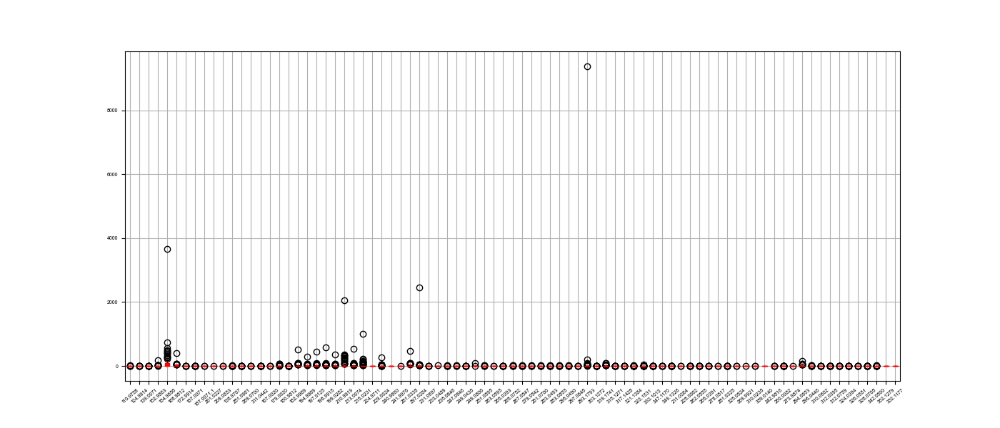

In [30]:
_ = df7.iloc[:,data_start:].boxplot(patch_artist=True,color='red',rot = 40,figsize = fsize,fontsize=5)

Παρατηρούμε οτι τα δεδομένα έχουν αρκετές έκτροπες τιμές. Αυτές θα μπορούσαν να οφείλονται σε γεγονότα που σχετίζονται με τη δειγματοληψία, όπως για παράδειγμα "dust events" κλπ. Γενικά χρειάζονται διαιρεύνηση.

##### Για τους Καλοκαιρινούς Μήνες

###### $PM_{10}$

In [31]:
describe_with_range(coarse_summer)

,110.9758,124.9914,139.0071,152.9863,154.9656,168.9812,172.9914,187.0071,187.0071.1,201.0227,...,296.0446,310.0602,312.0395,312.0759,324.0394,326.0551,328.0708,342.0500,362.1279,382.1177
count,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00,...,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00
mean,2.39,0.54,0.53,20.39,448.53,45.33,0.01,0.04,0.01,0.01,...,2.17,0.18,0.01,0.10,0.28,0.68,0.31,1.00,0.01,0.01
std,3.19,0.61,0.68,37.86,759.63,82.24,0.00,0.11,0.00,0.00,...,4.80,0.28,0.00,0.15,0.60,1.31,0.50,1.61,0.00,0.00
min,0.10,0.01,0.01,1.29,35.67,3.95,0.01,0.01,0.01,0.01,...,0.31,0.01,0.01,0.01,0.01,0.01,0.01,0.09,0.01,0.01
25%,1.32,0.25,0.24,5.06,147.28,15.57,0.01,0.01,0.01,0.01,...,0.67,0.01,0.01,0.01,0.07,0.01,0.11,0.35,0.01,0.01
50%,1.81,0.38,0.38,9.79,264.01,24.92,0.01,0.01,0.01,0.01,...,0.99,0.01,0.01,0.01,0.15,0.46,0.19,0.47,0.01,0.01
75%,2.13,0.57,0.61,22.39,423.53,42.10,0.01,0.01,0.01,0.01,...,1.65,0.29,0.01,0.16,0.24,0.74,0.35,0.76,0.01,0.01
max,15.91,2.79,3.28,180.66,3665.60,396.98,0.01,0.49,0.01,0.01,...,22.92,0.81,0.01,0.44,2.85,6.20,2.38,6.28,0.01,0.01
range,15.81,2.79,3.27,179.38,3629.93,393.04,0.00,0.48,0.00,0.00,...,22.61,0.81,0.00,0.43,2.84,6.19,2.38,6.19,0.00,0.00


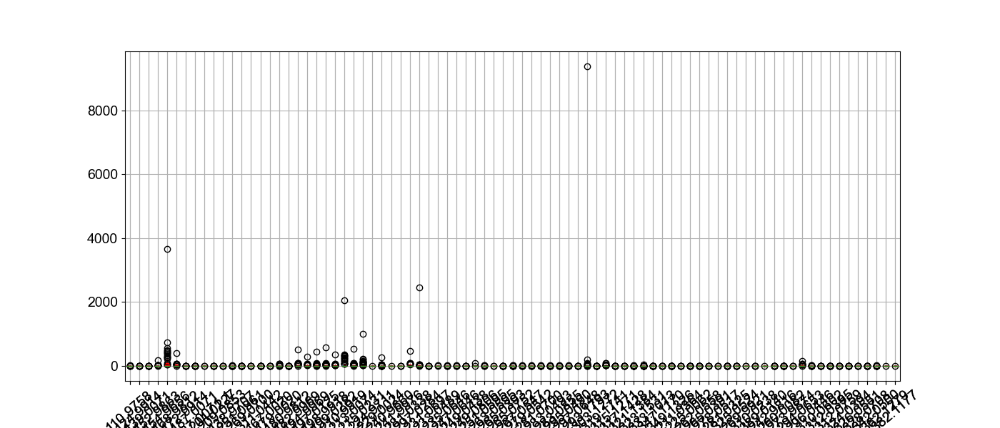

In [32]:
_ = coarse_summer.iloc[:,data_start:].boxplot(patch_artist=True,rot = 40,figsize = fsize,fontsize=14)

###### $PM_{2.5}$

In [33]:
describe_with_range(fine_summer)

,110.9758,124.9914,139.0071,152.9863,154.9656,168.9812,172.9914,187.0071,187.0071.1,201.0227,...,296.0446,310.0602,312.0395,312.0759,324.0394,326.0551,328.0708,342.0500,362.1279,382.1177
count,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00,...,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00
mean,2.39,0.54,0.53,20.39,448.53,45.33,0.01,0.04,0.01,0.01,...,2.17,0.18,0.01,0.10,0.28,0.68,0.31,1.00,0.01,0.01
std,3.19,0.61,0.68,37.86,759.63,82.24,0.00,0.11,0.00,0.00,...,4.80,0.28,0.00,0.15,0.60,1.31,0.50,1.61,0.00,0.00
min,0.10,0.01,0.01,1.29,35.67,3.95,0.01,0.01,0.01,0.01,...,0.31,0.01,0.01,0.01,0.01,0.01,0.01,0.09,0.01,0.01
25%,1.32,0.25,0.24,5.06,147.28,15.57,0.01,0.01,0.01,0.01,...,0.67,0.01,0.01,0.01,0.07,0.01,0.11,0.35,0.01,0.01
50%,1.81,0.38,0.38,9.79,264.01,24.92,0.01,0.01,0.01,0.01,...,0.99,0.01,0.01,0.01,0.15,0.46,0.19,0.47,0.01,0.01
75%,2.13,0.57,0.61,22.39,423.53,42.10,0.01,0.01,0.01,0.01,...,1.65,0.29,0.01,0.16,0.24,0.74,0.35,0.76,0.01,0.01
max,15.91,2.79,3.28,180.66,3665.60,396.98,0.01,0.49,0.01,0.01,...,22.92,0.81,0.01,0.44,2.85,6.20,2.38,6.28,0.01,0.01
range,15.81,2.79,3.27,179.38,3629.93,393.04,0.00,0.48,0.00,0.00,...,22.61,0.81,0.00,0.43,2.84,6.19,2.38,6.19,0.00,0.00


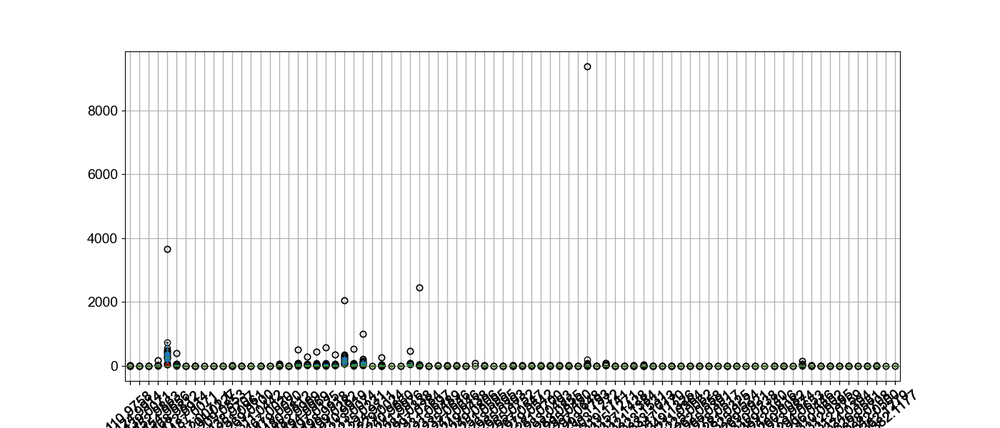

In [34]:
_ = fine_summer.iloc[:,data_start:].boxplot(patch_artist=True,rot = 40,figsize = fsize)

Η κατάσταση είναι παρόμοια και για τα $PM_{2.5}$ όμως οι κατάνομες φαίνονται πιο συμμετρικές, με λιγότερες έκτροπες τιμές.

##### Για τους Χειμερινούς Μήνες

###### $PM_{10}$

In [35]:
describe_with_range(coarse_winter)

,110.9758,124.9914,139.0071,152.9863,154.9656,168.9812,172.9914,187.0071,187.0071.1,201.0227,...,296.0446,310.0602,312.0395,312.0759,324.0394,326.0551,328.0708,342.0500,362.1279,382.1177
count,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00,...,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00
mean,2.39,0.54,0.53,20.39,448.53,45.33,0.01,0.04,0.01,0.01,...,2.17,0.18,0.01,0.10,0.28,0.68,0.31,1.00,0.01,0.01
std,3.19,0.61,0.68,37.86,759.63,82.24,0.00,0.11,0.00,0.00,...,4.80,0.28,0.00,0.15,0.60,1.31,0.50,1.61,0.00,0.00
min,0.10,0.01,0.01,1.29,35.67,3.95,0.01,0.01,0.01,0.01,...,0.31,0.01,0.01,0.01,0.01,0.01,0.01,0.09,0.01,0.01
25%,1.32,0.25,0.24,5.06,147.28,15.57,0.01,0.01,0.01,0.01,...,0.67,0.01,0.01,0.01,0.07,0.01,0.11,0.35,0.01,0.01
50%,1.81,0.38,0.38,9.79,264.01,24.92,0.01,0.01,0.01,0.01,...,0.99,0.01,0.01,0.01,0.15,0.46,0.19,0.47,0.01,0.01
75%,2.13,0.57,0.61,22.39,423.53,42.10,0.01,0.01,0.01,0.01,...,1.65,0.29,0.01,0.16,0.24,0.74,0.35,0.76,0.01,0.01
max,15.91,2.79,3.28,180.66,3665.60,396.98,0.01,0.49,0.01,0.01,...,22.92,0.81,0.01,0.44,2.85,6.20,2.38,6.28,0.01,0.01
range,15.81,2.79,3.27,179.38,3629.93,393.04,0.00,0.48,0.00,0.00,...,22.61,0.81,0.00,0.43,2.84,6.19,2.38,6.19,0.00,0.00


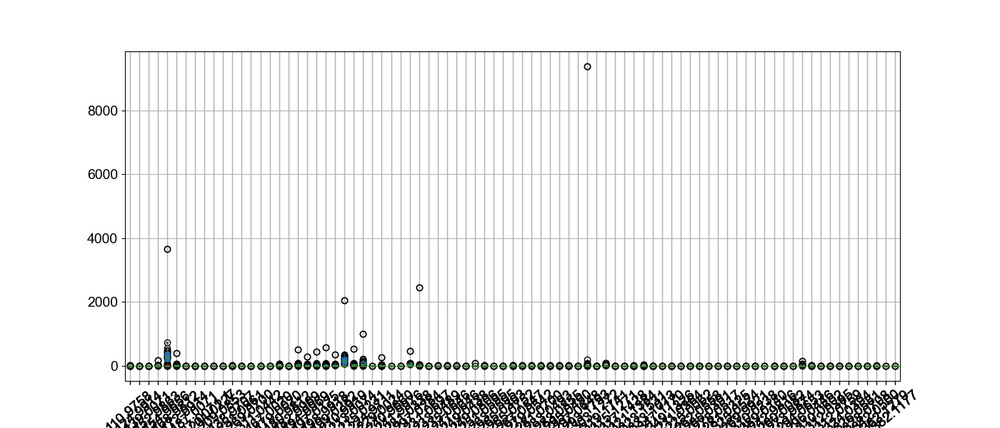

In [36]:
_ = coarse_winter.iloc[:,data_start:].boxplot(patch_artist=True,rot = 40, figsize = fsize)

###### $PM_{2.5}$

In [37]:
describe_with_range(fine_winter)

,110.9758,124.9914,139.0071,152.9863,154.9656,168.9812,172.9914,187.0071,187.0071.1,201.0227,...,296.0446,310.0602,312.0395,312.0759,324.0394,326.0551,328.0708,342.0500,362.1279,382.1177
count,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00,...,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00,21.00
mean,2.39,0.54,0.53,20.39,448.53,45.33,0.01,0.04,0.01,0.01,...,2.17,0.18,0.01,0.10,0.28,0.68,0.31,1.00,0.01,0.01
std,3.19,0.61,0.68,37.86,759.63,82.24,0.00,0.11,0.00,0.00,...,4.80,0.28,0.00,0.15,0.60,1.31,0.50,1.61,0.00,0.00
min,0.10,0.01,0.01,1.29,35.67,3.95,0.01,0.01,0.01,0.01,...,0.31,0.01,0.01,0.01,0.01,0.01,0.01,0.09,0.01,0.01
25%,1.32,0.25,0.24,5.06,147.28,15.57,0.01,0.01,0.01,0.01,...,0.67,0.01,0.01,0.01,0.07,0.01,0.11,0.35,0.01,0.01
50%,1.81,0.38,0.38,9.79,264.01,24.92,0.01,0.01,0.01,0.01,...,0.99,0.01,0.01,0.01,0.15,0.46,0.19,0.47,0.01,0.01
75%,2.13,0.57,0.61,22.39,423.53,42.10,0.01,0.01,0.01,0.01,...,1.65,0.29,0.01,0.16,0.24,0.74,0.35,0.76,0.01,0.01
max,15.91,2.79,3.28,180.66,3665.60,396.98,0.01,0.49,0.01,0.01,...,22.92,0.81,0.01,0.44,2.85,6.20,2.38,6.28,0.01,0.01
range,15.81,2.79,3.27,179.38,3629.93,393.04,0.00,0.48,0.00,0.00,...,22.61,0.81,0.00,0.43,2.84,6.19,2.38,6.19,0.00,0.00


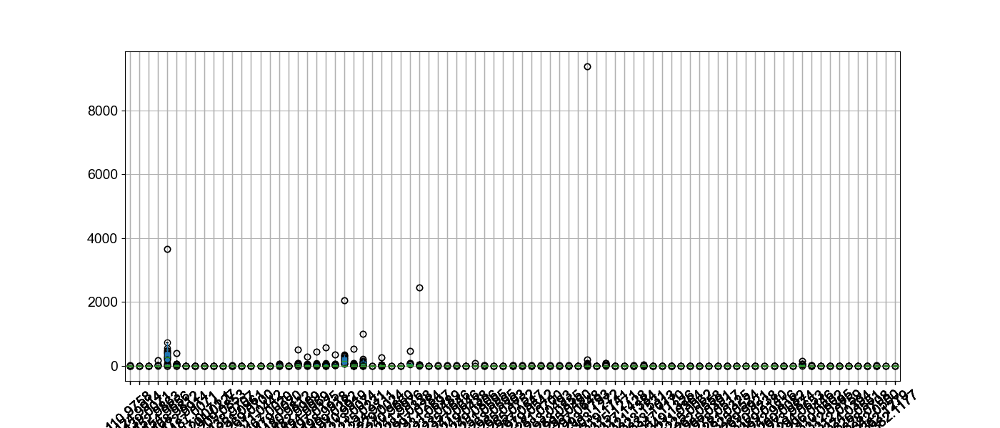

In [38]:
_ = fine_winter.iloc[:,data_start:].boxplot(patch_artist=True,rot = 40, figsize = fsize)

Συνολικά, οι κατανομές κάθε ιόντος είναι αρκετα παραμορφωμένες, με πολλαπλές έκτροπες τιμές. Ωστόσο οι τιμές για το καλοκαίρι είναι πιο καθαρές από τον χειμώνα και τα λεπτόκοκκα περισσότερο συμμετρικά από τα χονδρόκοκκα.

Εξαιτάζουμε τα κατά ζεύγοι διάγραμματα διασποράς διερευνόντας για προφανείς σχέσεις μεταξύ των μεταβλητών. Λόγο πολύ μεγάλου αριθμού παραμέτρων, έγινε ομαδοποίηση

### Διαγράμματα Διασποράς Κατά Ζεύγοι

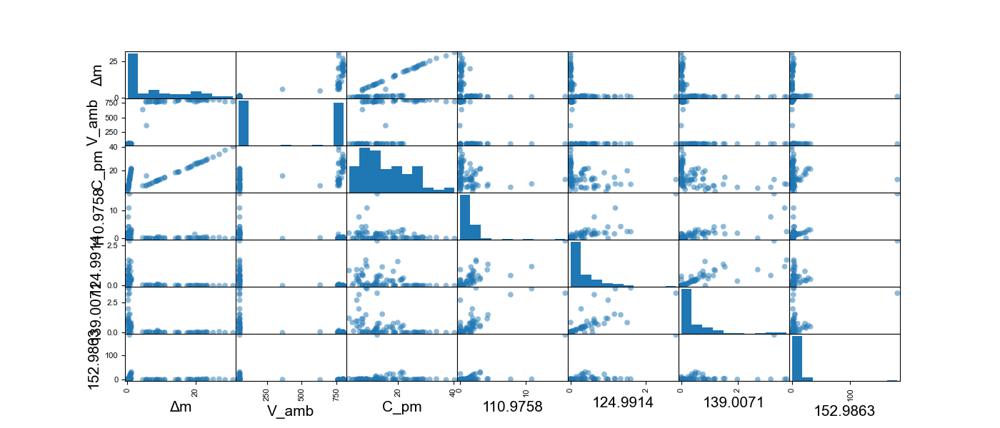

In [39]:
_ = pd.plotting.scatter_matrix(df7.iloc[:,3:10],figsize = fsize,s=125)

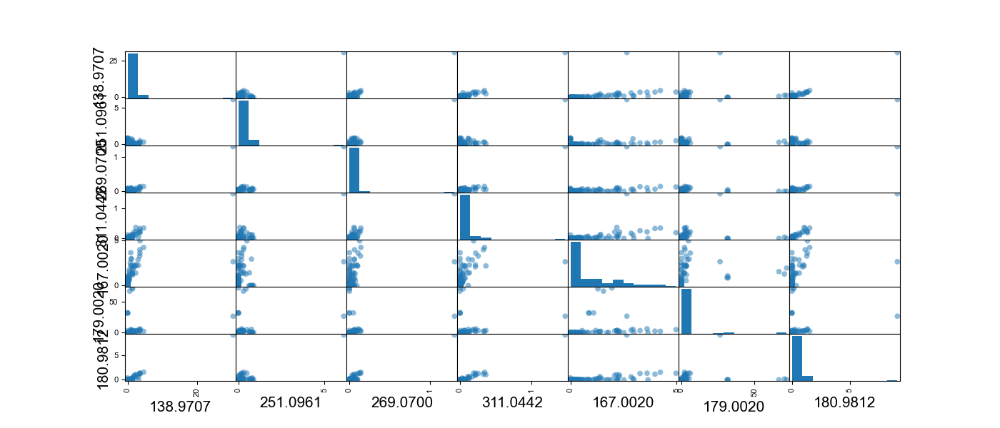

In [40]:
_ = pd.plotting.scatter_matrix(df7.iloc[:,17:24],figsize = fsize,s=125)

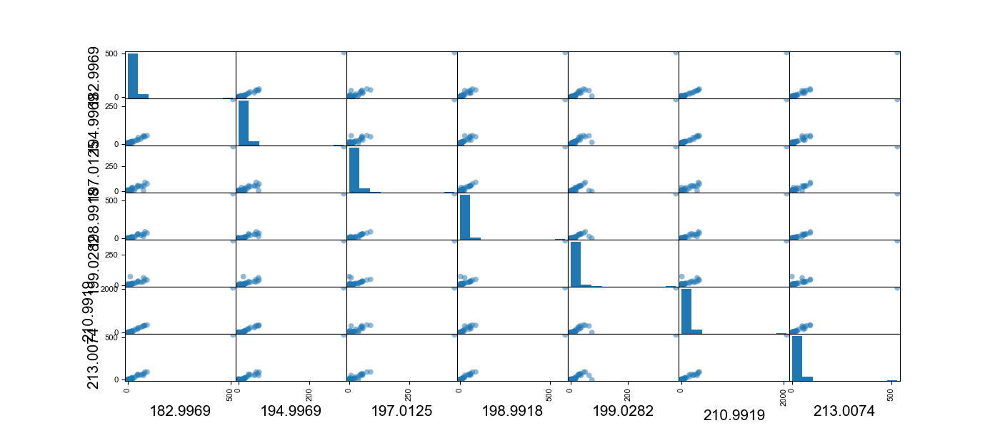

In [41]:
_ = pd.plotting.scatter_matrix(df7.iloc[:,24:31],figsize = fsize,s=125)

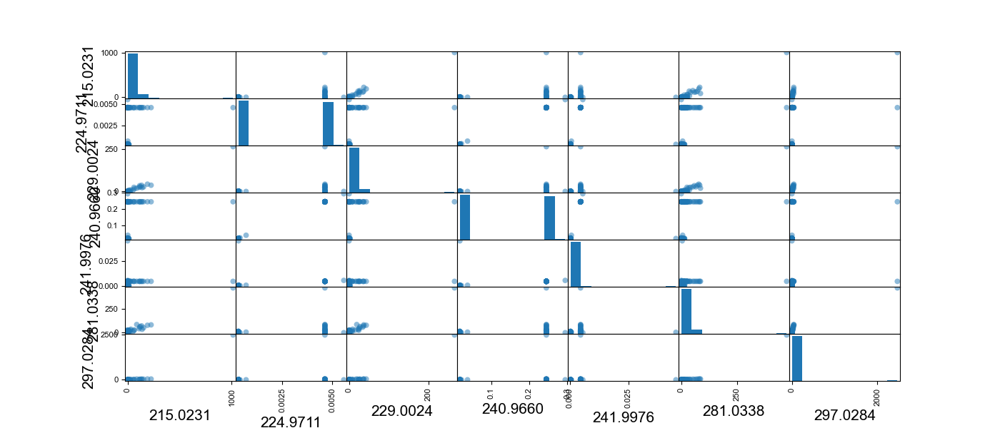

In [42]:
_ = pd.plotting.scatter_matrix(df7.iloc[:,31:38],figsize = fsize,s=125)

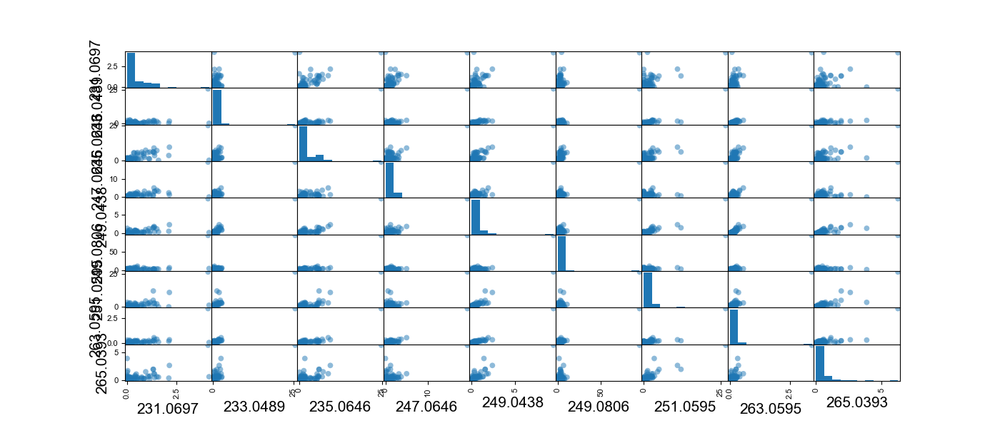

In [43]:
_ = pd.plotting.scatter_matrix(df7.iloc[:,38:47],figsize = fsize,s=125)

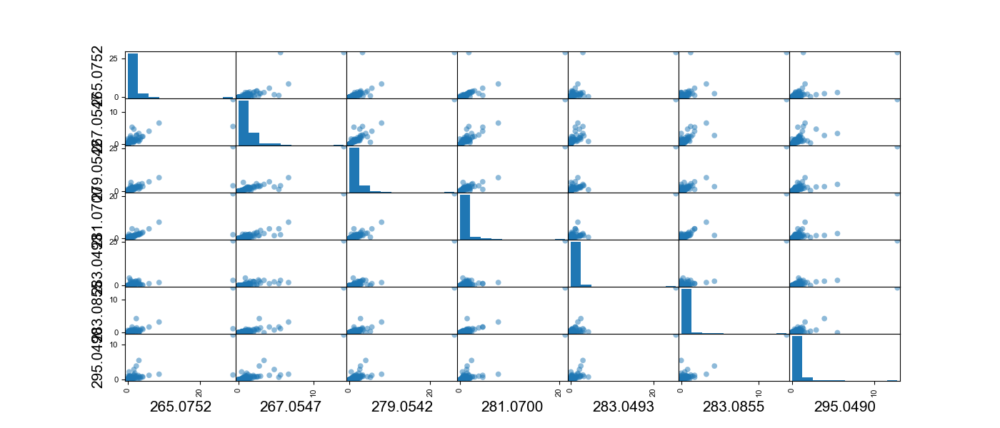

In [44]:
_ = pd.plotting.scatter_matrix(df7.iloc[:,47:54],figsize = fsize,s=125)

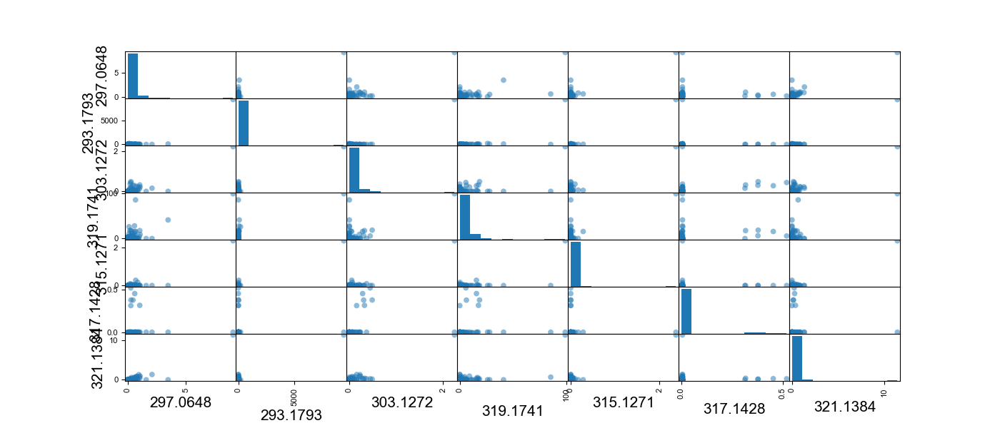

In [45]:
_ = pd.plotting.scatter_matrix(df7.iloc[:,54:61],figsize = fsize,s=125)

Υπάρχουν αρκετά ιόντα που φαίνεται να σχηματίζουμε γραμμικές σχέσεις μεταξύ τους. Επίσης παρατηρούμε οτι τα συνολικά διαγράμματα κόβονται σε δύο τμήματα, που πιθανότητα αντιστοιχούν σε διαφορετικές κατανομές για τα $PM_{10}$ και $PM_{2.5}$. Σε αυτές τις περιπτώσεις οι σχέσεις είναι ίδιας γενικής μορφής - συνήθως γραμμικές, με διαφορετικές παραμέτρους. Επομένως, περεταίρω μελέτη θα πρέπει να τα εξαιτάσει χωριστά.

### Συμμεταβλητότητα

Εξαιτάζουμε τη συμμεταβλητότητα μεταξύ των ιόντων, διερευνόντας τις αλληλοεξαρτήσεις τους.

In [46]:
# Covariance matrix
df7.cov()

,PM,Δm,V_amb,C_pm,110.9758,124.9914,139.0071,152.9863,154.9656,168.9812,...,296.0446,310.0602,312.0395,312.0759,324.0394,326.0551,328.0708,342.0500,362.1279,382.1177
PM,14.231928,27.801461,1351.906627,15.782769,-3.996287,-1.093293,-1.716039,-20.203465,-446.879493,-50.382705,...,-3.761139,-1.388738,-0.576536,-0.681261,-0.701841,-1.570024,-1.020451,-3.191718,-0.011553,-0.011553
Δm,27.801461,80.810894,2738.480741,63.852985,-7.647677,-2.174176,-3.438919,-36.667153,-826.628623,-92.856974,...,-7.223900,-2.809516,-1.141957,-1.307075,-1.398448,-3.102095,-1.970218,-6.348608,-0.022668,-0.022668
V_amb,1351.906627,2738.480741,130810.287705,1578.479691,-378.432422,-103.912576,-162.983694,-1912.911465,-42323.873778,-4768.049905,...,-355.523462,-132.248921,-54.656047,-64.446828,-66.704637,-149.004335,-96.647668,-303.122308,-1.100439,-1.100439
C_pm,15.782769,63.852985,1578.479691,72.931574,-4.455169,-1.293494,-2.827897,-2.789137,-90.258044,-18.724383,...,-4.857662,-2.579473,-1.106913,-1.153795,-1.036812,-2.371529,-1.455578,-6.336922,-0.012970,-0.012970
110.9758,-3.996287,-7.647677,-378.432422,-4.455169,5.346639,0.860499,1.445622,34.436728,696.014662,78.298886,...,6.195787,0.454353,0.218259,0.208709,0.763127,1.350494,0.746129,1.589733,0.003240,0.003240
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
326.0551,-1.570024,-3.102095,-149.004335,-2.371529,1.350494,0.270631,0.386213,12.968377,258.610947,28.433658,...,1.887548,0.210132,0.094144,0.074728,0.243378,1.583483,0.326054,1.007894,0.001269,0.001269
328.0708,-1.020451,-1.970218,-96.647668,-1.455578,0.746129,0.187906,0.286267,4.649657,87.780920,11.220892,...,0.973887,0.323029,0.166156,0.170197,0.167828,0.326054,0.304871,1.017454,0.000825,0.000825
342.0500,-3.191718,-6.348608,-303.122308,-6.336922,1.589733,0.521380,0.604295,13.152768,247.022712,31.123142,...,2.351599,0.994419,0.584078,0.430011,0.399062,1.007894,1.017454,11.615213,0.002569,0.002569
362.1279,-0.011553,-0.022668,-1.100439,-0.012970,0.003240,0.000885,0.001393,0.016255,0.360175,0.040707,...,0.003031,0.001130,0.000468,0.000555,0.000565,0.001269,0.000825,0.002569,0.000009,0.000009


In [47]:
def get_covariance_heatmap(df:pd.DataFrame,lower:int,upper:int)->None:
    fig,ax = plt.subplots( figsize = (fsize[0],fsize[1]*2))
    data = df.iloc[:,3:].iloc[:,lower:upper].corr()
    ax.matshow(df1.corr())
    ax.set_xticks(range(data.select_dtypes(['number']).shape[1]), data.select_dtypes(['number']).columns, rotation=45,fontsize = 8)
    ax.set_yticks(range(data.select_dtypes(['number']).shape[1]), data.select_dtypes(['number']).columns, fontsize = 8)
    im = ax.imshow(data.values, cmap='inferno')
    fig.colorbar(im, orientation='vertical')
    ax.set_title('Χάρτης Θερμότητας Συσχετίσεων')

Απεικονίζουμε τη συμμεταβλητότητα κατά ζεύγοι σε χάρτη θερμότητας (*heatmap*)

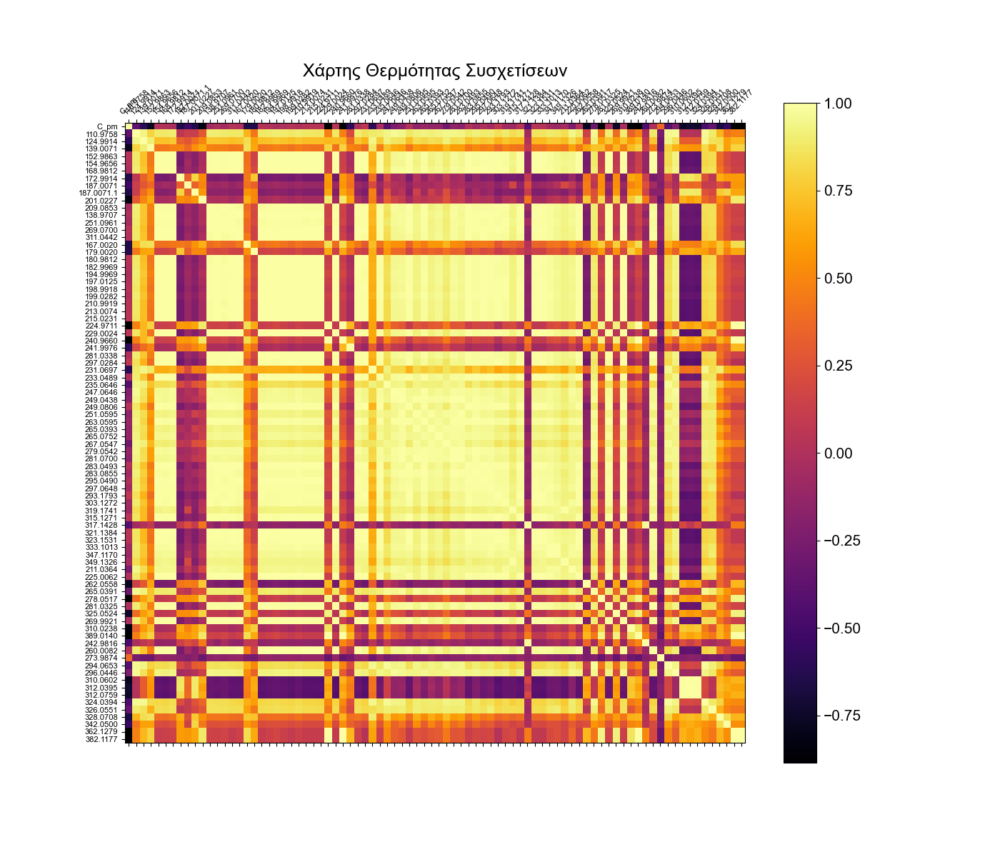

In [48]:
get_covariance_heatmap(df7.corr(),0,len(df7))

Όπως φαίνεται συνολικά στον άνω χάρτη θερμότητας, τα περισσότερα ιόντα σχετίζονται μεταξύ τους, και σχεδόν κανένα δεν σχετίζεται με το Δm και $C_m$. Ορισμένα ιόντα φαίνεται να είναι αμετάβλητα σε κάθε άλλο ιόν ή μετρούμενη παράμετρο, όπως για παράδειγμα τα 241,9976 και 201,0071 (methyl Benzyl Sulfate). Η συμπεριφορά τους αυτή έχει ενδιαφέρον και θα μπορούσε να δηλώνη διαφορετικά προέλευση ή και μηχανισμό σχηματισμού.

In [49]:
def fit_linear_model(df:pd.DataFrame,feature1:str,feature2:str)->float:
    # Split the data into training/testing sets
        X_train,X_test,y_train,y_test = train_test_split(df[feature1],df[feature2],random_state=5)
        LR =LinearRegression()
        LR.fit(X_train.values.reshape(-1,1),y_train.values)
        return {'model':LR,'score':LR.score(X_test.values.reshape(-1,1),y_test)}

In [50]:
def get_combinations(df:pd.DataFrame)->None:
    cols = df.columns.values
    return list(combinations(cols,2))

In [51]:
def mass_r_sqrd(df:pd.DataFrame,combs:list)->dict:
    output = {}
    for col1, col2 in combs:
        try:
            output[col1] = fit_linear_model(df,col1,col2)
        except ValueError:
            continue
    return output

In [52]:
combs = get_combinations(df7.iloc[:,3:])

### Διερεύνιση Έκτροπων Τιμών

In [53]:
def outliers_to_list(df:pd.DataFrame,cols_excluded_end:int=6,idx_col:int=0)->list[namedtuple]:
    '''
    Takes a non-formatted dataframe as an arguement,
    detects outliers column-wise (values exceeding 3 standard deviations)
    and returns a list of namedtuples with Sample and ion info
    for later confirmation
    '''
    sample_col = df.iloc[:,idx_col]
    preprocessed_df = df.iloc[:,cols_excluded_end:]
    outlier = namedtuple("Outlier", ["Sample","Ion"])
    boolframe = np.abs(scipy.stats.zscore(preprocessed_df)) > 3
    outliers = list()
    for col in boolframe.columns:
        this = boolframe.loc[:,col]
        row = this[this.eq(True)]
        row_indices = row.index.values
        if np.size(row_indices,axis=0):
            for idx in row_indices:
                idx_str = sample_col.loc[idx]
                outliers.append(
                outlier(Sample = idx_str, Ion = col)
                )
        else:
            continue
    return outliers

Έκτροπες τιμές προς διερεύνηση στα $PM_{2.5}$

In [54]:
o1 = outliers_to_list(fine, cols_excluded_end = data_start, idx_col=0)
_ = pd.DataFrame(data=o1, columns=["Sample","Ion"])
_

,Sample,Ion
0,emep_l2.5_190,110.9758
1,emep_l2.5_190,124.9914
2,emep_l2.5_190,152.9863
3,emep_l2.5_190,154.9656
4,emep_l2.5_190,168.9812
...,...,...
83,emep_l2.5_190,326.0551
84,emep_l2.5_12,328.0708
85,emep_l2.5_11,342.0500
86,emep_l2.5_7,362.1279


Έκτροπες τιμές προς διερεύνηση στα $PM_{10}$

In [55]:
o2 = outliers_to_list(coarse,cols_excluded_end = data_start, idx_col =0)
_ = pd.DataFrame(data=o2, columns=["Sample","Ion"])
_

,Sample,Ion
0,emep_h10_12,110.9758
1,emep_h10_341,124.9914
2,emep_h10_341,139.0071
3,emep_h10_216,154.9656
4,emep_h10_216,168.9812
...,...,...
68,emep_h10_216,273.9874
69,emep_h10_193,296.0446
70,emep_h10_193,312.0395
71,emep_h10_190,362.1279


### Συγκρίσεις Ομαδοποιημένων Δεδομένων

In [56]:
def get_all_group_sums(df:pd.DataFrame,exc_grps:list[str]=["mnapOS","napOS"])->dict:
    groups = excluded_groups(ions['Group'].unique().tolist(), exc_grps)
    sums = {}
    for group in groups:
        x=ions[ions['Group'] == group].loc[:,"Exact mass"].tolist()
        sums[group] = df[x].sum(axis=1).sum(axis=0)
    return sums

In [57]:
def get_barchart_per_category(df:pd.DataFrame,width=0.8,**kwargs):
    fig, ax =plt.subplots()
    kwargs = defaultdict(lambda x: 'None',kwargs)
    grouped_sums = get_all_group_sums(df)
    x = np.arange(len(grouped_sums.keys()))
    ax.bar([str(i) for i in grouped_sums.keys()], height=[grouped_sums[i] for i in grouped_sums.keys()])
    ax.set_xticks(x,[i for i in grouped_sums.keys()],rotation = 40)
    ax.set_xlabel(kwargs['xlabel'])
    ax.set_ylabel(kwargs['ylabel'])
    ax.set_title(kwargs['title'],wrap=True)
    fig.set_size_inches(fsize, forward = True)
    return fig,ax

def get_barchart_per_category_descriptives_only(df:pd.DataFrame, other:Optional[pd.DataFrame]=None,
                                                width = 0.8, xlabel:Optional[str] = "" ,ylabel:Optional[str] = "",
                                                title:Optional[str] = "",
                                                one_label:Optional[str]= None, other_label:Optional[str] = None) -> None:
    fig,ax = plt.subplots()
    X = np.arange(df.shape[0])
    Y = df["$\mu$"].values
    Yerr = df["$\sigma$"].values
    pos = X
    if other is not None:
        pos =X-width/2
    ax.bar(X,Y,yerr=Yerr, width = width/2,color = "orange",ecolor='gray', capsize=6,
          label = one_label)
    if other is not None:
        ax.bar(
            X + width/2 ,
            other["$\mu$"],
            yerr = other["$\sigma$"],
            color="steelblue",width=width/2,ecolor='gray', capsize=6, label = other_label)
        ax.legend()
    ax.set_xticks(X, df.index, rotation=40)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title(title,wrap=True)
    fig.set_size_inches(fsize, forward=True)
    return  fig,ax

#### $PM_{10}$ Καλοκαίρι - Μέσες και Ολικές Συγκεντρώσεις

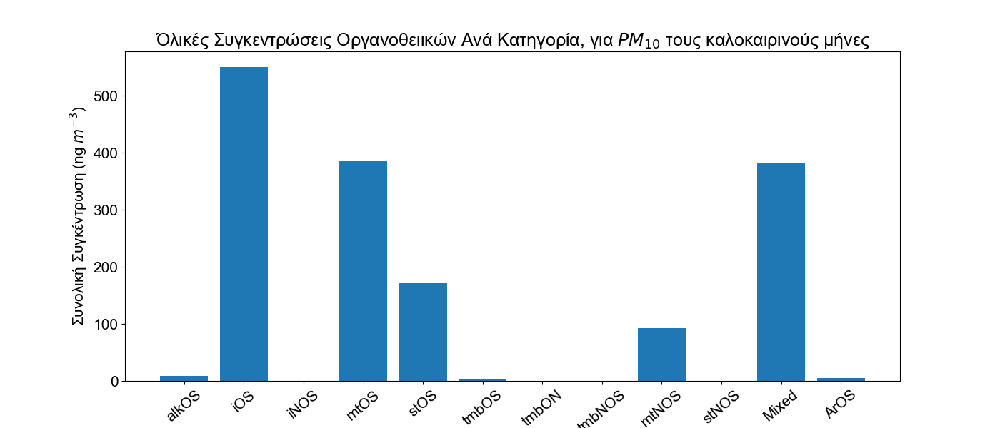

In [58]:
x = get_barchart_per_category(coarse_summer,
                              xlabel = 'Κατηγορία Οργανοθειικών',ylabel='Συνολική Συγκέντρωση (ng $m^{-3}$)',
                              title='Όλικές Συγκεντρώσεις Οργανοθειικών Ανά Κατηγορία, για $PM_{10}$ τους καλοκαιρινούς μήνες')
plt.savefig(join(base_fpath, "coarse_summer_total.png"))

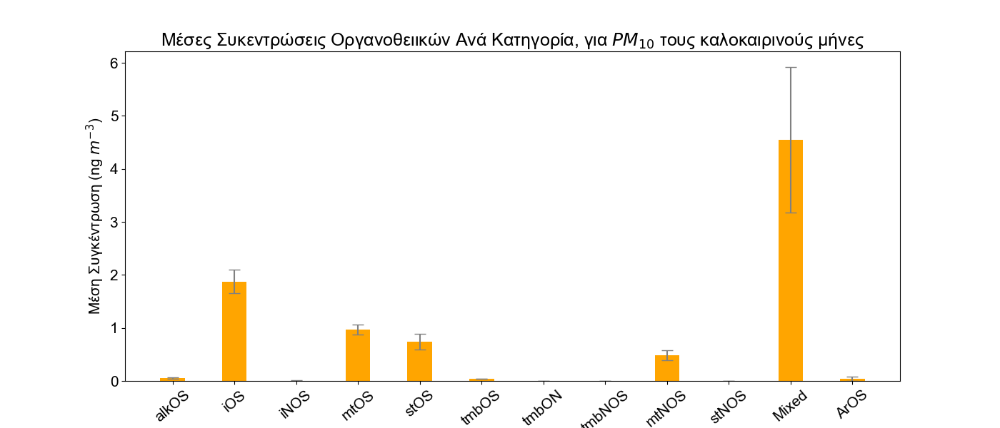

In [59]:
y = get_barchart_per_category_descriptives_only(transform_df_to_groups(coarse_summer, ions),
                                                xlabel = 'Κατηγορία Οργανοθειικών',ylabel='Μέση Συγκέντρωση (ng $m^{-3}$)',
                                                title='Mέσες Συκεντρώσεις Οργανοθειικών Ανά Κατηγορία, για $PM_{10}$ τους καλοκαιρινούς μήνες')
plt.savefig(join(base_fpath, "coarse_summer_total_avgs.png"))

Παρατηρούμε οτι πολλαπλές κατηγορίες έχουν μη ανιχνεύσιμες συγκεντρώσεις, συγκεγκριμένα, οι κατηγορίες των οργανονιτρικών παραγώγων ισοπρενίου (iNOS), αλειφατικών (alkOS) παραγώγων tmb (tmbOS,tmbON,tmbNOS), σισκετερπενικών οργανονιτρικών παραγώγων (stNOS) και ναφθαλενικών (napOS,mnapOS). Από τις υπόλοιπες κατηγορίες, επικρατούν τα ισοπρενικά παράγωγα (iOS) και ακολουθούν τα μονοτερπενικά και σισκετερπενικά παράγωγα.

#### $PM_{10}$ Χειμώνας - Ολικές και Μέσες Συγκεντρώσεις

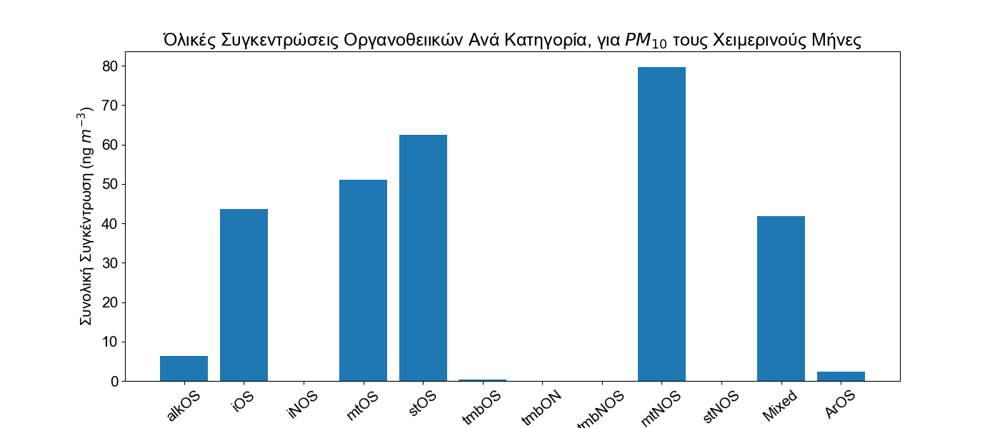

In [60]:
_ = get_barchart_per_category(coarse_winter,
                              xlabel = 'Κατηγορία Οργανοθειικών',ylabel='Συνολική Συγκέντρωση (ng $m^{-3}$)',
                              title='Όλικές Συγκεντρώσεις Οργανοθειικών Ανά Κατηγορία, για $PM_{10}$ τους Χειμερινούς Μήνες')
plt.savefig(join(base_fpath, "coarse_winter_total.png"))

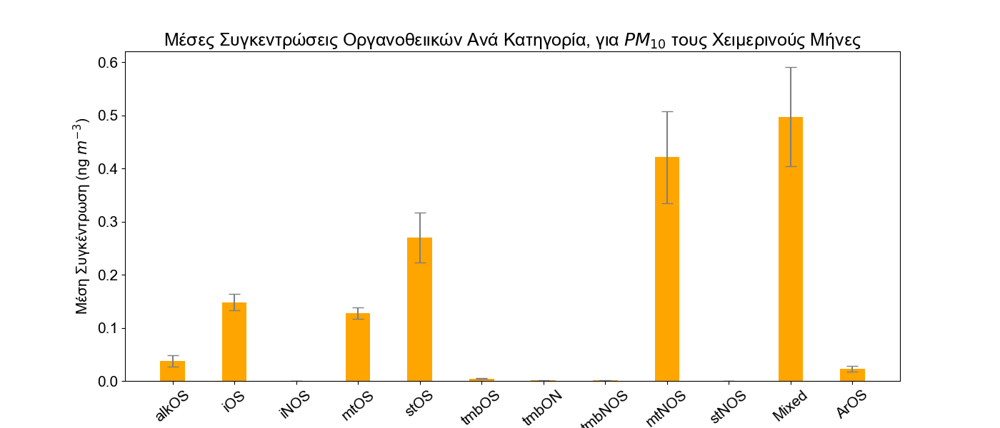

In [61]:
_ = get_barchart_per_category_descriptives_only(transform_df_to_groups(coarse_winter, ions),
                                                xlabel = 'Κατηγορία Οργανοθειικών',ylabel='Μέση Συγκέντρωση (ng $m^{-3}$)',
                                                title='Μέσες Συγκεντρώσεις Οργανοθειικών Ανά Κατηγορία, για $PM_{10}$ τους Χειμερινούς Μήνες',
                                                )
plt.savefig(join(base_fpath, "coarse_winter_total_avgs.png"))

Τον χειμώνα στα $PM_{10}$ παρατηρούμε οτι εμφανίζονται όλες οι κατηγορίες που εντοπίστικάν το καλοκαίρι, ωστόσο εμφανίζεται επιπλέον και η κατηγορία των μονοτερπενικών παραγώγων με νίτροομάδα και σουλφοεστερική ομάδα (mtNOS), η οποία μάλιστα επικρατεί ποσοτικά. Οι υπόλοιπες κατηγορίες εμφανίζουν μειωμένες συγκεντρώσεις εκτός των σισκετερπενικών.

#### $PM_{2,5}$ Καλοκαίρι - Μέσες και Ολικές Συγκεντρώσεις

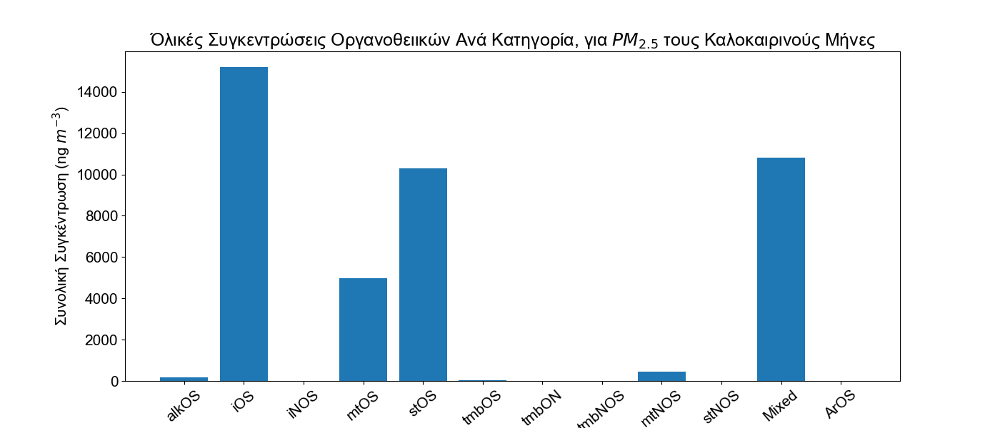

In [62]:
_ = get_barchart_per_category(fine_summer,
                              xlabel = 'Κατηγορία Οργανοθειικών',ylabel='Συνολική Συγκέντρωση (ng $m^{-3}$)',
                              title='Όλικές Συγκεντρώσεις Οργανοθειικών Ανά Κατηγορία, για $PM_{2.5}$ τους Καλοκαιρινούς Μήνες')
plt.savefig(join(base_fpath, "fine_summer_total.png"))

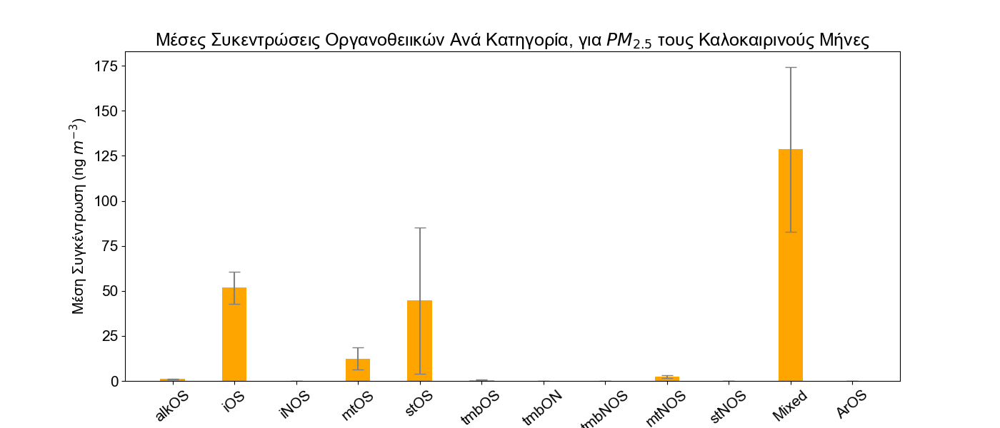

In [63]:
_ = get_barchart_per_category_descriptives_only(transform_df_to_groups(fine_summer, ions),
                                                xlabel = 'Κατηγορία Οργανοθειικών',ylabel='Μέση Συγκέντρωση (ng $m^{-3}$)',
                                                title='Mέσες Συκεντρώσεις Οργανοθειικών Ανά Κατηγορία, για $PM_{2.5}$ τους Καλοκαιρινούς Μήνες')
plt.savefig(join(base_fpath, "fine_summer_total_avgs.png"))

Στα $PM_{2.5}$ εμφανίζονται οι ίδιες κατηγορίες οργανοθειικών σε σημαντικά υψηλότερες συγκεντρώσεις και αναλογίες. Παρατηρούμε ιδιαίτερα μεγάλο τυπικό σφάλμα (standard error) και τυπική απόκλιση στην κατηγορία των σισκετερπενικών, κάτι που δηλώνει μεγάλο βαθμό μεταβλητότητας.

#### $PM_{2.5}$ Χειμώνας - Ολικές και Μέσες Συγκεντρώσεις

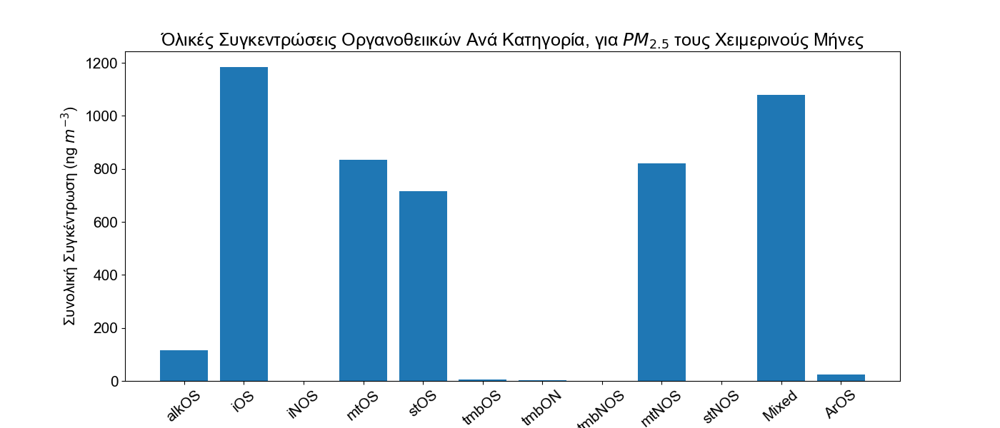

In [64]:
_ = get_barchart_per_category(fine_winter,
                              xlabel = 'Κατηγορία Οργανοθειικών',ylabel='Συνολική Συγκέντρωση (ng $m^{-3}$)',
                              title='Όλικές Συγκεντρώσεις Οργανοθειικών Ανά Κατηγορία, για $PM_{2.5}$ τους Χειμερινούς Μήνες')
plt.savefig(join(base_fpath, "fine_winter_total.png"))

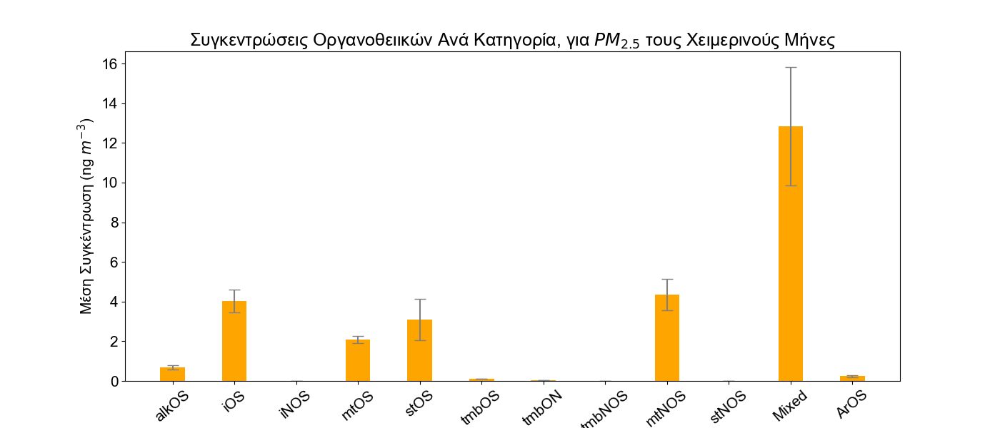

In [65]:
_ = get_barchart_per_category_descriptives_only(transform_df_to_groups(fine_winter, ions),
                                                xlabel = 'Κατηγορία Οργανοθειικών',ylabel='Μέση Συγκέντρωση (ng $m^{-3}$)',
                                                title='Συγκεντρώσεις Οργανοθειικών Ανά Κατηγορία, για $PM_{2.5}$ τους Χειμερινούς Mήνες',
                                                )
plt.savefig(join(base_fpath, "fine_winter_total_avgs.png"))

Και στα $PM_{2.5}$ του χειμώνα φαίνεται οτι παίζουν σημαντικό ρόλο τα οργανονιτρικά παράγωγα μονοτερπενίων (mtNOS). Η συνολική ως τώρα εικόνα φαίνεται να υπονοεί οτι τα οργανονιτρικά παράγωγα εμφανίζονται κατά κανόνα τους χειμερινούς μήνες, κάτι που πιθανότατα οφείλεται στη μειωμένη ηλιοφάνεια και θερμοκρασία αυτών των μηνών. Τα σισκετερπενικά πάλι φαίνεται να έχουν αυξημένη τυπικό σφάλμα σε σχέση με τις υπόλοιπες κατηγορίες, ενώ τα ισοπρενικά φαίνεται οτι σε όλες τις περιπτώσεις έχουν κατά προσέγγιση ίσο ή το μικρότερο. Αυτό θα μπορούσε να υποδηλώνει εξάρτηση ισοπρενικών από μικρότερο αριθμό ατμοσφαιρικών παραμέτρων λόγο μικρότερης μεταβλητότητας. Το αντίθετο θα ίσχυε για τα σισκετερπενικά, που είναι πιθανό να εξαρτονται από πολλαπλές παραμέτρους, άρα να έχουν και πολύπλοκη χημεία.

### Σύγκριση Κατηγοριών

### Σύγκριση Σωματιδίων - Ολικές και Μέσες Συγκεντρώσεις

#### Καλοκαίρι

In [66]:
def get_bar_comp(df1,df2, width=0.8,title=' ',xlabel=' ',ylabel=' ', cat_label1='$PM_{10}$', cat_label2='$PM_{2.5}$'):
    g1 = get_all_group_sums(df1)
    g2 = get_all_group_sums(df2)
    fig, ax = plt.subplots()
    labels = [key for key in g1.keys()]
    x = np.arange(len(labels))
    cat1 = ax.bar(x = x-width/2,height = [val for key,val in g1.items()],width=width,label=cat_label1,color='black')
    cat2 = ax.bar(x = x+width/2, height = [val for key,val in g2.items()], width= width,label=cat_label2,color='red')
    ax.grid(False)
    ax.set_xlabel(xlabel)
    ax.set_xticks(x,labels,rotation=40)
    ax.set_ylabel(ylabel)
    ax.set_title(title, wrap=True)
    ax.legend()
    fig.set_size_inches(fsize, forward=True)
    plt.show()

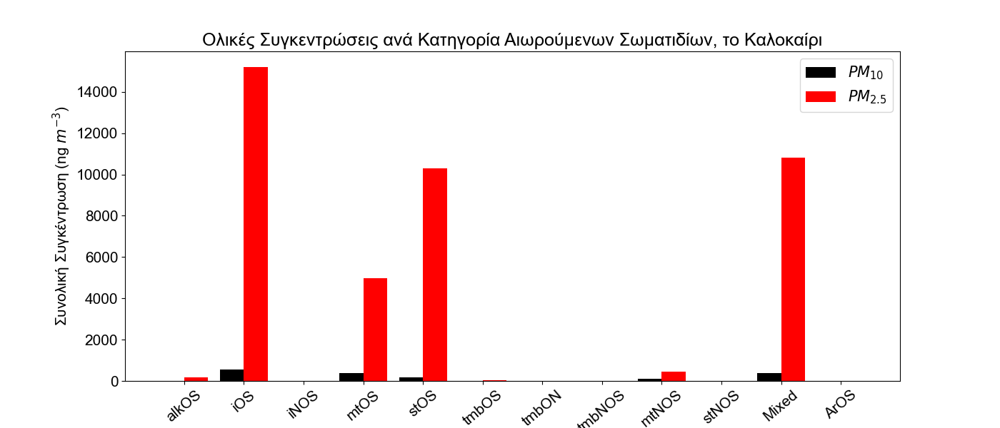

In [67]:
get_bar_comp(coarse_summer,fine_summer,width=0.4,title='Ολικές Συγκεντρώσεις ανά Κατηγορία Αιωρούμενων Σωματιδίων, το Καλοκαίρι', xlabel='Κατηγορία Οργανοθειικών',ylabel='Συνολική Συγκέντρωση (ng $m^{-3}$)')
plt.savefig(join(base_fpath, "pm_comp_summer.png"))

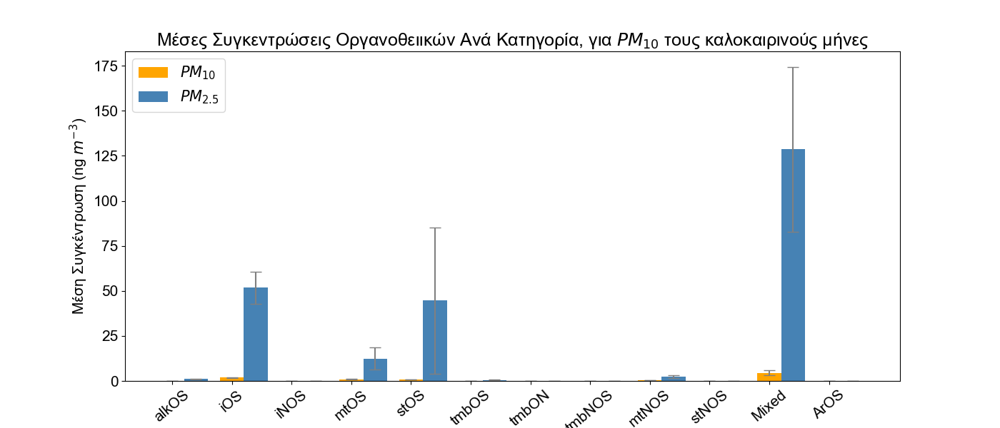

In [68]:
_ = get_barchart_per_category_descriptives_only(transform_df_to_groups(coarse_summer, ions),
                                                other = transform_df_to_groups(fine_summer,ions),
                                                xlabel = 'Κατηγορία Οργανοθειικών',ylabel='Μέση Συγκέντρωση (ng $m^{-3}$)',
                                                title='Μέσες Συγκεντρώσεις Οργανοθειικών Ανά Κατηγορία, για $PM_{10}$ τους καλοκαιρινούς μήνες',
                                                one_label = "$PM_{10}$",other_label = "$PM_{2.5}$")
plt.savefig(join(base_fpath, "pm_comp_summer_avgs.png"))

#### Χειμώνας

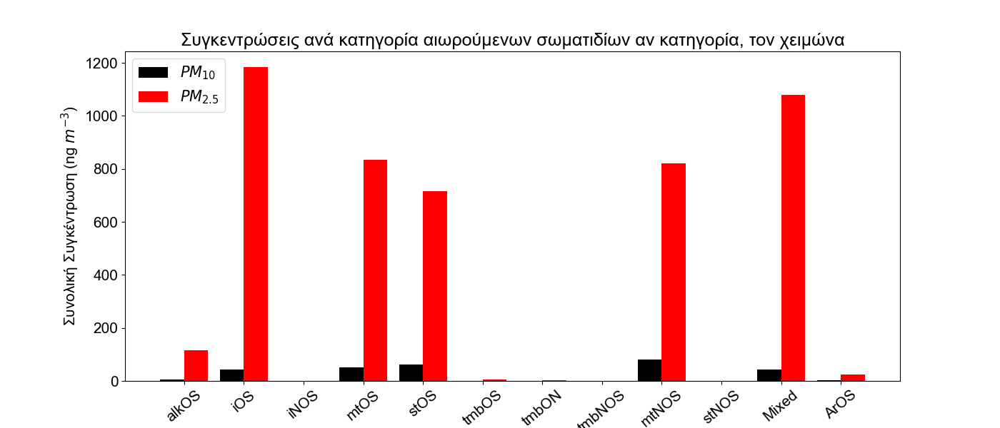

In [69]:
get_bar_comp(coarse_winter,fine_winter,width=0.4,title='Συγκεντρώσεις ανά κατηγορία αιωρούμενων σωματιδίων αν κατηγορία, τον χειμώνα', xlabel='Κατηγορία Οργανοθειικών',
             ylabel='Συνολική Συγκέντρωση (ng $m^{-3}$)')
plt.savefig(join(base_fpath, "pm_comp_winter.png"))

/tmp/ipykernel_29063/2364672327.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots()


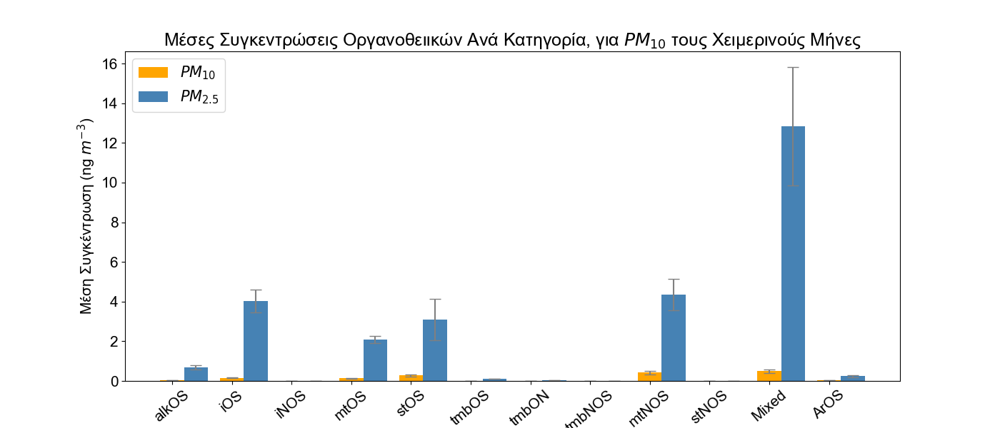

In [70]:
_ = get_barchart_per_category_descriptives_only(transform_df_to_groups(coarse_winter, ions),
                                                other = transform_df_to_groups(fine_winter,ions),
                                                xlabel = 'Κατηγορία Οργανοθειικών',ylabel='Μέση Συγκέντρωση (ng $m^{-3}$)',
                                                title='Μέσες Συγκεντρώσεις Οργανοθειικών Ανά Κατηγορία, για $PM_{10}$ τους Χειμερινούς Μήνες',
                                                one_label = "$PM_{10}$",other_label = "$PM_{2.5}$")
plt.savefig(join(base_fpath, "pm_comp_winter_avgs.png"))

Και στις δύο εποχές τα συνολικά συμπεράσματα έιναι παρόμοια. Από ποσοτικής απόψεως  οι συγκεντρώσεις για κάθε ανιχνεύσιμη κατηγορία είναι πολλαπλές τάξεις μεγέθους μεγαλύτερες στα $PM_{2.5}$ απ' ότι στα $PM_{10}$. Επίσης είναι εμφανείς και η δραμματική αύξηση της συγκέντρωσης των mtNOS τους χειμερινούς μήνες. Αυτό είναι πιθανό να οφείλεται σε κυρίως δύο παράγωντες
1. Οι κατηγορίες των ισοπρενικών, μονοτερπενικών (χωρίς νιτρική ομάδα) και σισκετερπενικών εμφανίζουν σημαντικά ισχυρότερη εξάρτηση από τη θερμοκρασία σε σχέση με τα οργανονιτρικά παράγωγα μονοτερπενίων. Λόγο μειωμένων θερμοκρασιών τους χειμερινούς μήνες, η συγκέντρωση των πρώτων είναι έντονα μειωμένη, αλλά η συγκέντρωση των mtNOS λιγότερο (είναι λιγότερο ευαίσθητη ποσοτικά, σε μεταβολές θερμοκρασίας)
2. Ο σχηματισμός των NOS θα μπορούσε να ευνοείται σε συνθήκες χαμηλές έντασης ηλιακής ακτινοβολίας. Σε αυτή τη περίπτωση η διαφορά θα μπορούσε να αποδωθεί σε αύξηση της συγκέντρωσης των mtNOS κυρίως λόγο μειωμένης ακτινοβολίας.

Οι δύο αυτές πιθανές εξηγήσεις δεν είναι αμηβαίως αποκλειώμενες και θα μπορούσαν να ισχύουν ταυτόχρόνα. Ακριβέστερη περιγραφή θα μπορούσε να δωθεί με παράλληλες μετρήσεις έντασης ηλιακής ακρινοβολίας ($I_{sol}$) και θερμοκρασίας $T$. Με κατάλληλη μοντελοποίηση αυτών των εξαρτήσεων στατιστικώς σημαντική σχέση μορφής $\hat{ \beta^T_{iOS,mtOS,etc}}> \hat{ \beta_{mtNOS}}$, όπου $\hat{\beta^T_{iOS,mtOS,etc}},\ \hat{\beta^T_{mtNOS}}$ εκτιμήτριες κάποιας έννοιας "ευθαισθησίας" ως προς τις μεταβολές θερμοκρασίας. Με την ίδια λογική, στατιστικώς σημαντικό μοντέλο μορφής $C_{mtNOS}=f({\hat{I_{sol}}})$ θα αιτιολογούσε τη δεύτερη πιθανή εξήγηση.

### Σύγκριση Εποχών - Ολικές και Μέσες Συγκεντρώσεις

#### $PM_{10}$

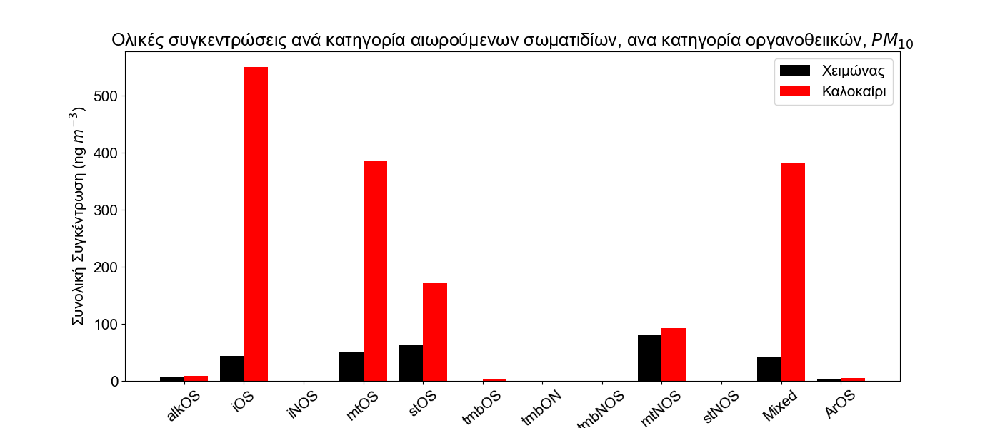

In [71]:
get_bar_comp(coarse_winter,coarse_summer,width=0.4,title='Ολικές συγκεντρώσεις ανά κατηγορία αιωρούμενων σωματιδίων, ανα κατηγορία οργανοθειικών, $PM_{10}$',
             xlabel='Κατηγορία Οργανοθειικών',ylabel='Συνολική Συγκέντρωση (ng $m^{-3}$)',cat_label1="Χειμώνας",cat_label2="Καλοκαίρι")
plt.savefig(join(base_fpath, "seasons_comp_coarse.png"))

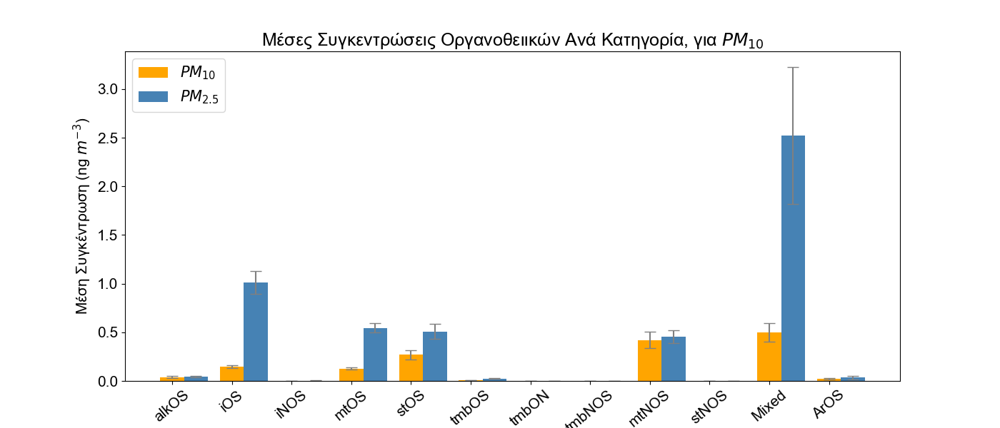

In [72]:
_ = get_barchart_per_category_descriptives_only(transform_df_to_groups(coarse_winter, ions),
                                                other = transform_df_to_groups(coarse,ions),
                                                xlabel = 'Κατηγορία Οργανοθειικών',ylabel='Μέση Συγκέντρωση (ng $m^{-3}$)',
                                                title='Μέσες Συγκεντρώσεις Οργανοθειικών Ανά Κατηγορία, για $PM_{10}$',
                                                one_label = "$PM_{10}$",other_label = "$PM_{2.5}$")
plt.savefig(join(base_fpath, "seasons_comp_coarse_avgs.png"))

#### $PM_{2.5}$

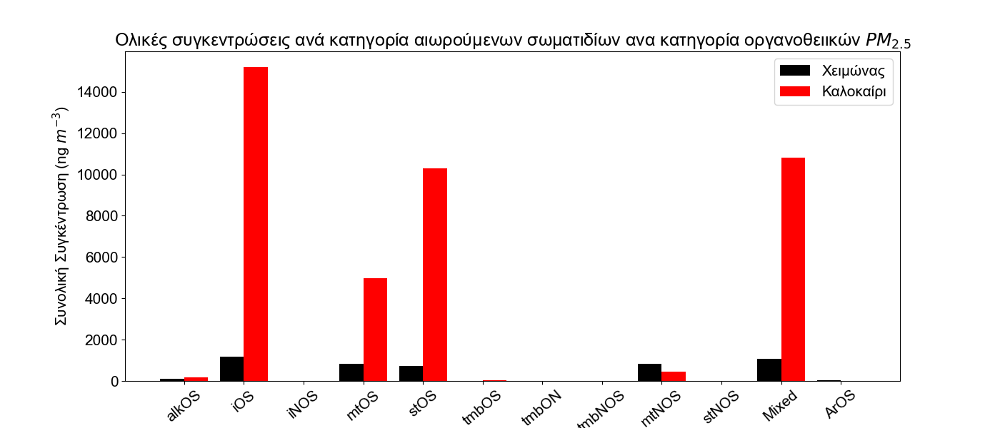

In [73]:
get_bar_comp(fine_winter,fine_summer,width=0.4,title='Ολικές συγκεντρώσεις ανά κατηγορία αιωρούμενων σωματιδίων ανα κατηγορία οργανοθειικών'\
             ' $PM_{2.5}$', xlabel='Κατηγορία Οργανοθειικών',ylabel='Συνολική Συγκέντρωση (ng $m^{-3}$)',cat_label1="Χειμώνας",cat_label2="Καλοκαίρι")
plt.savefig(join(base_fpath, "seasons_comp_fine.png"))

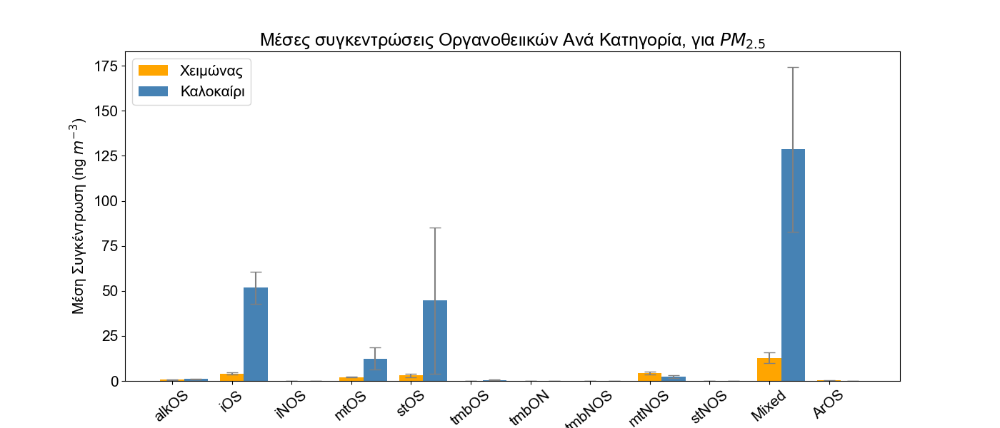

In [74]:
_ = get_barchart_per_category_descriptives_only(transform_df_to_groups(fine_winter, ions),
                                                other = transform_df_to_groups(fine_summer,ions),
                                                xlabel = 'Κατηγορία Οργανοθειικών',ylabel='Μέση Συγκέντρωση (ng $m^{-3}$)',
                                                title='Μέσες συγκεντρώσεις Οργανοθειικών Ανά Κατηγορία, για $PM_{2.5}$',
                                                one_label = "Χειμώνας",other_label = "Καλοκαίρι")
plt.savefig(join(base_fpath, "seasons_comp_fine_avgs.png"))

Ως προς τις εποχιακές συγκρίσεις συμπεραίνουμε οτι ποσοτικά όλες οι κατηγορίας είναι σημαντικά αυξημένες τους καλοκαιρνούς μήνες με μοναδική εξαίρεση τα mtNOS που προαναφέρθηκαν.

### Κατηγορίες Ως Κλάσματα Συνόλου

In [75]:
def sums_to_total_fractions(sums:dict)->dict:
    total = sum([val for _,val in sums.items()])
    return {key: (val/total)*100 for key,val in sums.items()}
def plot_total_fractions(df,title='',xlabel='',ylabel=''):
    total_fractions = sums_to_total_fractions(get_all_group_sums(df7))
    fig,ax = plt.subplots(figsize = fsize)
    x = np.arange(len([key for key in total_fractions.keys()]))
    ax.bar(x, height=[val for _,val in total_fractions.items()])
    ax.set_xticks(x,[key for key in total_fractions.keys()],rotation = 40)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title(title,wrap=True)
    return    

#### Ολικό Κλάσμα

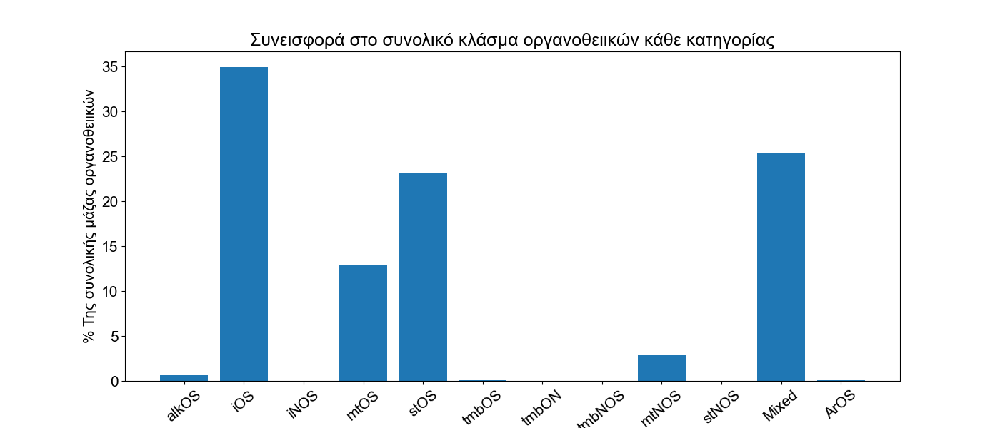

In [76]:
plot_total_fractions(df7.iloc[:,6:],title = 'Συνεισφορά στο συνολικό κλάσμα οργανοθειικών κάθε κατηγορίας',xlabel = 'Κατηγορία Οργανοθειικών',
                     ylabel='% Της συνολικής μάζας οργανοθειικών')
plt.savefig(join(base_fpath, "fractions_total.png"))

Συνολικά η κατηγορία των ισοπρενικών επικρατεί, απαρτίζοντας το 35% τις συνολικής μάζας οργανοθειικών, και τα σισκετερπενικά με τα περίππου 25%. Τα μονοτερπενικά αποτελούν ένα σχετικά μικρό κλάσμα, περίππου το 15% και τα οργανονιτρικά μόλις το 5%.

#### Σύγκριση Εποχών

In [77]:
def plot_total_fractions_comparison(df1,df2,width=0.4,title='',xlabel='',ylabel='',cat_label1='',cat_label2=''):
    g1 = sums_to_total_fractions(get_all_group_sums(df1))
    g2 = sums_to_total_fractions(get_all_group_sums(df2))
    fig, ax = plt.subplots(figsize = fsize)
    labels = [key for key in g1.keys()]
    x = np.arange(len(labels))
    cat1 = ax.bar(x = x-width/2,height = [val for key,val in g1.items()],width=width,label=cat_label1)
    cat2 = ax.bar(x = x+width/2, height = [val for key,val in g2.items()], width= width,label=cat_label2)
    ax.grid(False)
    ax.set_xlabel(xlabel)
    ax.set_xticks(x,labels,rotation=40)
    ax.set_ylabel(ylabel)
    ax.set_title(title, wrap=True)
    ax.legend()


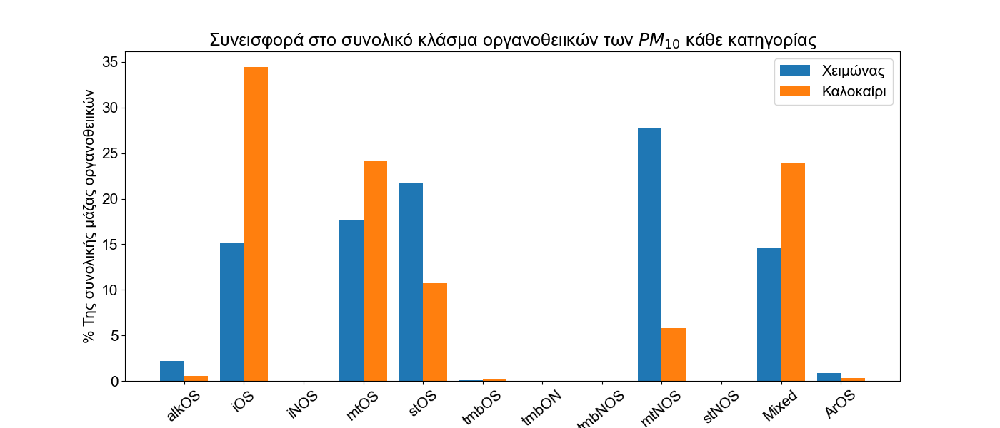

In [78]:

plot_total_fractions_comparison(coarse_winter,coarse_summer,title = 'Συνεισφορά στο συνολικό κλάσμα οργανοθειικών των $PM_{10}$ κάθε κατηγορίας',
                                xlabel = 'Κατηγορία Οργανοθειικών',ylabel='% Της συνολικής μάζας οργανοθειικών',cat_label1='Χειμώνας',cat_label2='Καλοκαίρι')
plt.savefig(join(base_fpath, "fractions_seasons_comp_coarse" + ".png"))

Από άποψης εποχιακής σύγκρισης στα $PM_{10}$ η κατανομή της συνολική ποσότητας των οργανοθειικών στις επιμέρους δομικές κατηγορίες διαφοροποιείται. Το καλοκαίρι επικρατούν τα ισοπρενικά, απαρτίζοντας ως και το 35% αλλά τον χειμώνα μειώνονται μόλις στο 15%. Τα κλάσμα των μονοτερπενικών φαίνεται να έχει σημαντικά μικρότερη εποχιακή εξάρτηση από μειώνεται από το 25% περίππου στο 17%. Τα σισκετερπενικά έμφανίζουν ενδιαφέρουσα συμπεριφορά. Το χειμώνα απαρτίζουν αυξημένο κλάσμα του συνόλου (~23%) και το καλοκαίρι μειωμένο (12%). Εξίσου δραμματική διαφοροποίηση έχουν και τα mtNOS που απαρατίζουν μόλις το 5% το καλοκαίρι αλλά το 30% τον χειμώνα.

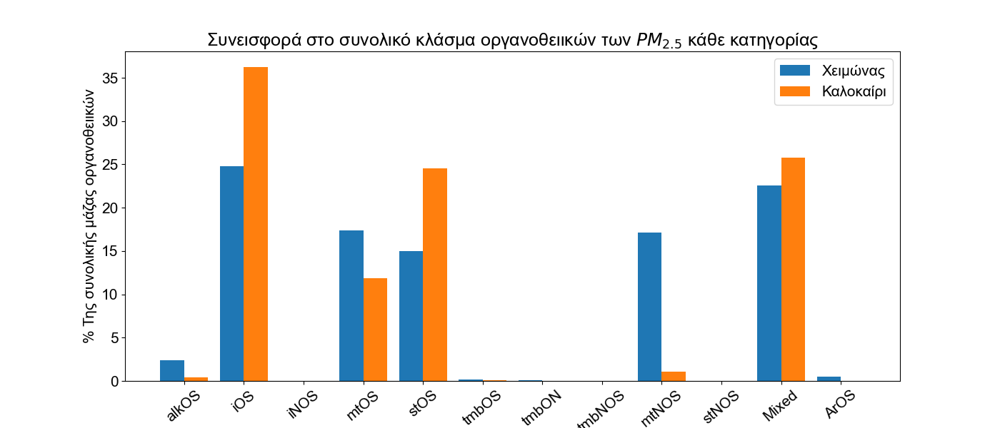

In [79]:

plot_total_fractions_comparison(fine_winter,fine_summer,title = 'Συνεισφορά στο συνολικό κλάσμα οργανοθειικών των $PM_{2.5}$ κάθε κατηγορίας',
                                xlabel = 'Κατηγορία Οργανοθειικών',ylabel='% Της συνολικής μάζας οργανοθειικών',cat_label1='Χειμώνας',cat_label2='Καλοκαίρι')
plt.savefig(join(base_fpath, "fractions_seasons_comp_fine" + ".png"))

#### Σύγκριση Σωματιδίων

Η εικόνα στη περίπτωση των $PM_{2.5}$ είναι ποιότικά παρόμοια αλλά ποσοτικά διαφερερική. Η διαφοροποίηση των ισοπρενικών είναι λιγότερο έντονη μεταξύ των εποχών (~10% μείωση έναντι 20%). Τα μονοτερπενικά και σισκετερπενικά εμφανίζουν περίππου τις ίδιες διαφοροποιήσεις (ως κλάσματα), ενώ στη περίπτωση των mtNOS η εποχιακή τους εξάρτηση φαίνεται εντονότερη. Απαρτίζουν σχεδόν μηδενικό κλάσμα της συνολικής μάζας οργανοθειικών στα $PM_{2.5}$ το καλοκαίρι και περίππου 20% το χειμώνα. Φαίνεται επομένως οτι τα όρια τους είναι μειωμένα στα $PM_{2.5}$.

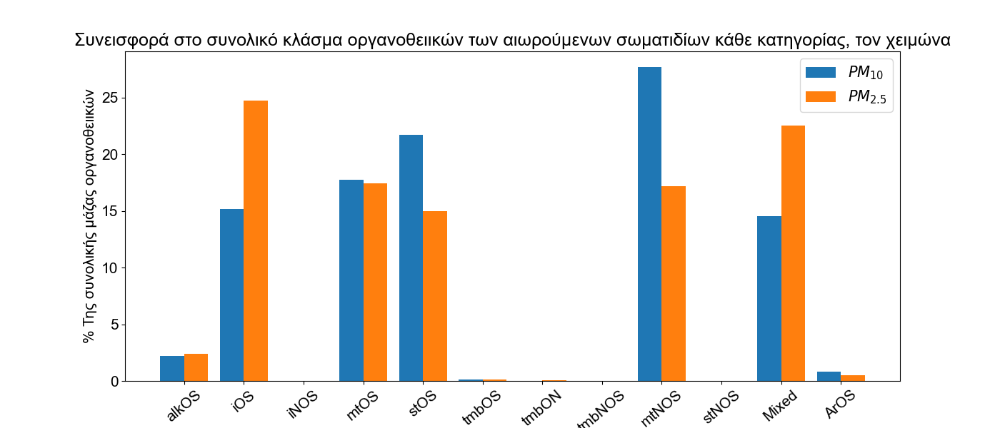

In [80]:
plot_total_fractions_comparison(coarse_winter,fine_winter,title = 'Συνεισφορά στο συνολικό κλάσμα οργανοθειικών των αιωρούμενων σωματιδίων κάθε κατηγορίας, τον χειμώνα',
                                xlabel = 'Κατηγορία Οργανοθειικών',ylabel='% Της συνολικής μάζας οργανοθειικών',cat_label1='$PM_{10}$',cat_label2='$PM_{2.5}$')
plt.savefig(join(base_fpath, "fractions_pm_comp_winter" + ".png"))

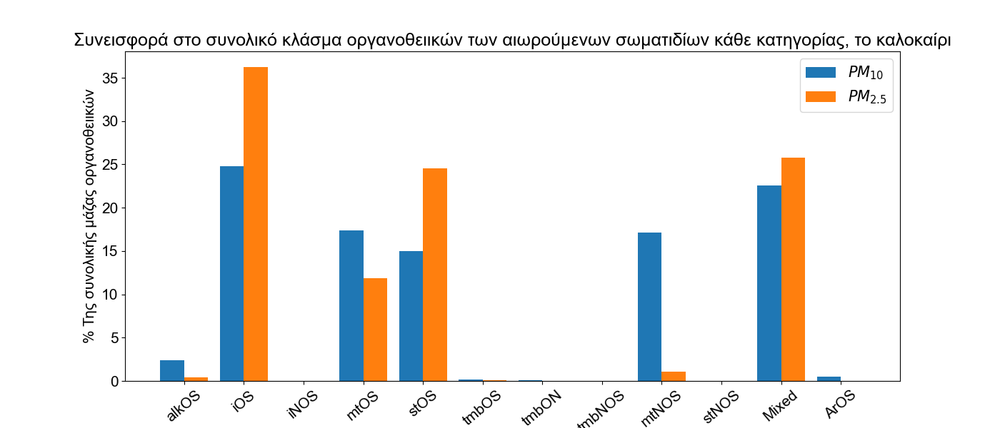

In [81]:
plot_total_fractions_comparison(fine_winter,fine_summer,title = 'Συνεισφορά στο συνολικό κλάσμα οργανοθειικών των αιωρούμενων σωματιδίων κάθε κατηγορίας, το καλοκαίρι',
                                xlabel = 'Κατηγορία Οργανοθειικών',ylabel='% Της συνολικής μάζας οργανοθειικών',cat_label1='$PM_{10}$',cat_label2='$PM_{2.5}$')
plt.savefig(join(base_fpath, "fractions_pm_comp_fine" + ".png"))

Συγκρίνοντας τις δύο κατηγορίες μεταξύ τους, βλέπουμε οτι τα ισοπρενικά αποτελούν μεγαλύτερο κλάσμα μάζας και στις δύο εποχές στα $PM_{2.5}$ απ' ότι στα $PM_{10}$. Τα mtOS είναι αποτελούν περίππου το ίδιο κλάσμα μάζας στα δύο σωματίδια τον χειμώνα και ελαφρώς μεγαλύτερο κλάσμα συγκέντρωσης στα $PM_{10}$ το χειμώνα. Τα mtNOS δείχνουν μια ισχυρή προτίμηση στα $PM_{10}$ και στις δύο εποχές, αλλά απουσιάζουν σχεδόν από τα $PM_{2.5}$ το καλοκαίρι, όχι όμως το χειμώνα, όπου αποτελούν ένα μη αμεληταίο κλάσμα μάζας. Τα μονοτερπενικά είναι αποτελούν περίππου ίσο κλάσμα μάζας και στους δύο τύπους σωματιδίων και στις δύο εποχές, ενώ τα σισκετερπενικά αποτελούν μεγαλύτερο ποσοστό επί του συνόλου στα $PM_{10}$ τον χειμώνα, ενό το καλοκαίρι αντίστροφα. Η διαφοροποίηση όμως δεν είναι ιδιαίτερα μεγάλη.

### Χρονοσειρές

In [82]:
def get_all_group_sums_rowwise(df:pd.DataFrame,dates:pd.Series,exc_groups:list[str] = ["mnapOS","napOS"])->pd.DataFrame:
    groups = excluded_groups(ions['Group'].unique().tolist())
    timeseries = pd.DataFrame(columns=[key for key in get_all_group_sums(df.iloc[:,6:]).keys()])
    for group in groups:
        x=ions[ions['Group'] == group].loc[:,"Exact mass"].tolist()
        timeseries[group] = df[x].sum(axis=1)
    timeseries = pd.concat([timeseries, dates],axis=1)
    return timeseries

In [83]:
def get_timeseries(df:pd.DataFrame,title:str='',xlabel:str='',ylabel:str='',
                   lwidth:int=2,msize:int=10 ,grps:Optional[list[str]]=None,exc_grps:list[str] = ["mnapOS,napOS"])->None:
    data = get_all_group_sums_rowwise(df,df['Date'],exc_grps)
    groups = data.columns.tolist()
    groups.remove('Date')
    x = np.arange(len(data.Date))
    fig, ax = plt.subplots()
    if grps:
        groups = grps
    for group in groups:
        ax.scatter(x = x, y = data[group].tolist(),s=msize, label=group)
        ax.plot(x, data[group].tolist(),linewidth=lwidth,linestyle='solid')
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_xticks(x, data['Date'].dt.date.tolist(),rotation=40,fontsize=10)
    ax.legend()
    fig.set_size_inches(fsize, forward=True)


#### Χρονοσειρές Ομάδων

##### $PM_{10}$

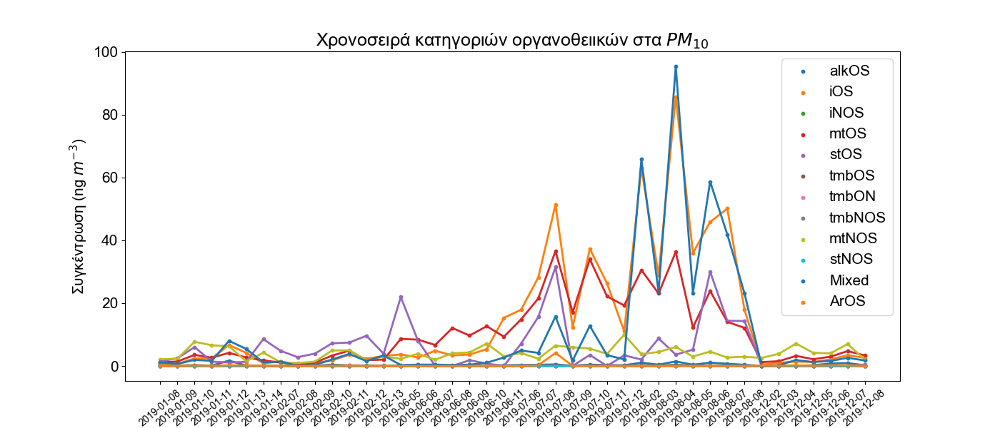

In [84]:
get_timeseries(coarse, title = 'Χρονοσειρά κατηγοριών οργανοθειικών στα $PM_{10}$',xlabel='Ημερομηνία δειγματοληψίας', ylabel = 'Συγκέντρωση (ng $m^{-3}$)')
plt.savefig(join(base_fpath, "timeseries_coarse" + ".png"))

##### $PM_{2.5}$

Στα $PM_{10}$ οι συγκρντρώσεις όλων των κατηγοριών εμφανίζουν αρκετά έντονες και πολύπλοκες μεταπτώσεις σε σχέση με τον χρόνο, και σε διαφορετικές ημέρες η επικρατούσα κατηγορία διαφέρει. Τα οργνανονιτρικά μονοτερπενικά είναι γενικά από τα μικρότερα από ποσοτικής άποψης. Τα σισκετερπενικά εμφανίζουν εξαιρετικά έντονες μεταπτώσεις κάτι που συμβαδίζει με το αυξημένο τυπικό σφάλμα τους.
Ενδιαφέρον παρουσίαζει το γεγονός ότι τα οργανονιτρικά ισοπρενικά (iNOS) σημειώνουν από τις πιο έντονες μεταπτώσεις κατά τη διάρκεια του καλοκαιριού, τάση τους η οποία φαίνεται να σχετίζεται με τη συμπεριφορά των ισοπρενικών μόνο όμως από της μέση του καλοκαιριού και μετά. Εντός των καλοκαιρινών μηνών όλες οι ομάδες αυξάνονται σημαντικά και εμφανίζουν και έντονες ημερίσιες μεταπτώσεις με τα μονοτερπενικά να έχουν τις μικρότερες μεταπτώσεις. Ορισμένες ημέρες, συγκεκριμένες κατηγορίες κορυφώνονται (iOS,mtOS, iNOS), φαινομενικά με παράλληλο τρόπο. Εξαίρεση αποτελούν τα σισκετερπενικά τα οποία ακολουθούν τη γενική τάση κορύφωσης σε κάποιες περιπτώσεις όχι όμως σε όλες.

Βάση των άνω μπορούμε να ταυτοποιήσουμε δύο περιοχές της χρονοσειράς και οι δύο εντός του καλοκαιριού. Στη μία περιοχή φαίνεται οτι κάποια άγνωστη παράμετρος εξώθησε ορισμένα OS σε έντονη αύξομοίωση (iOS,iNOS,mtOS) όχι όμως τα σισκετερπενικά. Στην άλλη περιοχή κάποια άγνωστη παράμετρο εξώθησε τόσο πρώτα τρία, όσο και τα σισκετερπενικά σε αύξομοίωση. Και το χειμώνα όμως παρατηρείται ανάλογο γεγονότα. Τα σισκετερπενικά σημειώνουν έντονη αύξηση αυτές τις ημέρες όχι όμως οι υπόλοιπες κατηγορίες. Φαίνεται επίσης οτι τα iNOS έχουν τη περισσότερο απότομη εποχιακή εξάρτηση, διότι η αύξηση του καθυστερή σε σχέση με τις υπόλοιπες κατηγορίες και όταν συμβεί είναι σημαντικά εντονότερη. Εάν αυτές οι εποχιακές παράμετροι (πχ ένταση ακτιβολίας, θερμοκρασίας) υπάρχουν τότε θα αναμέναμε οτι τα iNOS θα έχουν τη μεγάλυτερη ευαισθησία στις μεταβολές τους.

Συμπερασματικά, η διαφοροποιημένες αυτές συμπεριφορές μπορούν να εξηγηθούν με δύο πιθανούς τρόπους:
1. Προτείνωντας μια άγνωστη μεταβλητή $\eta$ και προσαρμόζοντας κατάλληλα τις σχέσεις τον κατηγοριών με αυτή τη μεταβλητή.
   Σε αυτή το περίπτωση τα ιόντα των ομάδων iOS,iNOS και mtOS θα πρέπει να εμφανίζουν ένα είδος σχέσης με αυτή τη μεταβλητή
   γενικής μορφής $C_{iOS_j,iNOS_j,mtOS_j}=f(\eta)$ και τα σισκετερπενικά να εμφανίζουν διαφορετικού είδους σχέση, γενικής
   μορφής $C_{stOS_j}=f^{\prime}(\eta)$. Για παράδειγμα θα μπορούσε να είναι η $f(\eta)$ γραμμική με διαφορετική παραμετροποίηση
   μεταξύ των τριών ειδών ιόντων, και η $f^{\prime}(\eta)$ εκθετική (ή οτιδήποτε μη γραμμικό). Είναι γενικά εφικτό να
   προσδιοριστούν συναρτήσεις που ικανοποιούν αυτούς τους περιορισμούς, για παράδειμα η $f^{\prime}(\eta)$ θα μπορούσε να είναι
   σιγμοειδής ή ακόμη και συνδιασμός απλούστερων. Αυτό ωστόσο δεν φαίνεται ιδιαίτερα πιθανό, γιατί δεν θα αναμέναμε οι ατμοσφαιρικές
   παράμετροι να εμφανίζουν τόσο περίπλοκες και ιδιόμορφες εξαρτίσεις από μεταβλητές ατμοσφαιρικού ενδιαφέροντος.
2. Προτείνωντας $n$ ανεξάρτητες μεταβλητές -τόσες όσες και οι περιοζές διαφοροποιούμενης συμπεριφοράς. Στη προκέιμενη περίπτωση
   θα χρειαζόμασταν δύο στη συντηριτική εκτίμηση έως πέντε λαμβάνοντας υπ' όψιν και τα τοπικά μέγιστα συσκετερπενικών και
   iNOS του χειμώνα. Τότε για $\{\eta_1,\eta_2,\eta_3,\eta_4,\eta_5\}$, σε κάθε περιοχή διαφοροποιημένες συμπεριφοράς αποδίδουμε
   μια μεταβλητή με κατάλληλη εξάρτηση. Για παράδειγμα στις δύο περιοχές του καλοκαιριού θα μπορούσαν να αποδοθούν οι $\{\eta_1,\eta_2\}$
   , αντίστοιχα.Τότε θα είναι θα ήταν iOS,iNOS,mtOS και stOS ευαίσθητα στην $\eta_1$ και στην δεύτερη περιοχή, τα iOS,iNOS, και mtOS ευαίσθητα στις μεταβολές της $\eta_2$
   ενώ τα stOS όχι, ανάλογα για το μικρά τοπικά μέγιστα του χειμώνα.
   
Συνοψίζοντας οι χρονοσειρές των επιμέρους ομάδων μας οδηγούν στην πιθανότερη υπόθεση εργασίας οτι υπάρχουν πέντε ανεξάρτητες μεταβλητές που δεν μετρήθηκαν.

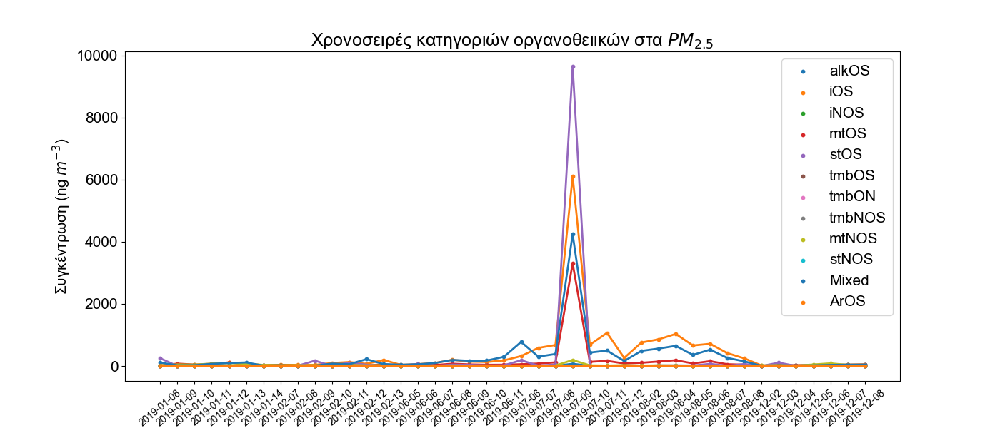

In [85]:
get_timeseries(fine, title = 'Χρονοσειρές κατηγοριών οργανοθειικών στα $PM_{2.5}$',xlabel='Ημερομηνία δειγματοληψίας', ylabel = 'Συγκέντρωση (ng $m^{-3}$)')
plt.savefig(join(base_fpath, "timeseries_fine" + ".png"))

Στα $PM_{2.5}$ οι χρονικές εξελίξεις των ομάδων είναι σημαντικά απλούστερες. Παρατηρείται ένα γεγονός κορύφωσης που συμπαρασέρνει και τις τέσσερεις ποσοτικά κυριότερες κατηγορίες και μάλιστα με αναλογικό τρόπο. Το γεγονός αυτό φαίνεται να αφορά τις 9-7-2019. Συνοπτικά οι χρονοσειρές ακολουθούν μια γενική τάση συστηματικά, με τα iOS να υπερτερούν ποσοτικά των iNOS και τα mtOS να ακολουθούν. Ποσοτικά μαλιστά οι μεταξύ τους αποστάσεις φαίνεται να παραμένουν περίππου σταθερές, και γενικά αυξημένες το καλοκαίρι κατά τα αναμενόμενα.

Ιδιαίτερα η διαφοροποίηση των $PM_10$ με τα $PM_{2.5}$ υποδηλώνει οτι οι συγκεντρώσεις στα δεύτερα δεν εξαρτόνται από άλλες παραμέτρους ενώ στα πρώτα υπεισέρχονται και άλλες παράμετοι. Αυτές θα μπορούσαν να είναι και χημικές, όπως άλλες ουσίες που έχουν προσροφηθεί στα σωματίδια αυτά. Πρέπει όμως εδώ να επισημανθεί και η σχεδόν πλήρει απουσία mtNOS στα $PM_{2.5}$ του καλοκαιριού.

#### Χρονοσειρές - Σύγκριση Σωματιδίων

In [86]:
def timeseries_latice(coarse:pd.DataFrame,fine:pd.DataFrame, figsize:tuple[int,int] = (20,25))->None:
    groups = ions['Group'].unique().tolist()
    fig,axs = plt.subplots(4,2, figsize = (fsize[0],fsize[1]*1.5))
    axs = np.reshape(axs,-1)
    x = np.arange(len(coarse.Date))
    xticks = np.arange(0,len(coarse.Date),2)
    labels = coarse['Date'].dt.date.tolist()
    labels = labels[1::2]
    for ax,group in zip(axs,groups):
        cols = ions[ions['Group'] == group].loc[:,"Exact mass"].tolist()
        y_coarse = coarse[cols].sum(axis=1).tolist()
        y_fine = fine[cols].sum(axis=1).tolist()
        ax.scatter(x = x, y = y_coarse,s=7)
        ax.plot(x,y_coarse,label='$PM_{10}$')
        ax.scatter(x = x, y=y_fine,s=7)
        ax.plot(x,y_fine,label='$PM_{2.5}$')
        ax.set_title(group,fontsize=15)
        ax.set_xticks(xticks,labels,rotation=40,fontsize=9)
        ax.set_xlabel('Ημερομηνία Δειγματοληψίας',fontsize=12)
        ax.set_ylabel('Συγκέντρωση (ng $m^{-3}$)',fontsize=12)
        ax.legend()
    plt.subplots_adjust(hspace = 1.5)

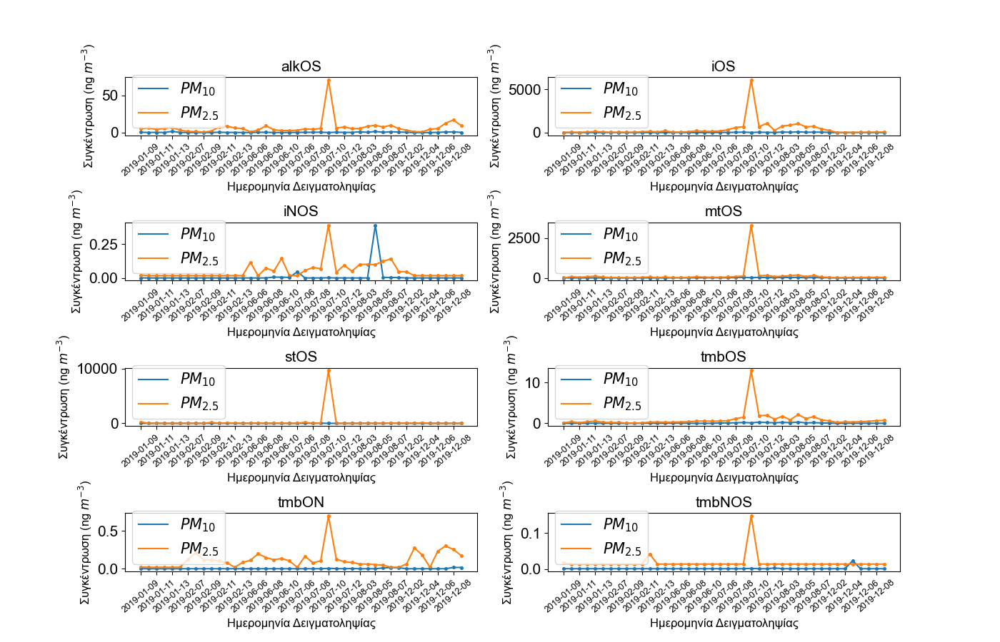

In [87]:
timeseries_latice(coarse,fine)
plt.savefig(join(base_fpath, "groups_timeseries" + ".png"))

Συγκρίνοντας για κάθε κατηγορία τα δύο είδοι σωματιδίων μεταξύ τους, καταρχάς παρατηρούμε το προηγούμενο γεγονός κορύφωσης το οποίο αφορά όμως αποκλειστικά τα $PM_{2.5}$ για κάθε κατηγορία. 
Κάνουμε τις εξής παρατηρήσεις:
* Στη περίπτωση των iNOS παρατηρείται επιπλέον γεγονός κορύφωσης το οποίο όμως αφορά αποκλειστικά την συγκεκριμένη κατηγορία και μόνο τα $PM_{10}$.
  Οι αντίστοιχες συγκεντρώσεις των $PM_{2.5}$ δεν επιρρεάστηκαν καθόλου από την εν λόγο μεταβολή.
* Τα tmbOS υπερταιρούν συνολικά των tmbON, ωστόσο τα tmbON εμφανίζουν μια περίππου σταθερή διακύμανση σχεδόν όλο το χρόνο, ενώ τα tmbOS εντόπίζονται αποκλειστικά το καλοκαίρι.

## Μοντελοποίηση

In [88]:
def linear_regress_all(df:pd.DataFrame)->pd.DataFrame:
    models = list(combinations(df.columns,2))
    results = pd.DataFrame(columns = ['var1','var2','model','r2'])
    for predicted, feature in models:
        x = fit_linear_model(df,predicted,feature)
        results.index = results.index + 1  # shifting index
        results = results.sort_index()  # sorting by index
        results.loc[-1] = [predicted,feature,x['model'],x['score']]
    return results

In [89]:
def get_pearson_all(df:pd.DataFrame,exc_cols:list[str] = [],skip_cols:list[str]=[])->pd.DataFrame:
    cols = [e for e in df.columns if e not in exc_cols+skip_cols]
    combs = tuple(
        combinations(cols, 2))
    totaled = pd.DataFrame()
    for idx, (e1, e2) in enumerate(combs):
        e = pd.DataFrame(data = {"Var 1":e1,"Var 2": str(e2), "$r^2_{pearson}$":df[e1].corr(df[e2]) }, columns = ["Var 1","Var 2","$r^2_{pearson}$"], index = [idx])
        totaled = pd.concat([totaled, e])
    return totaled

In [90]:
all_pcombs = get_pearson_all(df6,exc_cols = ["V_amb","PM","Δm","C_pm"], skip_cols = ["Date","Sample"])

In [91]:
pm_coarse = df7.iloc[:46,3:]
pm_fine = df7.iloc[46:,3:]
results_pm_10 = linear_regress_all(pm_coarse)
results_pm_2_5 = linear_regress_all(pm_fine)

In [92]:
filtered_results_coarse = results_pm_10[results_pm_10['r2']>0.7]
filtered_results_coarse = filtered_results_coarse[filtered_results_coarse['r2']<1]
filtered_results_fine = results_pm_2_5[results_pm_2_5['r2']>0.7]
filtered_results_fine = filtered_results_fine[filtered_results_fine['r2']<1]

In [93]:
def get_correlations_category_only(df:pd.DataFrame)->pd.DataFrame:
    ndf = df.copy(deep=True)
    ndf.drop(ndf.tail(1).index,inplace=True) # drop last row  
    s1=[]
    s2=[]
    for idx,row in  ndf.iterrows():
        s1.append(ions[ions['Exact mass'] == str(row['var1'])]['Group'].tolist()[0])
        s2.append(ions[ions['Exact mass'] == str(row['var2'])]['Group'].tolist()[0])
    ndf['category_1'] = s1
    ndf['category_2'] = s2
    ndf.drop_duplicates(subset=['category_1','category_2'],inplace=True)
    ndf.drop(columns=['model'],inplace=True)
    return ndf

### Συσχετίσεις μεταξύ δύο ιόντων από διαφορετικές ομάδες $PM_{10}$

In [94]:
# get_correlations_category_only(filtered_results_coarse).to_excel("coarse_category_linear_correlations.xlsx")
get_correlations_category_only(filtered_results_coarse)

,var1,var2,r2,category_1,category_2
23,312.0395,328.0708,0.703818,mtNOS,mtNOS
578,297.0648,281.0325,0.724018,mtOS,tmbOS
628,295.0490,297.0648,0.880721,mtOS,mtOS
1613,215.0231,281.0325,0.888061,iOS,tmbOS
1629,215.0231,297.0648,0.701390,iOS,mtOS
1707,213.0074,229.0024,0.713929,iOS,iOS
2295,311.0442,281.0325,0.774669,alkOS,tmbOS
2311,311.0442,297.0648,0.732677,alkOS,mtOS
2335,311.0442,213.0074,0.717979,alkOS,iOS
2986,168.9812,198.9918,0.895202,Mixed,iOS


### Συσχετίσεις μεταξύ δύο ιόντων από διαφορετικές ομάδες $PM_{2.5}$

In [95]:
filtered_results_fine
# get_correlations_category_only(filtered_results_fine).to_excel("fine_category_linear_correlations.xlsx")
get_correlations_category_only(filtered_results_fine)

,var1,var2,r2,category_1,category_2
26,312.0395,312.0759,0.820809,mtNOS,mtNOS
164,281.0325,260.0082,0.823757,tmbOS,iNOS
191,265.0391,342.0500,0.766742,tmbOS,mtNOS
248,225.0062,281.0325,0.895000,tmbOS,tmbOS
261,211.0364,296.0446,0.868045,tmbON,mtNOS
362,323.1531,260.0082,0.907545,stOS,iNOS
368,323.1531,281.0325,0.812300,stOS,tmbOS
401,321.1384,349.1326,0.772277,stOS,stOS
572,297.0648,260.0082,0.701047,mtOS,iNOS
578,297.0648,281.0325,0.803238,mtOS,tmbOS


## Χώρος Συσχετίσεων

### $PM_{10}$

In [96]:
def create_corr_graph(df:pd.DataFrame,ion_idx:pd.DataFrame,cutoff:float = 0.4)->nx.Graph:
    group_cmap = { key:get_random_hex_color(1)[0]  for key in ion_idx["Group"].unique()
    }
    G = nx.Graph()
    for _,row in df.iterrows():
        nodes = [row["Var 1"], row["Var 2"]]
        G.add_node(nodes[0], group = seek_ion_group(ion_idx, nodes[0]), color = group_cmap[seek_ion_group(ion_idx,nodes[0])])
        G.add_node(nodes[1], group = seek_ion_group(ion_idx, nodes[1]), color = group_cmap[seek_ion_group(ion_idx,nodes[1])])
        if row["$r^2_{pearson}$"] >= cutoff:
            G.add_edge(nodes[0], nodes[1] , r2 = row["$r^2_{pearson}$"] ,color="gray", alpha = abs(row["$r^2_{pearson}$"]))
    return G

In [97]:
def deg_centrality(g:nx.Graph,take:int=3)->list[tuple[str,float]]:
    degree_centrality = nx.centrality.degree_centrality(G_coarse)  # save results in a variable to use again 
    return list(sorted(degree_centrality.items(), key=lambda item: item[1], reverse=True))[:take]

In [98]:
def plot_ecdf(ecdf:ECDF, title:str="",xlabel:str="",ylabel:str=""):
    fig,ax = plt.subplots(figsize=fsize)
    ax.scatter(ecdf.x,ecdf.y)
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    return fig,ax

In [99]:
def deg_bet_centrality(g:nx.Graph,take:int=3)->list[tuple[str,float]]:
    degree_b_centrality = nx.centrality.betweenness_centrality(G_coarse) 
    return list(sorted(degree_b_centrality.items(), key=lambda item: item[1], reverse=True))[:take]

In [100]:
def eigen_centrality(g:nx.Graph,take:int=3)->list[tuple[str,float]]:
    eig_centrality = nx.centrality.eigenvector_centrality(G_coarse) 
    return list(sorted(eig_centrality.items(), key=lambda item: item[1], reverse=True))[:take]

In [101]:
def get_all_bridges(g:nx.Graph)->list:
    return list(nx.bridges(g))

In [102]:
def clustering_coef(g:nx.Graph,xlabel:str='Clustering Coefficient',ylabel:str='Counts',title:str='Clustering Coefficient Histogram ')->float:
    fig,ax = plt.subplots(figsize=fsize)
    X = nx.clustering(g).values()
    ax.hist(X,width=0.01,bins=len(X)+1)
    ax.set_title(title, loc='center') 
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    return fig,ax

In [103]:
def clustering_coef(g:nx.Graph,xlabel:str='Clustering Coefficient',ylabel:str='Counts',title:str='Clustering Coefficient Histogram ')->float:
    fig,ax = plt.subplots(figsize=fsize)
    X = nx.clustering(g).values()
    ax.hist(X,width=0.01,bins=len(X)+1)
    ax.set_title(title, loc='center') 
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    return fig,ax

In [104]:
def graph_to_classes(G:nx.Graph)->dict[str]:
    return {
    "K_{}".format(i): item for i,item in enumerate([c for c in sorted(nx.connected_components(G_coarse), key=len, reverse=True)],1 )
}

In [105]:
def show_community_colors(G:nx.Graph,title:str=""):
    pos = nx.spring_layout(G, iterations=15, seed=1721)
    colors = {node:'' for node in G.nodes()}  # initialize colors list
    i = 0
    for com in nx.community.label_propagation_communities(G):
        color = get_random_hex_color(1)  # creates random RGB color
        i+=1
        for node in list(com):  # fill colors list with the particular color for the community nodes
            colors[node] = tuple(["K_{}".format(i+1),color[0]])
    c = []
    for node in G.nodes():
        c.append(colors[node][1])
    fig,ax = plt.subplots(figsize=fsize)
    nx.draw_networkx(G, pos=pos, node_size=20, with_labels=False, width=0.15, node_color=c)
    ax.set_title(title,wrap=True)
    ax.axis('off')
    return fig,ax,colors

In [106]:
def create_graph(df:pd.DataFrame,cutoff:float=0.5)->None:
    filtered_data = df[df['r2']>cutoff]
    G = nx.Graph()
    for _,row in filtered_data.iterrows():
        nodes = [row['var1'],row['var2']]
        G.add_nodes_from(nodes)
        G.add_edges_from([(*nodes,{'score':row['r2']})])
    
    return G

In [107]:
def show_bridges(G:nx.Graph,title:str="")->None:
    pos = nx.spring_layout(G)
    fig,ax = plt.subplots(figsize = fsize)
    bridges = list(nx.bridges(G))
    local_bridges = list(nx.local_bridges(G, with_span=False))
    nx.draw_networkx(G, pos=pos, node_size=10, with_labels=False, width=0.15)
    nx.draw_networkx_edges(G, pos, edgelist = bridges, width=0.5, edge_color=["magenta" for _ in bridges])  # green color for local bridges 
    nx.draw_networkx_edges(G, pos, edgelist = local_bridges, width=0.5, edge_color = ["purple" for _ in local_bridges])  # red color for bridges
    plt.axis('off')
    ax.set_title(title)

In [108]:
sorted_centralities = lambda e: {k: v for k, v in sorted(nx.degree_centrality(e).items(), key=lambda item: item[1])}
sorted_betweenness_centrality = lambda e: {k: v for k, v in sorted(nx.betweenness_centrality(e,seed=5).items(), key=lambda item: item[1])}
sorted_load_centrality = lambda e: {k: v for k, v in sorted(nx.load_centrality(e).items(), key=lambda item: item[1])}
sorted_eigenvalue_centrality =  lambda e: {k: v for k, v in sorted(nx.eigenvector_centrality(e).items(), key=lambda item: item[1])}
to_ecdf = lambda e: sm.distributions.empirical_distribution.ECDF(e)

In [109]:
g_coarse = create_graph(results_pm_10,0.5)
G_coarse = create_corr_graph(get_pearson_all(coarse,exc_cols = ["V_amb","PM","Δm","C_pm"], skip_cols = ["Date","Sample"]), ions)
G_fine = create_corr_graph(get_pearson_all(fine,exc_cols = ["V_amb","PM","Δm","C_pm"], skip_cols = ["Date","Sample"]), ions)

In [110]:
plt.close() 
def display_graph(graph,title, with_labels = False):
    # pos = nx.spring_layout(graph,k=(1/sqrt(len(graph.nodes())+1)/100), seed=10,center=[1,1],scale=0.1,weight='1')  # positions for all nodes
    pos = nx.spring_layout(graph,scale=80)
    groups = set(nx.get_node_attributes(graph,'group').values())
    mapping = dict(zip(sorted(groups),count()))
    nodes = graph.nodes()
    colors = [mapping[graph.nodes[n]['group']] for n in nodes]
    fig,ax = plt.subplots(figsize=fsize)
    ec = nx.draw_networkx_edges(graph, pos, alpha=0.2)
    nc = nx.draw_networkx_nodes(graph, pos, nodelist=nodes, node_color=colors, 
                                 node_size=15, cmap=plt.cm.twilight)
    if with_labels:
        nl = nx.draw_networkx_labels(graph,pos)
    ax.set_title(title)
    ax.axis('off')

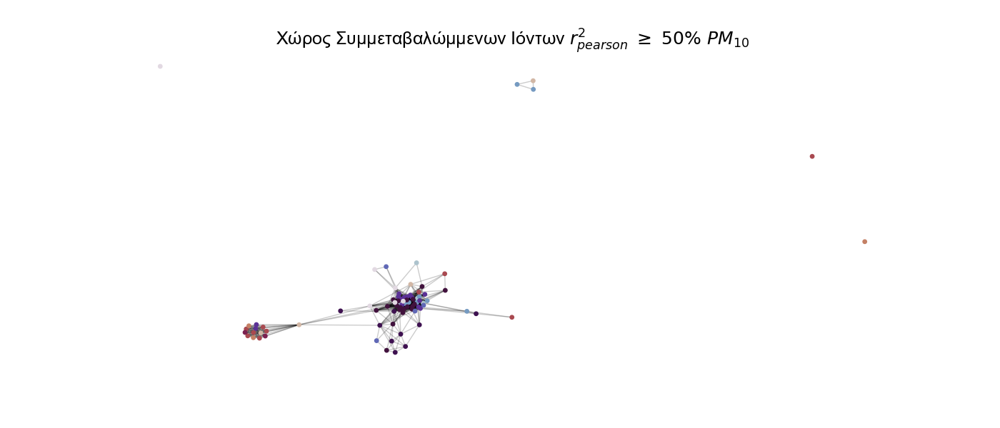

In [111]:
display_graph(G_coarse,r'Χώρος Συμμεταβαλώμμενων Ιόντων $r^2_{pearson}\ \geq\ 50\%\ PM_{10}$')
plt.savefig(join(base_fpath, "corr_space_coarse" + ".png"),dpi = 1000)

/media/alexander-fyrogenis/Elements/Οργανοθειικά Ατμόσφαιρα/Data Analysis/venv/lib/python3.10/site-packages/nxviz/api.py:275: UserWarning: As of nxviz 0.7, the object-oriented API is being deprecated in favour of a functional API. Please consider switching your plotting code! The object-oriented API wrappers remains in place to help you transition over. A few changes between the old and new API exist; please consult the nxviz documentation for more information. When the 1.0 release of nxviz happens, the object-oriented API will be dropped entirely.
  warnings.warn(


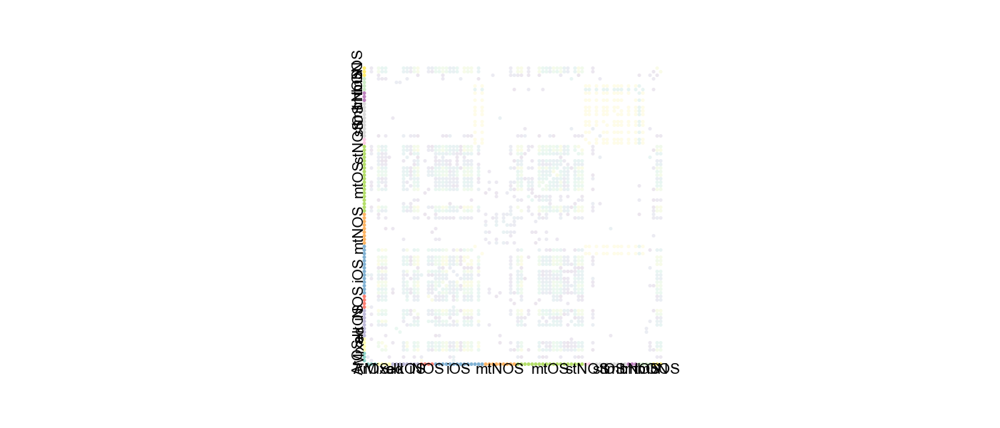

In [112]:
nxviz.api.MatrixPlot(G_coarse,node_order = "group",node_grouping = "group",node_color = "group",edge_color = "r2")
nxviz.annotate.matrix_group(G_coarse,group_by = "group")

/media/alexander-fyrogenis/Elements/Οργανοθειικά Ατμόσφαιρα/Data Analysis/venv/lib/python3.10/site-packages/nxviz/api.py:275: UserWarning: As of nxviz 0.7, the object-oriented API is being deprecated in favour of a functional API. Please consider switching your plotting code! The object-oriented API wrappers remains in place to help you transition over. A few changes between the old and new API exist; please consult the nxviz documentation for more information. When the 1.0 release of nxviz happens, the object-oriented API will be dropped entirely.
  warnings.warn(


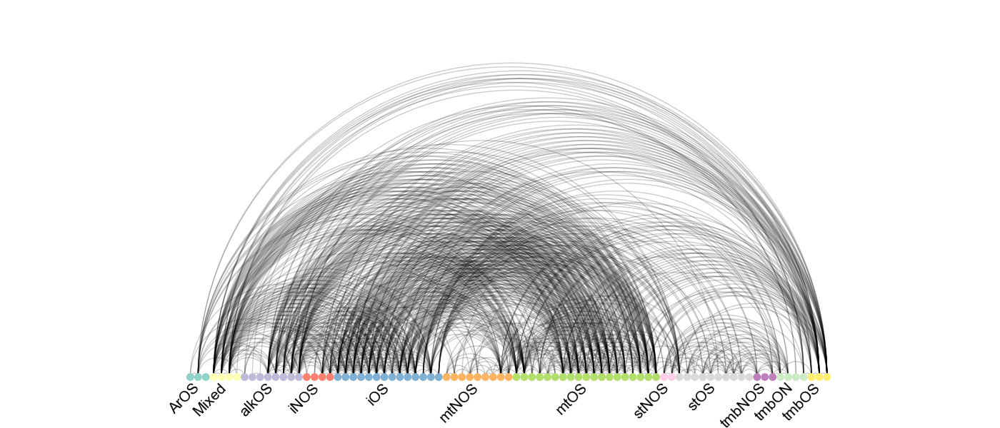

In [113]:
nxviz.api.ArcPlot(G_coarse,node_order = "group",node_grouping = "group",node_color = "group")
nxviz.annotate.arc_group(G_coarse,group_by = "group")

/media/alexander-fyrogenis/Elements/Οργανοθειικά Ατμόσφαιρα/Data Analysis/venv/lib/python3.10/site-packages/nxviz/api.py:275: UserWarning: As of nxviz 0.7, the object-oriented API is being deprecated in favour of a functional API. Please consider switching your plotting code! The object-oriented API wrappers remains in place to help you transition over. A few changes between the old and new API exist; please consult the nxviz documentation for more information. When the 1.0 release of nxviz happens, the object-oriented API will be dropped entirely.
  warnings.warn(


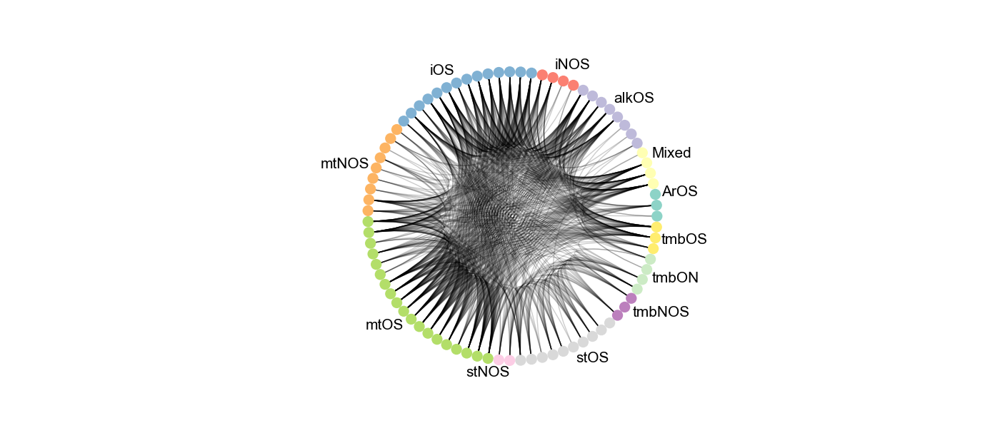

In [114]:
nxviz.api.CircosPlot(G_coarse,node_order = "group",node_grouping = "group",node_color = "group")
nxviz.annotate.circos_group(G_coarse,group_by = "group")

Χαρτογραφώντας των χώρο γραμμικών συσχετίσεων στα $PM_{10}$ τέσσερεις περιοχές. Υπάρχουν δύο clusters με πολλά ιόντα με περίπλοκες αλληλοεξαρτήσεις δύο ζεύγοι ιόντων που συσχετίζονται μεταξύ τους αλλά όχι με τα υπόλοιπα. Καθένα cluster περιλαμβάνει ιόντα διαφορετική προέλευσης και κατηγορίας κάτι που θα μπορούσε να δηλώνειοτι η ταξινόμηση τους βάση προέλευσης δεν παρέχει τις περισσότερες δυνατές πληροφορίες.

#### Βασικά Μετρικά

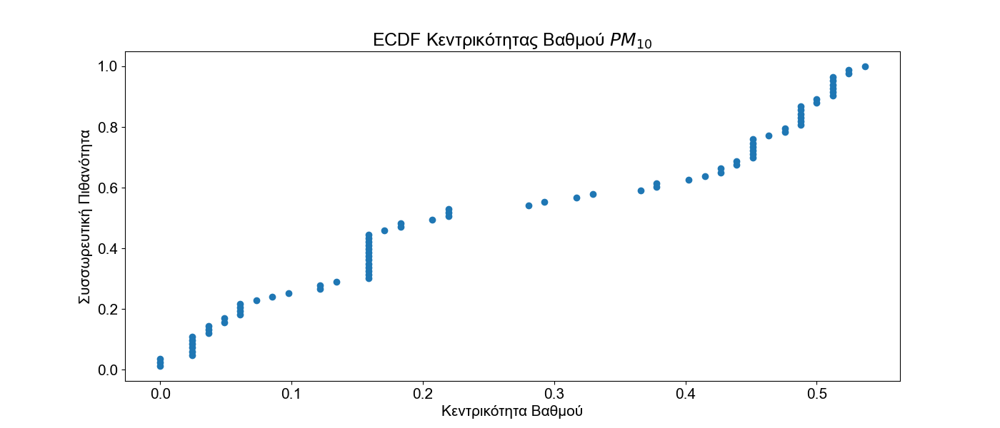

In [115]:
_ = plot_ecdf(ECDF([e for _,e in sorted_centralities(G_coarse).items()]), title="ECDF Κεντρικότητας Βαθμού $PM_{10}$", xlabel = "Κεντρικότητα Βαθμού", ylabel = "Συσσωρευτική Πιθανότητα")

Ο βασικότερος ίσως δείκτης "σημαντικότητας" για κάθε κορυφή είναι ο βαθμός κεντρικότητας της. Είναι ο αριθμός των κόμβων τις δια τον αριθμό των μέγιστο αριθμό κόμβων που θα μπορούσε να έχει (n-1). Επομένως εκφράζει
απλά το % ποσοστό άλλων κορυφών (ιόντων στη περίπτωση μας) που σχετίζονται με το συγκεκριμένο ιόν. Συνεπώς ένα ιόν με μεγάλο βαθμό κεντρικότητας έχει μη αμεληταία συμμεταβλητότητα με πολλά άλλα ιόντα.

In [116]:
deg_centrality(G_coarse,15)

[('267.0547', 0.5365853658536586),
 ('152.9863', 0.524390243902439),
 ('297.0284', 0.524390243902439),
 ('168.9812', 0.5121951219512195),
 ('311.0442', 0.5121951219512195),
 ('167.0020', 0.5121951219512195),
 ('249.0438', 0.5121951219512195),
 ('295.0490', 0.5121951219512195),
 ('297.0648', 0.5121951219512195),
 ('180.9812', 0.5),
 ('265.0391', 0.5),
 ('269.0700', 0.4878048780487805),
 ('179.0020', 0.4878048780487805),
 ('210.9919', 0.4878048780487805),
 ('215.0231', 0.4878048780487805)]

Φαίνεται οτι τα ιόντα 267.0547, 152.9863 και 297.0284 έχουν με αμεληταία συμμεταβλητότητα με τον μεγαλύτερο αριθμό άλλων ιόντων. Και στις τρείς περιπτώσεις είναι περίππου τα μισά των συνολικών.

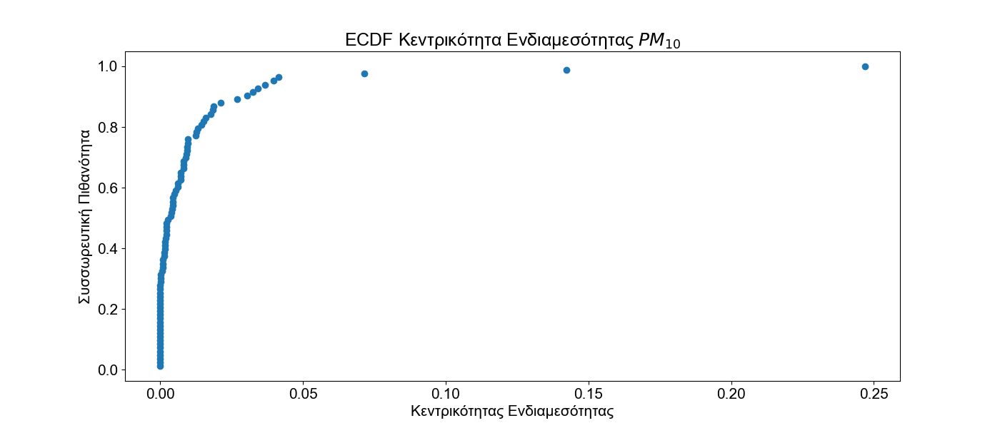

In [117]:
_ = plot_ecdf(ECDF([e for _,e in sorted_betweenness_centrality(G_coarse).items()]), title="ECDF Κεντρικότητα Ενδιαμεσότητας $PM_{10" +
              "}$", xlabel = "Κεντρικότητας Ενδιαμεσότητας", ylabel = "Συσσωρευτική Πιθανότητα")
plt.savefig(join(base_fpath, "deg_centrality_ecdf_coarse" + ".png"))

Ο δεύτερος πιό σημαντικός δείκτης ενδιαφέροντος για κάθε κορυφή είναι η κεντρικότητα ενδιαμεσότητας (betweenness centrality). Εκφράζει το ποσοστό των συνολικών ελαχίστων διαδρομών μεταξύ κάθε άλλως δύο κορυφών που περνάει από την εν λόγο κορυφή. Στη προκείμενη περίπτωση υψηλή κεντρικότητα διαμεσότητας σημαίνει οτι το συγκεκριμένο ιόν βρίσκεται ανάμεσα σε περισσότερες αλυσίδες συσχετίσεων συμμεταβλητότηας μεταξύ δύο ιόνων. Αυτό υπονοεί οτι είναι πιθανό ενδιάμεσο-κλειδί ή υπόστρωμα για τα δύο επιμέρους. Γνωρίζουμε οτι κανένα από τα εν λόγο ιόντα δεν είναι πραγματικό υπόστρωμα για τα υπόλοιπα, επομένως θα πρέπει να είναι ενδιάμεσο.

In [118]:
deg_bet_centrality(G_coarse,5)

[('211.0364', 0.24683089335302524),
 ('249.0806', 0.1423582366374286),
 ('342.0500', 0.07152735515685249),
 ('167.0020', 0.04153643259050101),
 ('225.0062', 0.0396349612645374)]

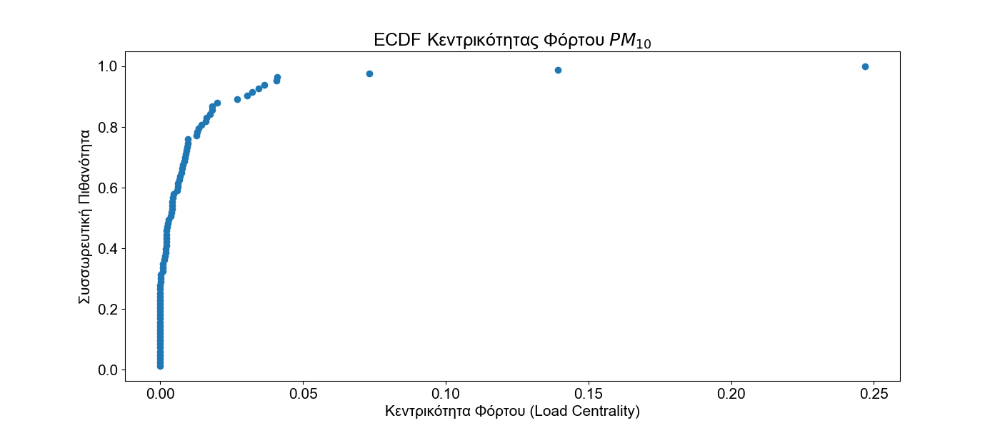

In [119]:
_ = plot_ecdf(ECDF([e for _,e in sorted_load_centrality(G_coarse).items()]), title="ECDF Κεντρικότητας Φόρτου $PM_{10}$",
              xlabel = "Κεντρικότητα Φόρτου (Load Centrality)", ylabel = "Συσσωρευτική Πιθανότητα")

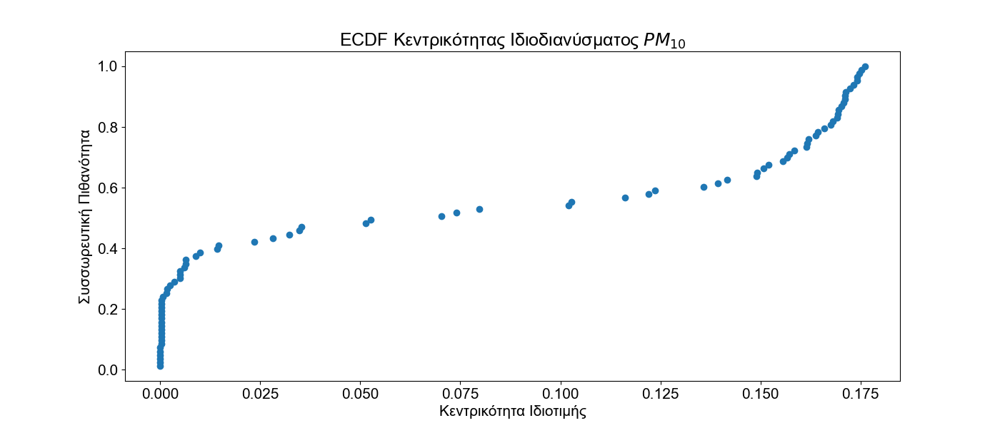

In [120]:
_ = plot_ecdf(ECDF([e for _,e in sorted_eigenvalue_centrality(G_coarse).items()]), title="ECDF Κεντρικότητας Ιδιοδιανύσματος $PM_{10}$",
              xlabel = "Κεντρικότητα Ιδιοτιμής", ylabel = "Συσσωρευτική Πιθανότητα")

In [121]:
eigen_centrality(G_coarse,5)

[('297.0284', 0.176065108135482),
 ('267.0547', 0.17516766425794242),
 ('295.0490', 0.17462801091465135),
 ('297.0648', 0.17418744450376336),
 ('311.0442', 0.174143935595498)]

(<Figure size 1400x600 with 1 Axes>,
 <AxesSubplot:title={'center':'Clustering Coefficient Histogram '}, xlabel='Clustering Coefficient', ylabel='Counts'>)

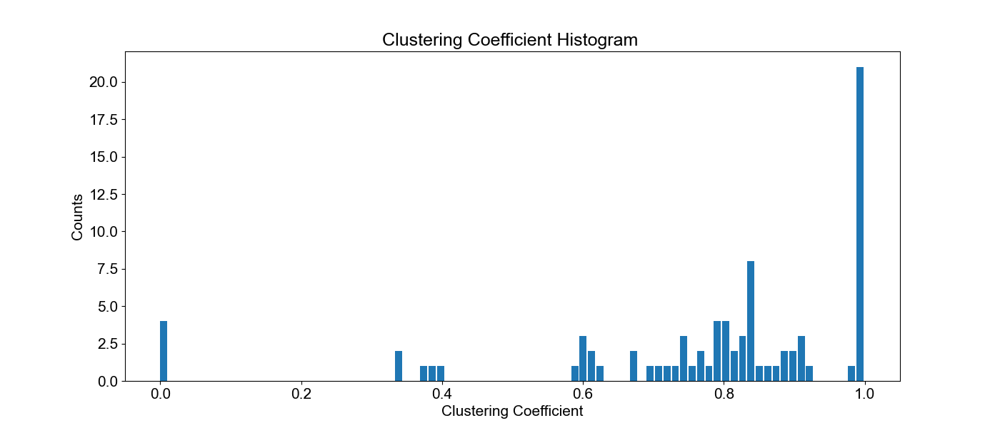

In [122]:
clustering_coef(G_coarse)

In [123]:
nx.has_bridges(G_coarse)

False

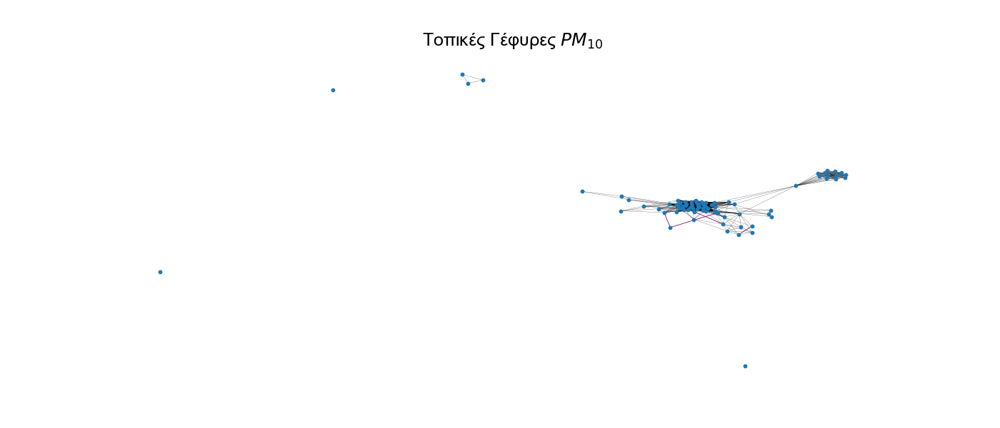

In [124]:
show_bridges(G_coarse,title = "Τοπικές Γέφυρες $PM_{10}$")
plt.savefig(join(base_fpath, "corr_space_coarse_bridges" + ".png"))

Βάση των εμπειρικών μας παρατηρήσεων δεν φαίνεται οτι η ταξινόμηση των OS βάση *a priori* απόδοσης δομικής κατηγορίας, έχει ιδιαίτερο πρακτικό ενδιαφέρον. Η χημική συμπεριφορά δεν εξαρτάται από την ευρύτερη δομική τάξη. Αντίθετα βάση της συμμεταβλητότητας μπορούμε να αποδωσουμε πρακτικές κατηγορίες στα ιόντα.

In [125]:
coarse_taxa_components = graph_to_classes(G_coarse)

In [126]:
coarse_taxa_label_propagation = {"K_{}".format(i):v for i,v in enumerate(nx.algorithms.community.asyn_lpa_communities(G_coarse, weight=None, seed=5),1)}

In [127]:
coarse_taxa_girvan_newman = {"K_{}".format(i):v for i,v in enumerate(nx.algorithms.community.girvan_newman(G_coarse),1)}

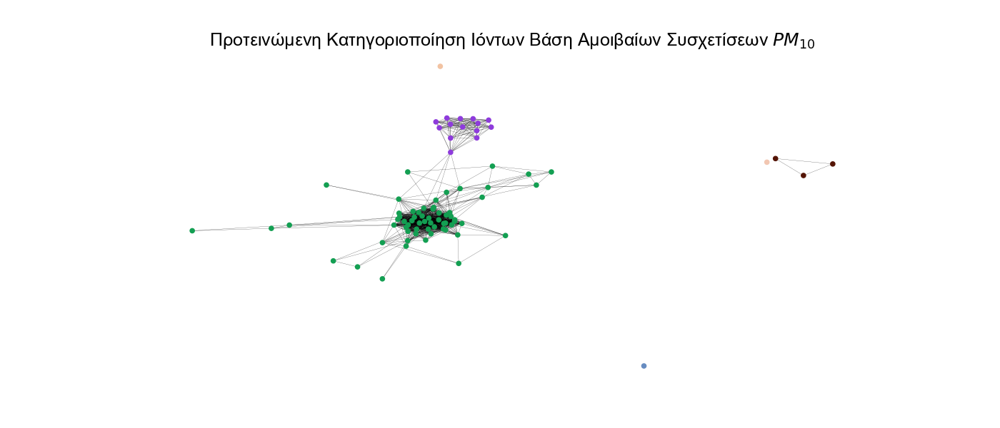

In [128]:
_,__,groups = show_community_colors(G_coarse,title = "Προτεινώμενη Κατηγοριοποίηση Ιόντων Βάση Αμοιβαίων Συσχετίσεων $PM_{10}$")
plt.savefig(join(base_fpath, "corr_space_groups" + ".png"))

### $PM_{2.5}$

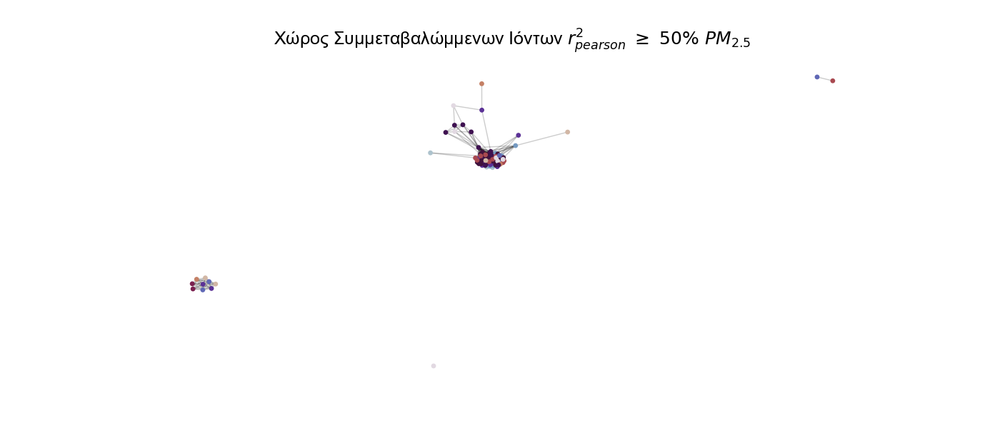

In [129]:
display_graph(G_fine,r'Χώρος Συμμεταβαλώμμενων Ιόντων $r^2_{pearson}\ \geq\ 50\%\ PM_{2.5}$')
plt.savefig(join(base_fpath, "corr_space_fine" + ".png"))

/media/alexander-fyrogenis/Elements/Οργανοθειικά Ατμόσφαιρα/Data Analysis/venv/lib/python3.10/site-packages/nxviz/api.py:275: UserWarning: As of nxviz 0.7, the object-oriented API is being deprecated in favour of a functional API. Please consider switching your plotting code! The object-oriented API wrappers remains in place to help you transition over. A few changes between the old and new API exist; please consult the nxviz documentation for more information. When the 1.0 release of nxviz happens, the object-oriented API will be dropped entirely.
  warnings.warn(


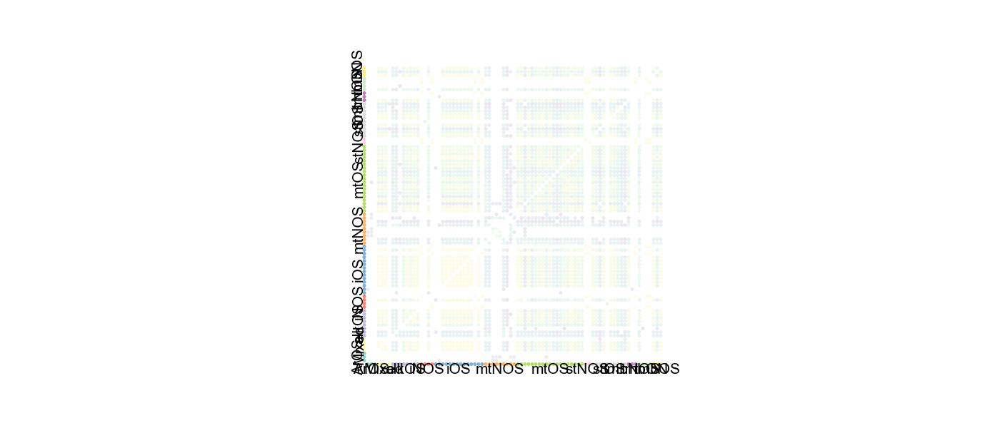

In [130]:
nxviz.api.MatrixPlot(G_fine,node_order = "group",node_grouping = "group",node_color = "group",edge_color = "r2")
nxviz.annotate.matrix_group(G_fine,group_by = "group")

/media/alexander-fyrogenis/Elements/Οργανοθειικά Ατμόσφαιρα/Data Analysis/venv/lib/python3.10/site-packages/nxviz/api.py:275: UserWarning: As of nxviz 0.7, the object-oriented API is being deprecated in favour of a functional API. Please consider switching your plotting code! The object-oriented API wrappers remains in place to help you transition over. A few changes between the old and new API exist; please consult the nxviz documentation for more information. When the 1.0 release of nxviz happens, the object-oriented API will be dropped entirely.
  warnings.warn(


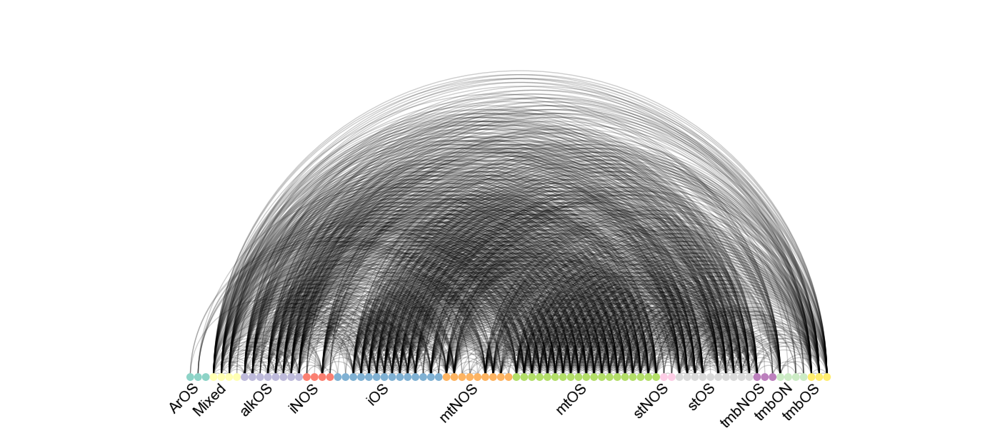

In [131]:
nxviz.api.ArcPlot(G_fine,node_order = "group",node_grouping = "group",node_color = "group")
nxviz.annotate.arc_group(G_fine,group_by = "group")

/media/alexander-fyrogenis/Elements/Οργανοθειικά Ατμόσφαιρα/Data Analysis/venv/lib/python3.10/site-packages/nxviz/api.py:275: UserWarning: As of nxviz 0.7, the object-oriented API is being deprecated in favour of a functional API. Please consider switching your plotting code! The object-oriented API wrappers remains in place to help you transition over. A few changes between the old and new API exist; please consult the nxviz documentation for more information. When the 1.0 release of nxviz happens, the object-oriented API will be dropped entirely.
  warnings.warn(


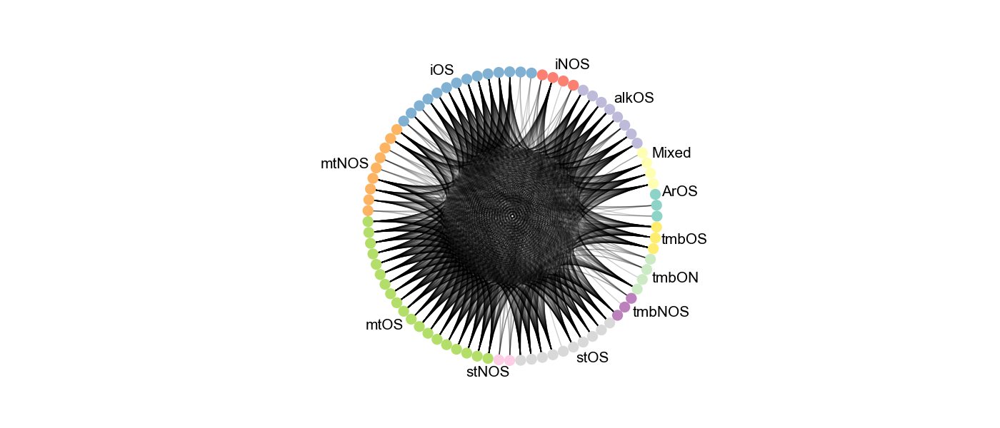

In [132]:
nxviz.api.CircosPlot(G_fine,node_order = "group",node_grouping = "group",node_color = "group")
nxviz.annotate.circos_group(G_fine,group_by = "group")

Χαρτογραφώντας των χώρο γραμμικών συσχετίσεων στα $PM_{10}$ τέσσερεις περιοχές. Υπάρχουν δύο clusters με πολλά ιόντα με περίπλοκες αλληλοεξαρτήσεις δύο ζεύγοι ιόντων που συσχετίζονται μεταξύ τους αλλά όχι με τα υπόλοιπα. Καθένα cluster περιλαμβάνει ιόντα διαφορετική προέλευσης και κατηγορίας κάτι που θα μπορούσε να δηλώνειοτι η ταξινόμηση τους βάση προέλευσης δεν παρέχει τις περισσότερες δυνατές πληροφορίες.

#### Βασικά Μετρικά

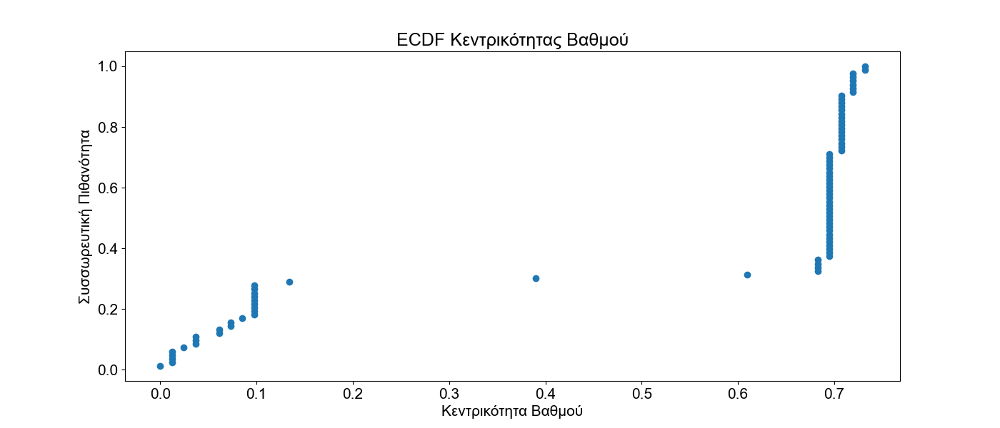

In [133]:
_ = plot_ecdf(ECDF([e for _,e in sorted_centralities(G_fine).items()]), title="ECDF Κεντρικότητας Βαθμού", xlabel = "Κεντρικότητα Βαθμού", ylabel = "Συσσωρευτική Πιθανότητα")
plt.savefig(join(base_fpath, "corr_space_deg_centrality_ecdf_fine" + ".png"))

Ο βασικότερος ίσως δείκτης "σημαντικότητας" για κάθε κορυφή είναι ο βαθμός κεντρικότητας της. Είναι ο αριθμός των κόμβων τις δια τον αριθμό των μέγιστο αριθμό κόμβων που θα μπορούσε να έχει (n-1). Επομένως εκφράζει
απλά το % ποσοστό άλλων κορυφών (ιόντων στη περίπτωση μας) που σχετίζονται με το συγκεκριμένο ιόν. Συνεπώς ένα ιόν με μεγάλο βαθμό κεντρικότητας έχει μη αμεληταία συμμεταβλητότητα με πολλά άλλα ιόντα.

In [134]:
deg_centrality(G_fine,15)

[('267.0547', 0.5365853658536586),
 ('152.9863', 0.524390243902439),
 ('297.0284', 0.524390243902439),
 ('168.9812', 0.5121951219512195),
 ('311.0442', 0.5121951219512195),
 ('167.0020', 0.5121951219512195),
 ('249.0438', 0.5121951219512195),
 ('295.0490', 0.5121951219512195),
 ('297.0648', 0.5121951219512195),
 ('180.9812', 0.5),
 ('265.0391', 0.5),
 ('269.0700', 0.4878048780487805),
 ('179.0020', 0.4878048780487805),
 ('210.9919', 0.4878048780487805),
 ('215.0231', 0.4878048780487805)]

Φαίνεται οτι τα ιόντα 267.0547, 152.9863 και 297.0284 έχουν με αμεληταία συμμεταβλητότητα με τον μεγαλύτερο αριθμό άλλων ιόντων. Και στις τρείς περιπτώσεις είναι περίππου τα μισά των συνολικών.

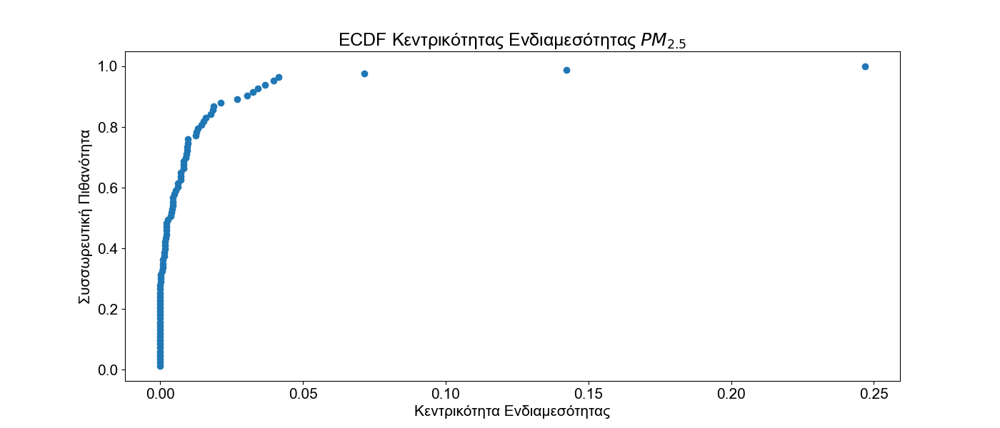

In [135]:
_ = plot_ecdf(ECDF([e for _,e in sorted_betweenness_centrality(G_coarse).items()]), title="ECDF Κεντρικότητας Ενδιαμεσότητας $PM_{2.5}$",
              xlabel = "Κεντρικότητα Ενδιαμεσότητας", ylabel = "Συσσωρευτική Πιθανότητα")
plt.savefig(join(base_fpath, "corr_space_betw_centrality_ecdf_fine" + ".png"))

Ο δεύτερος πιό σημαντικός δείκτης ενδιαφέροντος για κάθε κορυφή είναι η κεντρικότητα ενδιαμεσότητας (betweenness centrality). Εκφράζει το ποσοστό των συνολικών ελαχίστων διαδρομών μεταξύ κάθε άλλως δύο κορυφών που περνάει από την εν λόγο κορυφή. Στη προκείμενη περίπτωση υψηλή κεντρικότητα διαμεσότητας σημαίνει οτι το συγκεκριμένο ιόν βρίσκεται ανάμεσα σε περισσότερες αλυσίδες συσχετίσεων συμμεταβλητότηας μεταξύ δύο ιόνων. Αυτό υπονοεί οτι είναι πιθανό ενδιάμεσο-κλειδί ή υπόστρωμα για τα δύο επιμέρους. Γνωρίζουμε οτι κανένα από τα εν λόγο ιόντα δεν είναι πραγματικό υπόστρωμα για τα υπόλοιπα, επομένως θα πρέπει να είναι ενδιάμεσο.

In [136]:
deg_bet_centrality(G_fine,5)

[('211.0364', 0.24683089335302524),
 ('249.0806', 0.1423582366374286),
 ('342.0500', 0.07152735515685249),
 ('167.0020', 0.04153643259050101),
 ('225.0062', 0.0396349612645374)]

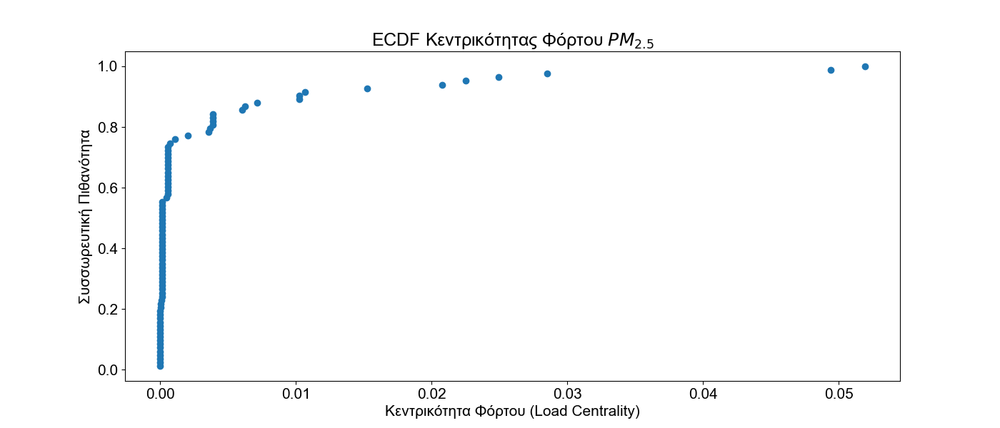

In [137]:
_ = plot_ecdf(ECDF([e for _,e in sorted_load_centrality(G_fine).items()]), title="ECDF Κεντρικότητας Φόρτου $PM_{2.5}$", xlabel = "Κεντρικότητα Φόρτου (Load Centrality)", ylabel = "Συσσωρευτική Πιθανότητα")

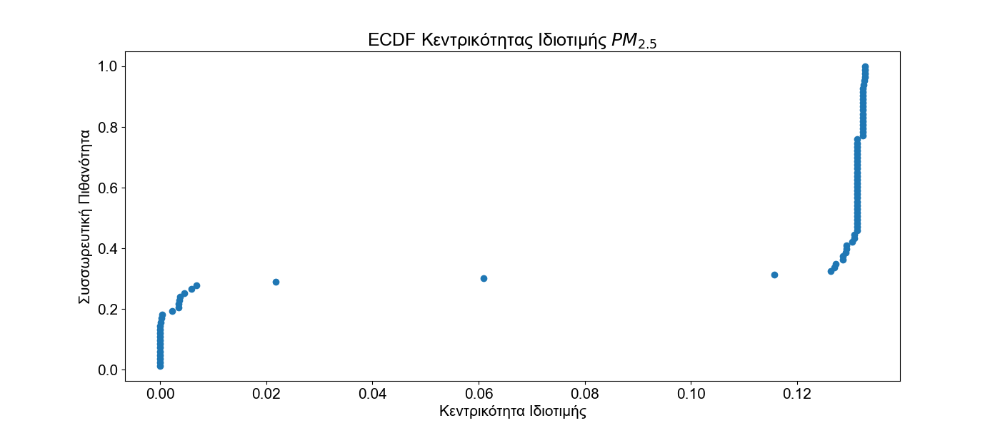

In [138]:
_ = plot_ecdf(ECDF([e for _,e in sorted_eigenvalue_centrality(G_fine).items()]), title="ECDF Κεντρικότητας Ιδιοτιμής $PM_{2.5}$", xlabel = "Κεντρικότητα Ιδιοτιμής", ylabel = "Συσσωρευτική Πιθανότητα")

In [139]:
eigen_centrality(G_fine,5)

[('297.0284', 0.176065108135482),
 ('267.0547', 0.17516766425794242),
 ('295.0490', 0.17462801091465135),
 ('297.0648', 0.17418744450376336),
 ('311.0442', 0.174143935595498)]

(<Figure size 1400x600 with 1 Axes>,
 <AxesSubplot:title={'center':'Clustering Coefficient Histogram '}, xlabel='Clustering Coefficient', ylabel='Counts'>)

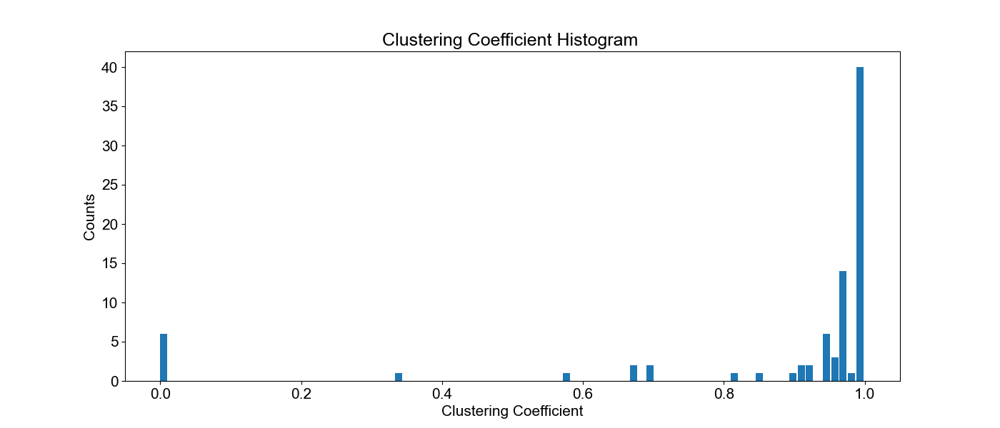

In [140]:
clustering_coef(G_fine)

In [141]:
nx.has_bridges(G_fine)

True

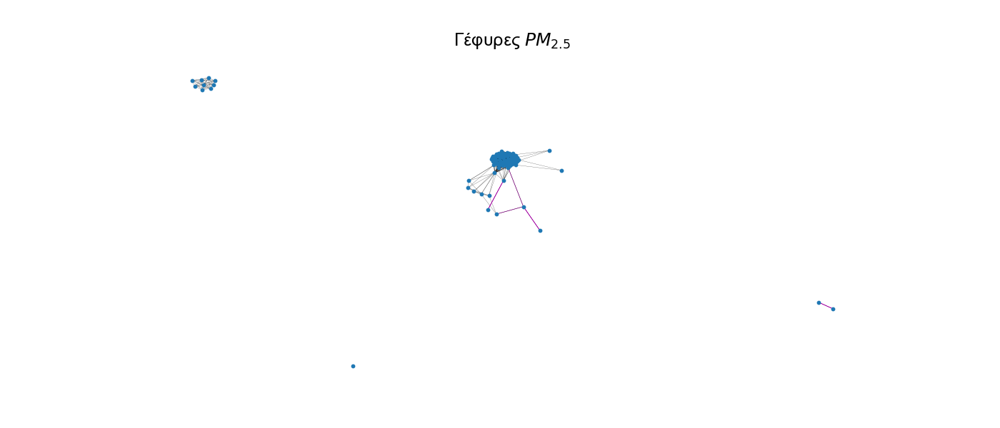

In [142]:
show_bridges(G_fine,title = "Γέφυρες $PM_{2.5}$")
plt.savefig(join(base_fpath, "corr_space_bridges_fine" + ".png"))

Βάση των εμπειρικών μας παρατηρήσεων δεν φαίνεται οτι η ταξινόμηση των OS βάση *a priori* απόδοσης δομικής κατηγορίας, έχει ιδιαίτερο πρακτικό ενδιαφέρον. Η χημική συμπεριφορά δεν εξαρτάται από την ευρύτερη δομική τάξη. Αντίθετα βάση της συμμεταβλητότητας μπορούμε να αποδωσουμε πρακτικές κατηγορίες στα ιόντα.

In [143]:
coarse_taxa_components = graph_to_classes(G_fine)

In [144]:
coarse_taxa_label_propagation = {"K_{}".format(i):v for i,v in enumerate(nx.algorithms.community.asyn_lpa_communities(G_fine, weight=None, seed=5),1)}

In [145]:
coarse_taxa_girvan_newman = {"K_{}".format(i):v for i,v in enumerate(nx.algorithms.community.girvan_newman(G_fine),1)}

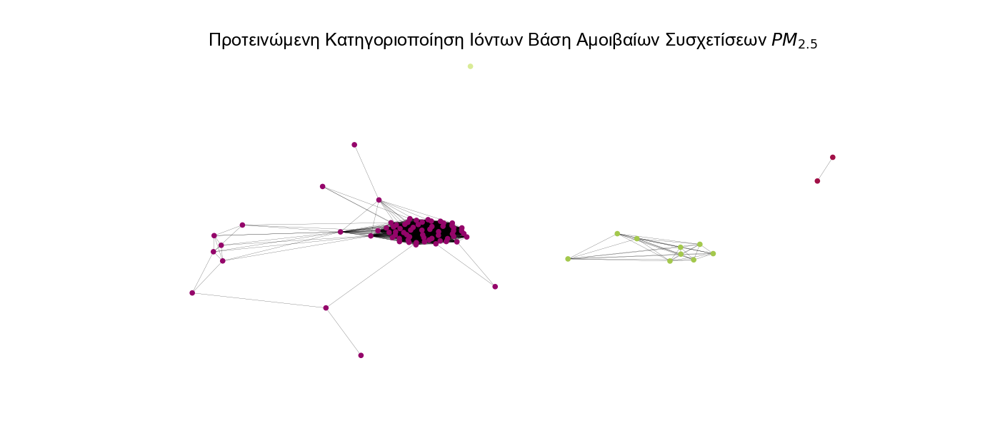

In [146]:
_,__,groups = show_community_colors(G_fine,title = "Προτεινώμενη Κατηγοριοποίηση Ιόντων Βάση Αμοιβαίων Συσχετίσεων $PM_{2.5}$")
plt.savefig(join(base_fpath, "corr_space_groups_fine" + ".png"))

Στα $PM_{2.5}$ η εικόνα είναι παρόμοια όμως εντόπίζονται περισσότερες ομάδες, ιδιαίτερα αυτές με λίγα αλληλοεξαρτώμενα ιόντα. Εντοπίζονται πέντε συμπλέγματα με λίγα ιόντα. Συγκεκριμένα δύο με δύο ιόντα, ένα με τρία, ένα με τέσσερα και ένα με πέντε. Η προηγούμενη ομάδα με φαινομενικά συμμετρικά αλληλοεξάρτηση (όλα σχετίζονται με όλα) των $PM_{10}$ δεν εμφανίζεται πλεόν και ιόντα που το απάρτιζαν δεν σχετίζονται πλέον με κανένα άλλο, κατά κανόνα. Αυτό μας οδηγεί στο συμπέρασμα οτι αρκετές από τις συσχετίσεις αυτές εξαρτόνται από τον τύπο σωματιδίου.

In [147]:
def get_catergory_combs(combs:list[tuple],ion_df:pd.DataFrame)->list:
    filtered_combs = list()
    for comb in combs: 
        exclude = ['Δm','C_pm','V_amb']
        if comb[0] not in exclude and comb[1] not in exclude:
            x = ions[ions['Exact mass'] == comb[0]]['Group'].values[0]
            y = ions[ions['Exact mass'] == comb[1]]['Group'].values[0]
            if x !=y:
                filtered_combs.append(comb)
    return filtered_combs

## Εκτίμηση Ποσοστού Βιογενούς/Ανθρωπογενούς Συνεισφοράς για Επιλεγμένα Οργανοθειικά Μικτής Προέλευσης

In [148]:
def is_gaussian(df:pd.DataFrame,ion:str)->float:
    no_outliers = df[(np.abs(scipy.stats.zscore(df[ion])) < 3)]
    stat,p = scipy.stats.shapiro(no_outliers[ion])
    return {
    'outliers_rejected': df.shape[0] - no_outliers.shape[0],
    'p_value':p,
    'W':stat,
    'is_gaussian':p>0.05,
    }

In [149]:
def multiple_regressor(df,pred,data,reg=False):
    if reg:
        scaler = StandardScaler()
        df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)
    predictors = df[data]
    target = df.loc[:,pred]
    x_train, x_test, y_train, y_test = train_test_split(predictors, target, test_size = 0.2,random_state=5)
    model = LinearRegression()
    model.fit(x_train,y_train)
    y_predicted =  model.predict(x_test)
    score=r_sq(y_test,y_predicted)
    return model,score


### Δείκτες

Εφόδον υπάρχει τόσο μεγάλο εύρος συσχετίσεων μεταξύ των ιόντων μας, μπορούμε να προχωρήσουμε σε εκτίμηση της προέλευσης κάθε ιόντος με την εξής μεθοδολογία. Επιλέγουμε ένα ιόν που θεωρείται
κατά κανόνα βιογενούς προέλευσης και ένα ιόν κατά κανόνα βιογενούς προέλευσης. Θα επιχειρήσουμε να μοντελοποιήσουμε τη συγκέντρωση κάθε ιόντων με πολλαπλή παλινδρόμηση δύο μεταβλητών - τις άνω
δύο συγκεντρώσεις. Με την προϋπόθεση οτι κάθενα από αυτά τα ιόντα είναι ικανοποιητικός δείκτης για την "ανθρώπινη  δραστηριότητα" και τη "βιογενή δραστηριότητα", αντίστοιχα, τότε το μοντέλο θα καταδεικνύει τη προέλευση του εκτιμώμενου ιόντος. Τότε μπορούμε να ερμηνεύσουμε τους συντελεστές ως εκφράζοντας την "ευαισθησία" της συγκέντρωσης του εκτιμώμενου ιόντως σε μεταβολές της δραστηριότητας. Ειδικά θα θέλαμε να ισχύει η προϋπόθεση οτι $\sum{\hat{\beta_i}}=1$ οπότε οι συντελεστές μπορούν ερμηνευθούν ως το επί % ποσοστό προέλευσης.

Βάσιζόμενοι στη βιβλιογραφία καταλήξαμε στο LAS ως δείκτη βιογεννούς δραστηριότητας και το Benzylsulfate ως δείκτη ανθρωπογενούς δραστηριότητας. Στη περίπτωση όπου ακριβώς ένας συντελεστής είναι στατιστικά σημαντικός σε στάθμη εμπιστοσύνης 95% τότε θεωρήθηκε οτι η προέλευση καθορίζεται από τον άλλο συντελεστή. Στις περιπτώσεις όπου ο συντελεστής προσδιορισμού είναι μικρότερος του 75% ή στη περίπτωση όπου και οι δύο συντελεστές είναι δεν στατιστικά σημαντικοί, τότε θεωρήθηκε οτι η προέλευση δεν μπορεί να καθοριστεί. Στη περίπτωση όπου και οι δύο συντελεστές είναι στατιστικά σημαντικοί τότε θεωρήκε οτι εάν ο ένας συντελεστής διαφέρει από τον άλλο κατά μία τάξη μεγέθους τότε αυτό καθορίζει την προέλευση.

Επιπλέον, στις περιπτώσεις όπου και οι δύο συντελεστές είναι στατιστικά σημαντικά θεωρήθηκε οτι η προέλευση είναι αυστηρά μικτή και ο χαρακτηρισμός αφορά το μεγαλύτερο μέρος της ποσότητας, ενώ στη περίπτωση που ακριβώς ένας συντελεστής είναι στατιστικά σημαντικός, τότε θεωρήθηκε οτι η προέλευση είναι αμιγώς καθοριζόμενη από τον στατιστικά σημαντικό συντελεστή (δηλαδή καθάρα ανθρωπογενές ή  βιογενές).

Έλεγθηκαν όλες οι προϋποθέσεις γραμμικού μοντέλου (Γκαιυσιανή κατανομή, έλλειψη αυτοσυσχέτισης, γραμμικότητα, έλληψη πολυσυγγραμμικότης κ.α.) και τα αναφερώμενα ιόντα πληρούν όλες τις προποθέσεις σε στάθμη εμπιστοσύνης 95%. Τέλος επειδή οι συγκεντρώσεις του LAS είναι γενικά μεγαλύτερες αυτών του BS, έγινε τυπική κλιμάκωση των δεδομένω, αφαιρώντας από κάθε ιόν τη μέση τιμή και διαιρόντας με την τυπική απόκλιση. Έτσι δημιουργήθηκε κατανομή μορφής $N (\mu=0,\sigma=1)$. Σε διαφορετική περίπτωση οι διαφορές των τιμών του κάθε συντελεστή θα μπορούσε να οφείλεται στη διαφορετική τάξη μεγέθους των ιόντων και επομένως θα ήταν δύσκολη η ερμηνεία.

Για να εκτιμηθεί η καταλληλότητα του LAS ο δείκτη βιογενών, εξαιτάστηκε η πιθανή συμμεταβλητότητα ή  γενικότερα η συσχέτιση του με άλλα επιβεβαιωμένα βιογενοί. Βρέθηκε οτι η συγκέντρωση του δεν μπορεί να συσχετιστεί με άλλο ιόν, ιδιαίτερα δεν σχετίζεται με άλλες ουσίες παρόμοιας δομής, όπως το GAS. Υπό αυτές τις συνθήκες είναι δύσκολο να εξηγηθεί κάποια πιθανή προβλεφτηκή ισχύ του LAS στις συγκεντρώσεις των υπολοίπων, εκτός ως εκπρόσωπο βιογενούς προέλευσης.

In [150]:
get_ion_to_group_corrs("STD",ions,"187.0071",fine.iloc[:,data_start:])

,%$r_{pearson}$


Παρατηρούμε οτι το GAS και το LAS έχουμε μικρή μεταξύ τους συσχέτιση. Επομένως δεν έχουν συμμεταβλητότητα λόγο παρόμοιας δομής

In [151]:
def deduce_source(coefD:float,cutoff:float,w_anth:float,w_bio:float,p_anth:float,p_bio:float,reducer,alpha=0.05)->str:
    if coefD>=cutoff:
        if (p_bio<=alpha and p_anth>alpha):
            return "Βιογενές"
        elif (p_bio>alpha and p_anth<=alpha):
            return "Ανθρωπογενές"
        elif (p_bio<=alpha and p_anth<=alpha):
            if reducer(w_bio,w_anth):
                return "Βιογενές"
            else:
                return "Ανθρωπογενές"
        else:
            return "Απροσδιόριστο"
    else:
        return 'Απροσδιόριστο'
def rainbow_test(Y,X,model,thresh=0.1):
    
    p = statsmodels.stats.diagnostic.linear_rainbow(model,frac=0.5)[1]
    return p>thresh

def fit_source_to_all_ions(df,cutoff_model_quality,reducer,cutoff_linearity=0.1,cutoffs_dwatson=(1.5,2.5))->pd.DataFrame:
    output = pd.DataFrame(columns = [r'Ion $\frac{m}{z}$',r'$R^2$',"Κατηγορία",r'$\hat{\beta_0}$',r'$\hat{\beta_{BS}}$',r'$\hat{\beta_{LAS}}$',r'$P_{\hat{\beta_0}}$',r'$P_{\hat{\beta_{BS}}}$',
                                     r'$P_{\hat{\beta_{LAS}}}$',
                                     'Και οι δύο συντελεστές στατιστικά σημαντικοί',
                                     'Ο ένας συντελεστής στατιστικά σημαντικός','Πηγή','Συνθήκη 1.1 - Είναι Gaussian?',
                                     'Συνθήκη 1.2 - Είναι Gaussian?','Συνθήκη 2.1 - Συγγραμμικότητα','Συνθήκη 2.2 - Συγγραμμικότητα',
                                     'Συνθήκη 3 - Γραμμικότητα','Συνθήκη 4 - Ομοσκεδαστικότητα','Συνθήκη 5.1 - Αυτοεξάρτηση',
                                     'Συνθήκη 5.2 - Αυτοεξάρτηση'])
    for ion in df.columns:
        if ion not in ['187.0071','168.9812']:
            # Temporarily reject outliers
            # Comment out the second line to disable this behavior
            dfo = df.loc[:,['187.0071','168.9812',ion]]
            dfo = dfo[(np.abs(scipy.stats.zscore(dfo)) < 3).all(axis=1)]
            model,R = multiple_regressor(dfo,ion, ['187.0071','168.9812'])
            w0 = model.intercept_
            w1,w2 = model.coef_
            group = seek_ion_group(ions,ion)
            c1 = gaussian_greek_converter(df,'187.0071')
            c2 = gaussian_greek_converter(df,'168.9812')
            _dfo = dfo[['187.0071','168.9812']]
            X = add_constant(_dfo)
            Y = dfo[ion]
            model = smf.OLS(Y,X).fit()
            rainbow = rainbow_test(Y,X,model,thresh=cutoff_linearity)
            white_test = statsmodels.stats.diagnostic.het_white(model.resid,  model.model.exog)
            ds=pd.Series([vif(X.values, i)   
               for i in range(X.shape[1])],   
              index=X.columns)
            vif1 = ds.iloc[0]
            vif2 = ds.iloc[1]
            autocor_dwatson = statsmodels.stats.stattools.durbin_watson(model.resid, axis=0)
            p_values = model.summary2().tables[1]['P>|t|']
            src = deduce_source(R,cutoff_model_quality,w1,w2,p_values[1],p_values[2],reducer,alpha=0.1)
            output = pd.concat([output, pd.DataFrame(data = 
                {r'Ion $\frac{m}{z}$':[ion],
                 'Κατηγορία':[group],
                 r'$R^2$':[R],r'$\hat{\beta_0}$':[w0],
                 r'$\hat{\beta_{BS}}$':[w1],
                 r'$\hat{\beta_{LAS}}$':[w2],
                 'Πηγή':[src],
                 'Συνθήκη 1.1 - Είναι Gaussian?':[c1],
                 'Συνθήκη 1.2 - Είναι Gaussian?':[c2],
                 'Συνθήκη 2.1 - Συγγραμμικότητα':[vif1],'Συνθήκη 2.2 - Συγγραμμικότητα':[vif2],
                 'Συνθήκη 3 - Γραμμικότητα':[translator(rainbow)],'Συνθήκη 4 - Ομοσκεδαστικότητα':[translator(white_test[1] >0.05)],
                 'Συνθήκη 5.1 - Αυτοεξάρτηση':[translator(autocor_dwatson>=cutoffs_dwatson[0] and (autocor_dwatson>=cutoffs_dwatson[1]))],
                 'Συνθήκη 5.2 - Αυτοεξάρτηση':[translator(autocor_dwatson>=cutoffs_dwatson[0] and (autocor_dwatson>=cutoffs_dwatson[1]))],
                 r'$P_{\hat{\beta_0}}$':[p_values[0]],
                 r'$P_{\hat{\beta_{BS}}}$':[p_values[1]],
                 r'$P_{\hat{\beta_{LAS}}}$':[p_values[2]],
                 'Και οι δύο συντελεστές στατιστικά σημαντικοί':[translator(p_values[1]<=0.1 and p_values[2]<=0.1)],
                 'Ο ένας συντελεστής στατιστικά σημαντικός': [translator(p_values[1]<=0.1 or p_values[2]<=0.1)]
                })])
    output = output.reset_index()
    output.drop('index',axis=1,inplace=True)
    return output
modeled_sources = fit_source_to_all_ions(fine.iloc[:,data_start:],0.5,reducer)

/media/alexander-fyrogenis/Elements/Οργανοθειικά Ατμόσφαιρα/Data Analysis/venv/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
/media/alexander-fyrogenis/Elements/Οργανοθειικά Ατμόσφαιρα/Data Analysis/venv/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
/media/alexander-fyrogenis/Elements/Οργανοθειικά Ατμόσφαιρα/Data Analysis/venv/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
/media/alexander-fyrogenis/Elements/Οργανοθειικά Ατμόσφαιρα/Data Analysis/venv/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/se

Κάτωθεν συνοψίζονται οι εκτιμήσεις για μοντέλα με Συντελεστή Προσδιορισμού πάνω από 60%.

In [152]:
modeled_sources[(modeled_sources['$R^2$'] >0.6)]

,Ion $\frac{m}{z}$,$R^2$,Κατηγορία,$\hat{\beta_0}$,$\hat{\beta_{BS}}$,$\hat{\beta_{LAS}}$,$P_{\hat{\beta_0}}$,$P_{\hat{\beta_{BS}}}$,$P_{\hat{\beta_{LAS}}}$,Και οι δύο συντελεστές στατιστικά σημαντικοί,Ο ένας συντελεστής στατιστικά σημαντικός,Πηγή,Συνθήκη 1.1 - Είναι Gaussian?,Συνθήκη 1.2 - Είναι Gaussian?,Συνθήκη 2.1 - Συγγραμμικότητα,Συνθήκη 2.2 - Συγγραμμικότητα,Συνθήκη 3 - Γραμμικότητα,Συνθήκη 4 - Ομοσκεδαστικότητα,Συνθήκη 5.1 - Αυτοεξάρτηση,Συνθήκη 5.2 - Αυτοεξάρτηση
3,152.9863,0.882648,Mixed,-0.182864,-1.181657,0.391492,0.737406,0.823416,0.0,Όχι,Ναι,Βιογενές,Ναι,Ναι,2.770289,1.014034,Ναι,Όχι,Όχι,Όχι
4,154.9656,0.820109,Mixed,16.888448,-189.731664,6.976675,0.773407,0.631297,0.0,Όχι,Ναι,Βιογενές,Ναι,Ναι,2.770289,1.014034,Ναι,Ναι,Όχι,Όχι
9,138.9707,0.6771,alkOS,0.263884,-0.719302,0.056449,0.385827,0.832194,0.0,Όχι,Ναι,Βιογενές,Ναι,Ναι,2.770289,1.014034,Ναι,Ναι,Όχι,Όχι
15,180.9812,0.762184,iOS,-0.048651,-0.567083,0.019726,0.247422,0.962222,0.0,Όχι,Ναι,Βιογενές,Ναι,Ναι,2.770289,1.014034,Ναι,Ναι,Όχι,Όχι
16,182.9969,0.831591,iOS,0.566951,-38.858828,1.225757,0.730876,0.648052,0.0,Όχι,Ναι,Βιογενές,Ναι,Ναι,2.770289,1.014034,Ναι,Ναι,Όχι,Όχι
17,194.9969,0.782028,iOS,3.21213,-3.538925,0.740957,0.386467,0.712724,0.0,Όχι,Ναι,Βιογενές,Ναι,Ναι,2.770289,1.014034,Ναι,Ναι,Όχι,Όχι
20,199.0282,0.617472,iOS,5.771727,41.693881,0.456408,0.32153,0.424454,0.0005,Όχι,Ναι,Βιογενές,Ναι,Ναι,2.770289,1.014034,Ναι,Ναι,Όχι,Όχι
21,210.9919,0.757261,iOS,-6.665107,-138.061715,4.773409,0.421127,0.529247,0.0,Όχι,Ναι,Βιογενές,Ναι,Ναι,2.770289,1.014034,Ναι,Ναι,Όχι,Όχι
22,213.0074,0.683089,iOS,-2.852063,-30.350078,1.178161,0.18028,0.961097,0.0,Όχι,Ναι,Βιογενές,Ναι,Ναι,2.770289,1.014034,Ναι,Ναι,Όχι,Όχι
24,224.9711,1.0,iOS,0.004628,0.0,0.0,0.0,0.997439,0.000292,Όχι,Ναι,Βιογενές,Ναι,Ναι,2.754304,1.01443,Όχι,Όχι,Όχι,Όχι


Υπάρχουν ιόντα για τα οποία πληρούνται όλες οι προϋποθέσεις γραμμικής παλινδρόμησης, ενώ και οι δύο συντελεστές είναι στατιστικά σημαντικοί. Ιδιαιτέρως το GAS φαίνεται οτι είναι ανθρωπογενές γιατί ο συντελεστής του δείκτη ανθρώπινης δραστηριότητας είναι 100 φορές μεγαλύτερος αυτού βιογενούς δραστηριότητας. Το τελευταίο δεν πληρεί τις προϋποθέσεις του μοντέλου.

In [153]:
# cols = modeled_sources.columns[16:].tolist()
# cols
# complex_mask = (modeled_sources['Και οι δύο συντελεστές στατιστικά σημαντικοί'] == 'Ναι') &(modeled_sources['$R^2$'] >= 0.4)
# r = True
# for i in cols:
#     complex_mask = complex_mask & (modeled_sources[i] == "Ναι")
#     if r:
#         r = False
#         req_only_mask = (modeled_sources[i]== "Ναι")
#     else:
#         req_only_mask = req_only_mask & (modeled_sources[i]== "Ναι")
modeled_sources[(modeled_sources['Και οι δύο συντελεστές στατιστικά σημαντικοί'] == 'Ναι') &(modeled_sources['$R^2$'] >= 0.6) & (modeled_sources["Συνθήκη 3 - Γραμμικότητα"] == "Ναι")]

,Ion $\frac{m}{z}$,$R^2$,Κατηγορία,$\hat{\beta_0}$,$\hat{\beta_{BS}}$,$\hat{\beta_{LAS}}$,$P_{\hat{\beta_0}}$,$P_{\hat{\beta_{BS}}}$,$P_{\hat{\beta_{LAS}}}$,Και οι δύο συντελεστές στατιστικά σημαντικοί,Ο ένας συντελεστής στατιστικά σημαντικός,Πηγή,Συνθήκη 1.1 - Είναι Gaussian?,Συνθήκη 1.2 - Είναι Gaussian?,Συνθήκη 2.1 - Συγγραμμικότητα,Συνθήκη 2.2 - Συγγραμμικότητα,Συνθήκη 3 - Γραμμικότητα,Συνθήκη 4 - Ομοσκεδαστικότητα,Συνθήκη 5.1 - Αυτοεξάρτηση,Συνθήκη 5.2 - Αυτοεξάρτηση


Ιόντα για το οποία ο ένας συντελεστης είναι στατιστικά σημαντικός

In [154]:
def render_to_equations(df:pd.DataFrame, mask)->None:
    ddf = df[mask]
    for idx,equations in ddf.iterrows():
        eq = "$"+ "C_{" + "{}".format(equations[r"Ion $\frac{m}{z}$"]) + "}\ =\ " + "{:.2f}".format(equations[r'$\hat{\beta_{BS}}$']) + \
        "\ C_{BS}\ "+ "\ {:+.2f}".format(equations[r'$\hat{\beta_{LAS}}$']) + \
        "\ C_{LAS}\ "+"{:+.3}".format(equations[r'$\hat{\beta_0}$']) + r"\ \ \ \ \ \ \ \ \ R^2\ = " + \
        "{:.4}".format(equations[r"$R^2$"]*100) + "\% \ \ \ \ \ \ " + "{}".format(equations["Πηγή"]) +"$"
        latex(eq)

Στα ακόλουθα ιόντα μόνο ο ένας συντελεστής είναι στατισικά σημαντικός. Παρατηρούμε οτι στο σύνολο των περιπτώσεων είναι το BS του οποίου η επίδραση δεν είναι στατιστικά σημαντική. Κατ' επέκταση όλα τα ακόλουθα αποτελέσματα είναι βιογενοί γεγονός που συμφωνεί με τη βιβλογραφία.


In [155]:
modeled_sources[(modeled_sources['$R^2$'] >= 0.4) & (modeled_sources["Συνθήκη 3 - Γραμμικότητα"] == "Ναι") & 
                (modeled_sources["Συνθήκη 4 - Ομοσκεδαστικότητα"] == "Ναι") & (modeled_sources["Πηγή"] != "Απροσδιόριστο")]

,Ion $\frac{m}{z}$,$R^2$,Κατηγορία,$\hat{\beta_0}$,$\hat{\beta_{BS}}$,$\hat{\beta_{LAS}}$,$P_{\hat{\beta_0}}$,$P_{\hat{\beta_{BS}}}$,$P_{\hat{\beta_{LAS}}}$,Και οι δύο συντελεστές στατιστικά σημαντικοί,Ο ένας συντελεστής στατιστικά σημαντικός,Πηγή,Συνθήκη 1.1 - Είναι Gaussian?,Συνθήκη 1.2 - Είναι Gaussian?,Συνθήκη 2.1 - Συγγραμμικότητα,Συνθήκη 2.2 - Συγγραμμικότητα,Συνθήκη 3 - Γραμμικότητα,Συνθήκη 4 - Ομοσκεδαστικότητα,Συνθήκη 5.1 - Αυτοεξάρτηση,Συνθήκη 5.2 - Αυτοεξάρτηση
4,154.9656,0.820109,Mixed,16.888448,-189.731664,6.976675,0.773407,0.631297,0.0,Όχι,Ναι,Βιογενές,Ναι,Ναι,2.770289,1.014034,Ναι,Ναι,Όχι,Όχι
9,138.9707,0.6771,alkOS,0.263884,-0.719302,0.056449,0.385827,0.832194,0.0,Όχι,Ναι,Βιογενές,Ναι,Ναι,2.770289,1.014034,Ναι,Ναι,Όχι,Όχι
15,180.9812,0.762184,iOS,-0.048651,-0.567083,0.019726,0.247422,0.962222,0.0,Όχι,Ναι,Βιογενές,Ναι,Ναι,2.770289,1.014034,Ναι,Ναι,Όχι,Όχι
16,182.9969,0.831591,iOS,0.566951,-38.858828,1.225757,0.730876,0.648052,0.0,Όχι,Ναι,Βιογενές,Ναι,Ναι,2.770289,1.014034,Ναι,Ναι,Όχι,Όχι
17,194.9969,0.782028,iOS,3.21213,-3.538925,0.740957,0.386467,0.712724,0.0,Όχι,Ναι,Βιογενές,Ναι,Ναι,2.770289,1.014034,Ναι,Ναι,Όχι,Όχι
19,198.9918,0.544759,iOS,-0.647245,-14.783525,0.903345,0.297729,0.801294,0.0,Όχι,Ναι,Βιογενές,Ναι,Ναι,2.770289,1.014034,Ναι,Ναι,Όχι,Όχι
20,199.0282,0.617472,iOS,5.771727,41.693881,0.456408,0.32153,0.424454,0.0005,Όχι,Ναι,Βιογενές,Ναι,Ναι,2.770289,1.014034,Ναι,Ναι,Όχι,Όχι
21,210.9919,0.757261,iOS,-6.665107,-138.061715,4.773409,0.421127,0.529247,0.0,Όχι,Ναι,Βιογενές,Ναι,Ναι,2.770289,1.014034,Ναι,Ναι,Όχι,Όχι
22,213.0074,0.683089,iOS,-2.852063,-30.350078,1.178161,0.18028,0.961097,0.0,Όχι,Ναι,Βιογενές,Ναι,Ναι,2.770289,1.014034,Ναι,Ναι,Όχι,Όχι
25,229.0024,0.762877,iOS,-2.522591,-12.18916,0.568859,0.072466,0.836174,0.0,Όχι,Ναι,Βιογενές,Ναι,Ναι,2.770289,1.014034,Ναι,Ναι,Όχι,Όχι


In [156]:
render_to_equations(modeled_sources, (modeled_sources['$R^2$'] >= 0.70) & (modeled_sources["Συνθήκη 3 - Γραμμικότητα"] == "Ναι") & 
                (modeled_sources["Συνθήκη 4 - Ομοσκεδαστικότητα"] == "Ναι") & (modeled_sources["Πηγή"] != "Απροσδιόριστο"))

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Υπάρχουν 9 ιόντα τα οποία πληρούν όλες τις προϋποθέσεις πολλαπλής γραμμικής παλινδρόμησης σε στάθμη εμπιστοσύνης 95%. Προέρχονται από διαφορετικές κατηγορίες και είναι όλα βιογενούς προέλευσης εκτός των 269.0700 και 249.0438 των οποίων η προέλευση δεν μπορεί να καθοριστεί στα πλαίσια αυτής της μελέτης. Κατόπιν περεταίρω διερεύνησης φαίνεται οτι η φαινομενικά μη γραμμική συμπεριφορά οφείλεται στη παρουσία 1-3 έκτροπων τιμών. Αυτές απορρίπτονται

In [157]:
non_linears = modeled_sources[(modeled_sources['$R^2$'] >= 0.6) & (modeled_sources["Συνθήκη 3 - Γραμμικότητα"] == "Όχι")& (modeled_sources["Συνθήκη 4 - Ομοσκεδαστικότητα"] == "Ναι")]
non_linears

,Ion $\frac{m}{z}$,$R^2$,Κατηγορία,$\hat{\beta_0}$,$\hat{\beta_{BS}}$,$\hat{\beta_{LAS}}$,$P_{\hat{\beta_0}}$,$P_{\hat{\beta_{BS}}}$,$P_{\hat{\beta_{LAS}}}$,Και οι δύο συντελεστές στατιστικά σημαντικοί,Ο ένας συντελεστής στατιστικά σημαντικός,Πηγή,Συνθήκη 1.1 - Είναι Gaussian?,Συνθήκη 1.2 - Είναι Gaussian?,Συνθήκη 2.1 - Συγγραμμικότητα,Συνθήκη 2.2 - Συγγραμμικότητα,Συνθήκη 3 - Γραμμικότητα,Συνθήκη 4 - Ομοσκεδαστικότητα,Συνθήκη 5.1 - Αυτοεξάρτηση,Συνθήκη 5.2 - Αυτοεξάρτηση


In [158]:
def visualize_3d_singleion(df:pd.DataFrame,eq_df:pd.DataFrame ,ion:str,w0:Optional[float] = None,
                           x1:str="187.0071",x2:str ='168.9812')->None:
    zer = lambda e: np.zeros(len(e))
    selected_ion = eq_df[eq_df[r'Ion $\frac{m}{z}$'] == ion]
    w1 = eq_df[r'$\hat{\beta_{BS}}$'].tolist()[0]
    w2 = eq_df[r'$\hat{\beta_{LAS}}$'].tolist()[0]
    w0 = eq_df[r'$\hat{\beta_0}$'].tolist()[0]
    fig = plt.figure(figsize=(18,7), constrained_layout=True)
    zdata = df[ion].tolist()
    xdata = df[x1].tolist()
    ydata = df[x2].tolist()
    # Make data.
    xline = np.arange(min(xdata), 2*max(xdata), 0.25)
    yline = np.arange(min(ydata), 2*max(ydata), 0.25)
    xline, yline = np.meshgrid(xline, yline)
    zline = w1*xline+w2*yline

    # Plot the surface.
    ax = plt.axes(projection='3d')
    surf = ax.plot_surface(xline, yline, zline, cmap=cm.twilight_shifted,
                       linewidth=0, antialiased = True,alpha=0.7)
    ax.scatter3D(xdata,ydata,zdata,alpha=1.0,label="Δεδομένα Μοντέλου")
    ax.scatter3D(xdata,zer(xdata),zer(xdata),label = "Benzyl Sulfate")
    ax.scatter3D(zer(ydata),ydata,zer(ydata),label = "LAS")
    ax.scatter3D(zer(zdata),zer(zdata),zdata,label = ion)
    
    # ax.plot3D(xline, yline, zline, 'gray')
    ax.set_xlabel('Συγκέντρωση Benzyl Sulfate $ng\ m^{-3}$',labelpad=15,wrap=True,fontsize=10)
    ax.set_ylabel('Συγκέντρωση LAS $ng\ m^{-3}$',labelpad=15,wrap=True,fontsize=10)
    ax.set_zlabel("Συγκέντρωση " +ion +" $ng\ m^{-3}$",labelpad=15,fontsize=10)
    ax.set_title("Οπτικοποίηση Γραμμικού Μοντέλου Εκτίμησης Προέλευσης",wrap=True)
    ax.legend(fontsize=10)
    

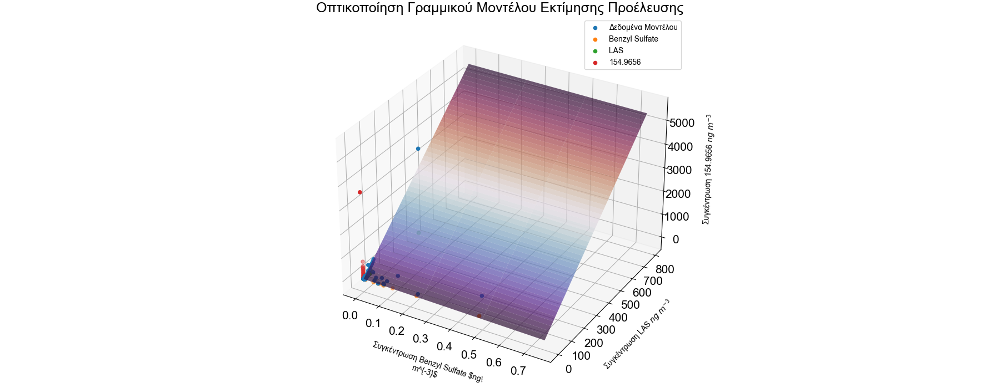

In [159]:
cc = modeled_sources[(modeled_sources['$R^2$'] >= 0.4) & (modeled_sources["Συνθήκη 3 - Γραμμικότητα"] == "Ναι") & 
                (modeled_sources["Συνθήκη 4 - Ομοσκεδαστικότητα"] == "Ναι") & (modeled_sources["Πηγή"] != "Απροσδιόριστο")]


visualize_3d_singleion(df6.iloc[:,6:],cc,'154.9656')
plt.savefig(join(base_fpath, "origin_estimators_vis" + ".png"))

In [160]:
render_to_equations(modeled_sources,(modeled_sources['$R^2$'] >= 0.4) & \
                    (modeled_sources["Συνθήκη 3 - Γραμμικότητα"] == "Όχι")& \
                    (modeled_sources["Συνθήκη 4 - Ομοσκεδαστικότητα"] == "Ναι"))

In [161]:
def fit_source_to_all_second_phase(df,cutoff_model_quality,reducer,cutoff_linearity=0.1,cutoffs_dwatson=(1.5,2.5))->pd.DataFrame:
    output = pd.DataFrame(columns = [r'Ion $\frac{m}{z}$',r'$R^2$',r'$\hat{\beta_0}$',r'$\hat{\beta_1}$',r'$P_{\hat{\beta_0}}$',r'$P_{\hat{\beta_1}}$','Και οι δύο συντελεστές στατιστικά σημαντικοί',
                                     'Ο ένας συντελεστής στατιστικά σημαντικός','Συνθήκη 1.1 - Είναι Gaussian?',
                                     'Συνθήκη 1.2 - Είναι Gaussian?','Συνθήκη 2.1 - Συγγραμμικότητα','Συνθήκη 2.2 - Συγγραμμικότητα',
                                     'Συνθήκη 3 - Γραμμικότητα','Συνθήκη 4 - Ομοσκεδαστικότητα','Συνθήκη 5.1 - Αυτοεξάρτηση',
                                     'Συνθήκη 5.2 - Αυτοεξάρτηση'])
    for ion in df.columns:
        if ion not in ['187.0071']:
            model,R = multiple_regressor(df,ion, ['187.0071'])
            w0,w1 = model.coef_
            group = seek_ion_group(ions,ion)
            c1 = gaussian_greek_converter(df,'187.0071')
            _df = df[['187.0071','168.9812']]
            X = add_constant(_df)
            Y = df[ion]
            model = smf.OLS(Y,X).fit()
            rainbow = rainbow_test(Y,X,model,thresh=cutoff_linearity)
            white_test = statsmodels.stats.diagnostic.het_white(model.resid,  model.model.exog)
            ds=pd.Series([vif(X.values, i)   
               for i in range(X.shape[1])],   
              index=X.columns)
            vif1 = ds.iloc[0]
            vif2 = ds.iloc[1]
            autocor_dwatson = statsmodels.stats.stattools.durbin_watson(model.resid, axis=0)
            p_values = model.summary2().tables[1]['P>|t|']
            
            output = pd.concat([output, pd.DataFrame(data = 
                {r'Ion $\frac{m}{z}$':[ion],
                 r'$R^2$':[R],r'$\hat{\beta_0}$':[w0],
                 r'$\hat{\beta_1}$':[w1],
                 'Πηγή':[src],
                 'Συνθήκη 1.1 - Είναι Gaussian?':[c1],
                 'Συνθήκη 1.2 - Είναι Gaussian?':[c2],
                 'Συνθήκη 2.1 - Συγγραμμικότητα':[vif1],'Συνθήκη 2.2 - Συγγραμμικότητα':[vif2],
                 'Συνθήκη 3 - Γραμμικότητα':[translator(rainbow)],'Συνθήκη 4 - Ομοσκεδαστικότητα':[translator(white_test[1] >0.05)],
                 'Συνθήκη 5.1 - Αυτοεξάρτηση':[translator(autocor_dwatson>=cutoffs_dwatson[0] and (autocor_dwatson>=cutoffs_dwatson[1]))],
                 'Συνθήκη 5.2 - Αυτοεξάρτηση':[translator(autocor_dwatson>=cutoffs_dwatson[0] and (autocor_dwatson>=cutoffs_dwatson[1]))],
                 r'$P_{\hat{\beta_0}}$':[p_values[0]],r'$P_{\hat{\beta_1}}$':[p_values[1]],
                 'Και οι δύο συντελεστές στατιστικά σημαντικοί':[translator(p_values[0]<=0.1 and p_values[1]<=0.1)],
                 'Ο ένας συντελεστής στατιστικά σημαντικός': [translator(p_values[0]<=0.1 or p_values[1]<=0.1)]
                })])
    output = output.reset_index()
    output.drop('index',axis=1,inplace=True)
    return output

## Ανάλυση Πρωτεύοντων Παραγόντων PCA

In [162]:
get_colors = lambda n: list(map(lambda i: "#" + "%06x" % random.randint(0, 0xFFFFFF),range(n)))

In [163]:
grouped = to_groups(fine.iloc[:,data_start:],ions)

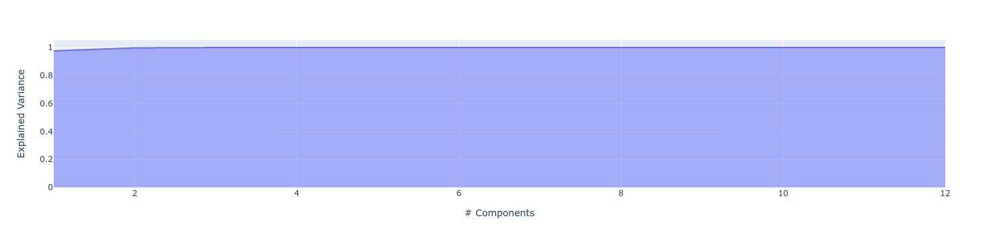

In [164]:
pca = PCA()
pca.fit(grouped)
exp_var_cumul = np.cumsum(pca.explained_variance_ratio_)
px.area(
x=range(1, exp_var_cumul.shape[0] + 1),
y=exp_var_cumul,
labels={"x": "# Components", "y": "Explained Variance"}
)

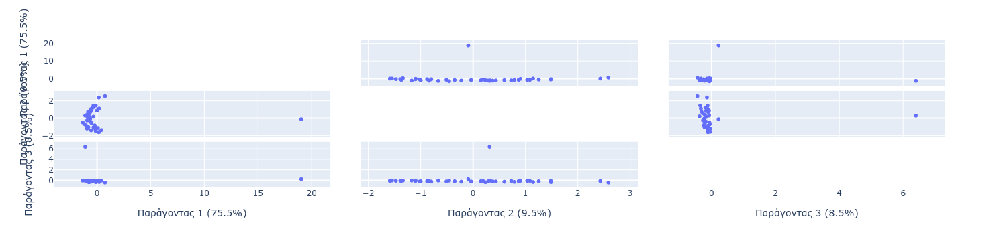

In [165]:
def get_pca_scatter(data:pd.DataFrame,n_pcs:int)->PCA:
    pca = PCA()
    components = pca.fit_transform(scale(data))
    labels = {
        str(i): f"Παράγοντας {i+1} ({var:.1f}%)"
        for i, var in enumerate(pca.explained_variance_ratio_ * 100)
    }

    fig = px.scatter_matrix(
        components,
        labels=labels,
        dimensions=range(n_pcs),
    )
    fig.update_traces(diagonal_visible=False)
    fig.show()
    return pca
_ = get_pca_scatter(grouped,3)

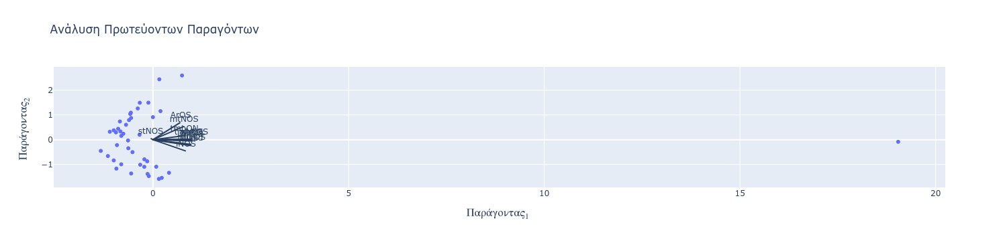

In [166]:
def pca_pretty(data:pd.DataFrame,n = 2):
    pca = PCA(n_components=n)
    X = scale(data)
    components = pca.fit_transform(X)
    loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
    df = pd.DataFrame(data=components,columns=["$Παράγοντας_{i}$".format(i=i) for i in range(1,n+1)])
    fig = px.scatter(df, x="$Παράγοντας_1$", y="$Παράγοντας_2$", title = "Ανάλυση Πρωτεύοντων Παραγόντων")
    for i, feature in enumerate(data.columns):
        fig.add_shape(
            type='line',
            x0=0, y0=0,
            x1=loadings[i, 0],
            y1=loadings[i, 1]
        )
        fig.add_annotation(
            x=loadings[i, 0],
            y=loadings[i, 1],
            ax=0, ay=0,
            xanchor="center",
            yanchor="bottom",
            text=feature,
        )
    fig.show()
    return pca
_ = pca_pretty(grouped)

## Ανάλυση Παραγόντων

### $PM_{2.5}$

#### Έλεγχοι και Προκατεργασία

##### Απόρριψη Ακατάλληλων Τιμών

In [167]:
def calculate_vif_(X, thresh = 3.0):
    variables = list(range(X.shape[1]))
    dropped = True
    while dropped:
        dropped = False
        vi = [vif(X.iloc[:, variables].values, ix)
               for ix in range(X.iloc[:, variables].shape[1])]
        maxloc = vi.index(max(vi))
        if max(vi) > thresh:
            del variables[maxloc]
            dropped = True
    return X.iloc[:, variables]
df8 = calculate_vif_(fine.iloc[:,data_start:])

/media/alexander-fyrogenis/Elements/Οργανοθειικά Ατμόσφαιρα/Data Analysis/venv/lib/python3.10/site-packages/statsmodels/stats/outliers_influence.py:195: RuntimeWarning:

divide by zero encountered in double_scalars



### Καταλληλότητα Για Ανάλυση Παραγόντων

#### Bartlet Σφαιρικότητα
Πριν προχωρήσουμε σε ανάλυση παραγώντων πρέπει να εξαιτάσουμε αν τα δεδομένα πληρούν ορισμένες προϋποθέσεις. Η δοκιμασία σφαιρικότητας Barlet ελέγχει εάν υπάρχει κάποιος βαθμός
αλληλοεξάρτησης μεταξύ των μεταβλητών. Τα δεδομένα μας έχουν στατιστικά σημαντική αλληλοεξάρτηση σε στάθμη 99.99999%

In [168]:
chi_square_value,p_value=calculate_bartlett_sphericity(df8.iloc[:,data_start:])
"{:5f}".format(p_value)

'0.042433'

#### Δοκιμασία Kaiser-Meyer-Olkin
Η δοκιμασία Kaiser-Meyer-Olkin εκφράζει το ποσοστό της μεταβλητότητας στις παραμέτρους, που θα μπορούσε να οφείλεται σε παράγωντες. Τιμές μεγαλύτερες του 0,5 υπονοούν οτι η ανάλυση 
παραγώντων θα μπορούσε να δώσει χρήσιμα αποτελέσματα

In [169]:
kmo_all,kmo_model=calculate_kmo(df8)
"{:2f}".format(kmo_model)

'0.671774'

### Διερευνητική Ανάλυση Παραγώντων

In [170]:
efa1 = FactorAnalyzer(rotation = None,n_factors=df8.shape[1]+1)
efa1.fit(df8)
_ev,_ = efa1.get_eigenvalues() 

In [171]:
def get_scree_plot(df, eigenvalues)->None:
    evs = pd.DataFrame(data = list(zip(range(1,df.shape[1]+1), eigenvalues)),columns=['factor','eigenvalue'])
    evsf = evs[evs['eigenvalue']>1]
    optimal_n_factors,optimal_egv = evsf.iloc[(evsf['eigenvalue']-1).abs().argsort()[:1]].values[0]
    fig,ax = plt.subplots()
    ax.plot(np.arange(1,df.shape[1]+1,1),eigenvalues,'bo-',markersize=7,linewidth=3)
    ax.plot(optimal_n_factors,optimal_egv,'yo',markersize=10,label="Βέλτιστοι Παράγοντες")
    ax.set_xticks(np.arange(0,df.shape[1]+3), np.arange(0,df.shape[1]+3))
    ax.set_title('Διάγραμμα Scree')
    ax.set_xlabel('Παράγοντες')
    ax.set_ylabel('Ιδιοτιμές')
    ax.hlines(1,df.shape[1]+1,'r')
    ax.legend()
    ax.grid()
    fig.set_size_inches(fsize, forward=True)
    return {"optimal_eigenvalue":optimal_egv,"optimal_factors":int(optimal_n_factors)}

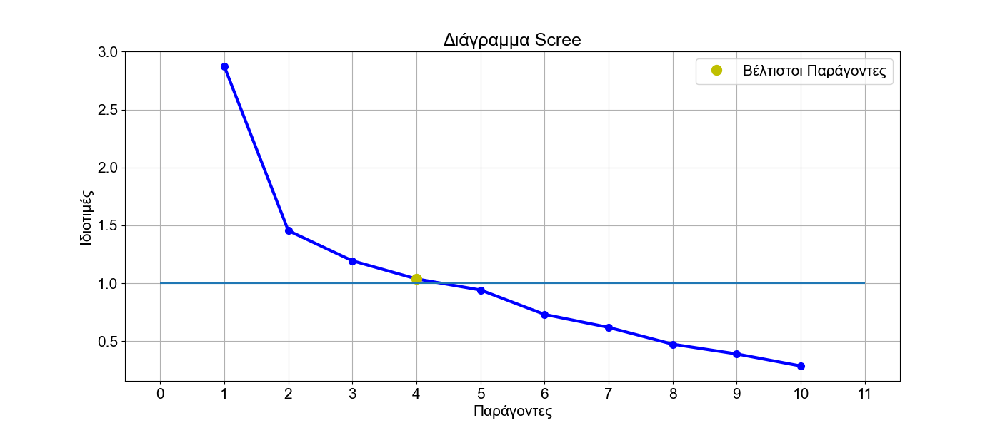

In [172]:
optimals = get_scree_plot(df8,_ev)
plt.savefig(join(base_fpath, "efa_screeplot_fine" + ".png"))

In [173]:
efa2 = FactorAnalyzer(n_factors=optimals["optimal_factors"],rotation='varimax')

In [174]:
efa2.fit(df8)

FactorAnalyzer(n_factors=4, rotation='varimax', rotation_kwargs={})

In [175]:
df9 = pd.DataFrame(
    data=efa2.loadings_,
    index=df8.columns,columns=["$\eta_{i}$".format(i=i) for i in range(1,optimals['optimal_factors']+1)]).transpose()
def util_add_grp_to_cols(df:pd.DataFrame,ions:pd.DataFrame)->pd.DataFrame:
        output = []
        out_df = df.copy(deep = True)
        for col in df.columns:
            output.append(col + " ({})".format(seek_ion_group(ions,col)))
        out_df.columns = output
        return out_df
df10 = util_add_grp_to_cols(df9,ions)

In [176]:
def init_loadings_assessment(df:pd.DataFrame,efa_model:FactorAnalyzer,optimals:dict)->None:
    Z=np.abs(efa_model.loadings_.transpose())
    fig, ax = plt.subplots(figsize = (fsize[0],fsize[1]*1.5))
    c = ax.pcolor(Z)
    fig.colorbar(c, ax=ax)
    ax.set_yticks(np.arange(efa_model.loadings_.shape[1])+0.5, minor=False)
    ax.set_xticks(np.arange(efa_model.loadings_.shape[0])+0.5, minor=False)
    ax.set_yticklabels(["$\eta_{i}$".format(i=i) for i in range(1,optimals['optimal_factors']+1)])
    ax.set_xticklabels(df.columns.values,rotation=40,fontsize=10)

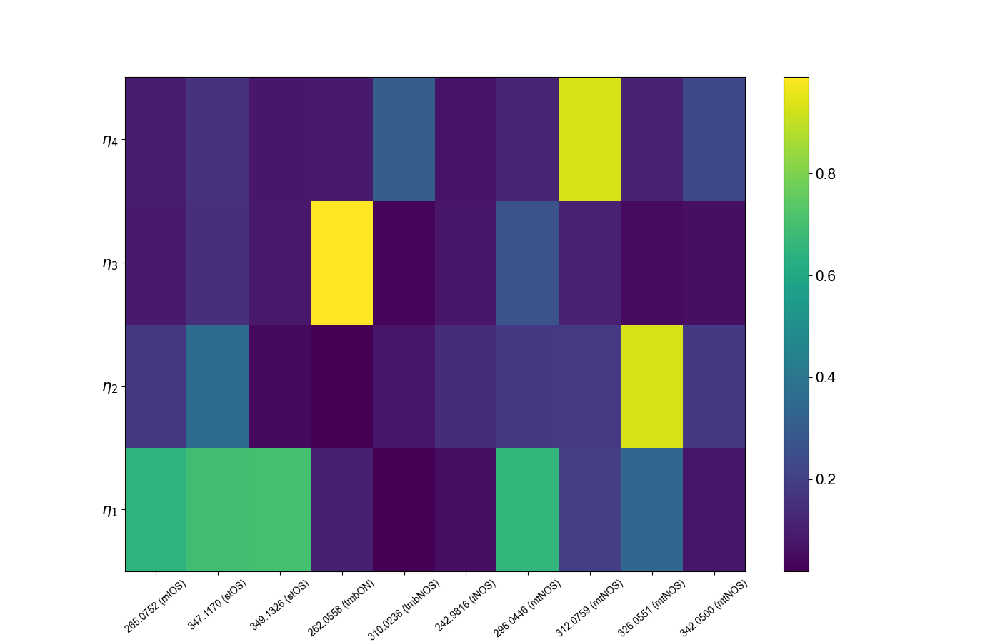

In [177]:
init_loadings_assessment(df10, efa2,optimals)
plt.savefig(join(base_fpath, "efa_loadings_heatmap_fine" + ".png"))

### $PM_{10}$

#### Απόριψη Ακατάλληλων Τιμών

In [178]:
def calculate_vif_(X, thresh = 5.5):
    variables = list(range(X.shape[1]))
    dropped = True
    while dropped:
        dropped = False
        vi = [vif(X.iloc[:, variables].values, ix)
               for ix in range(X.iloc[:, variables].shape[1])]
        maxloc = vi.index(max(vi))
        if max(vi) > thresh:
            del variables[maxloc]
            dropped = True
    return X.iloc[:, variables]
df11 = calculate_vif_(coarse.iloc[:,data_start:])

/media/alexander-fyrogenis/Elements/Οργανοθειικά Ατμόσφαιρα/Data Analysis/venv/lib/python3.10/site-packages/statsmodels/stats/outliers_influence.py:195: RuntimeWarning:

divide by zero encountered in double_scalars



### Καταλληλότητα Για Ανάλυση Παραγόντων

#### Bartlet Σφαιρικότητα
Πριν προχωρήσουμε σε ανάλυση παραγώντων πρέπει να εξαιτάσουμε αν τα δεδομένα πληρούν ορισμένες προϋποθέσεις. Η δοκιμασία σφαιρικότητας Barlet ελέγχει εάν υπάρχει κάποιος βαθμός
αλληλοεξάρτησης μεταξύ των μεταβλητών. Τα δεδομένα μας έχουν στατιστικά σημαντική αλληλοεξάρτηση σε στάθμη 99.99999%

In [179]:
chi_square_value,p_value=calculate_bartlett_sphericity(df11.iloc[:,data_start:])
"{:5f}".format(p_value)

'0.021175'

#### Δοκιμασία Kaiser-Meyer-Olkin
Η δοκιμασία Kaiser-Meyer-Olkin εκφράζει το ποσοστό της μεταβλητότητας στις παραμέτρους, που θα μπορούσε να οφείλεται σε παράγωντες. Τιμές μεγαλύτερες του 0,5 υπονοούν οτι η ανάλυση 
παραγώντων θα μπορούσε να δώσει χρήσιμα αποτελέσματα

In [180]:
kmo_all,kmo_model=calculate_kmo(df11)
"{:2f}".format(kmo_model)

/media/alexander-fyrogenis/Elements/Οργανοθειικά Ατμόσφαιρα/Data Analysis/venv/lib/python3.10/site-packages/factor_analyzer/utils.py:249: UserWarning:

The inverse of the variance-covariance matrix was calculated using the Moore-Penrose generalized matrix inversion, due to its determinant being at or very close to zero.



'0.537664'

### Διερευνητική Ανάλυση Παραγώντων

In [181]:
efa3 = FactorAnalyzer(rotation = None,n_factors=df8.shape[1]+1)
efa3.fit(df11)
_ev2,_ = efa3.get_eigenvalues() 

In [182]:
def get_scree_plot(df, eigenvalues)->None:
    evs = pd.DataFrame(data = list(zip(range(1,df.shape[1]+1), eigenvalues)),columns=['factor','eigenvalue'])
    evsf = evs[evs['eigenvalue']>1]
    optimal_n_factors,optimal_egv = evsf.iloc[(evsf['eigenvalue']-1).abs().argsort()[:1]].values[0]
    fig,ax = plt.subplots()
    ax.plot(np.arange(1,df.shape[1]+1,1),eigenvalues,'bo-',markersize=7,linewidth=3)
    ax.plot(optimal_n_factors,optimal_egv,'yo',markersize=10,label="Βέλτιστοι Παράγωντες")
    ax.set_xticks(np.arange(0,df.shape[1]+3), np.arange(0,df.shape[1]+3))
    ax.set_title('Διάγραμμα Scree')
    ax.set_xlabel('Παράγωντες')
    ax.set_ylabel('Ιδιοτιμές')
    ax.hlines(1,df.shape[1]+1,'r')
    ax.legend()
    ax.grid()
    fig.set_size_inches(fsize, forward=True)
    return {"optimal_eigenvalue":optimal_egv,"optimal_factors":int(optimal_n_factors)}

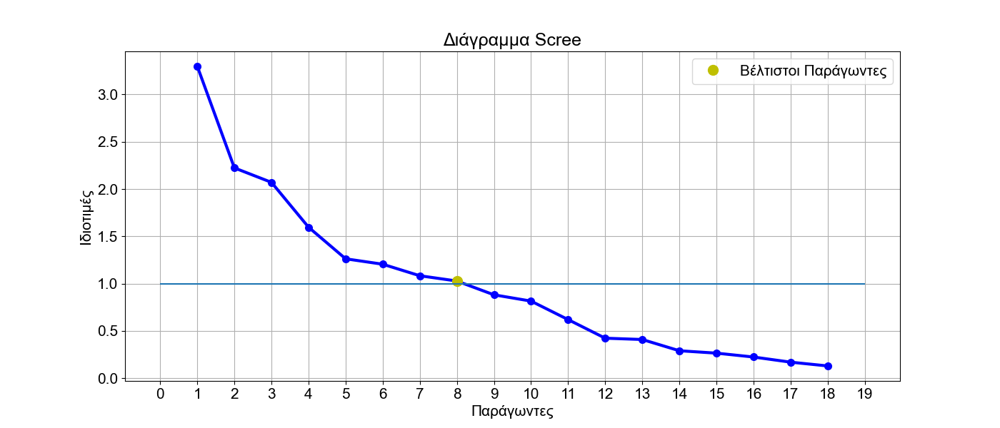

In [183]:
optimals = get_scree_plot(df11,_ev2)
plt.savefig(join(base_fpath, "efa_screeplot_coarse" + ".png"))

In [184]:
efa4 = FactorAnalyzer(n_factors=optimals["optimal_factors"],rotation='varimax')

In [185]:
efa4.fit(df11)

FactorAnalyzer(n_factors=8, rotation='varimax', rotation_kwargs={})

In [186]:
df12 = pd.DataFrame(
    data=efa4.loadings_,
    index=df11.columns,columns=["$\eta_{i}$".format(i=i) for i in range(1,optimals['optimal_factors']+1)]).transpose()
df13 = util_add_grp_to_cols(df12,ions)

In [187]:
def init_loadings_assessment(df:pd.DataFrame,efa_model:FactorAnalyzer,optimals:dict)->None:
    Z=np.abs(efa_model.loadings_.transpose())
    fig, ax = plt.subplots()
    c = ax.pcolor(Z)
    fig.colorbar(c, ax=ax)
    ax.set_yticks(np.arange(efa_model.loadings_.shape[1])+0.5, minor=False)
    ax.set_xticks(np.arange(efa_model.loadings_.shape[0])+0.5, minor=False)
    ax.set_yticklabels(["$\eta_{i}$".format(i=i) for i in range(1,optimals['optimal_factors']+1)])
    ax.set_xticklabels(df.columns.values,rotation=40,fontsize=8)
    fig.set_size_inches(fsize, forward=True)

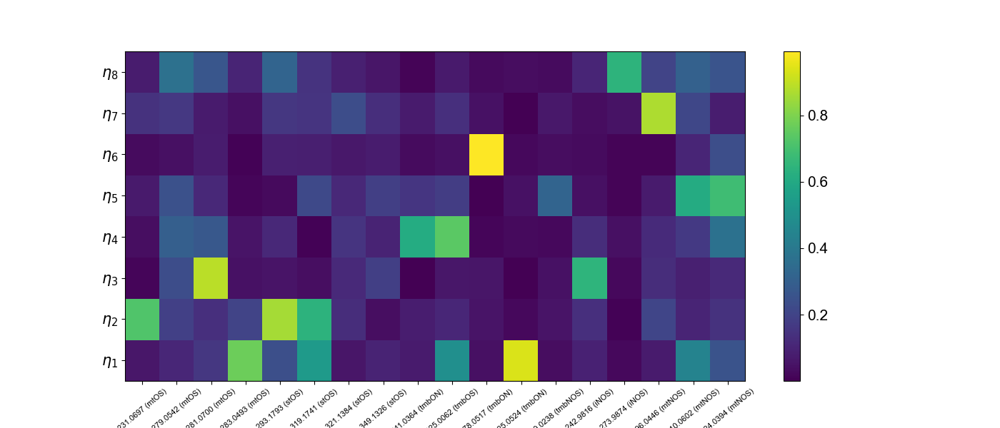

In [188]:
init_loadings_assessment(df13, efa4,optimals)
plt.savefig(join(base_fpath, "efa_loadings_heatmap_coarse" + ".png"))

### Επιβεβαιωτική Ανάλυση Παραγόντων

### Το Μπεϋζιανό Παράδειγμα Στατιστικής - Μπεϋζιανή Σημασιολογία

Η Μπεϋζιανή προσέγγιση στη στατιστική συμπερασματολογία βασίζεται στο θεώρημα Bayes:

$$
Pr(\theta|\eta)\ =\ \dfrac{\prod_{i=1}^N{Pr(y_i|\theta)\ Pr(\theta)}}{\int_{\theta}\prod_{i=1}^N{Pr(y_i|\theta)\ Pr(\theta)}d\theta}
$$

Όπου η παράμετρος $Pr(y_i|\theta)$ ονομάζεται *συνάρτηση πιθανοφάνειας (likelyhood)*, ο παραγοντας $Pr(\theta)$ είναι η *εκ των προτέρων πιθανότητα (prior)* και το αποτέλεσμα της διαδικασίας συμπερασματολογιας είναι η παράμετρος $Pr(\theta|\eta)$ που ονομάζεται η *εκ των υστέρων πιθανότητα (posterior)*. Το $\theta$ αντιπροσωπεύει όλες τις άγνωστες παραμέτρους που θα εκτιμηθούν από το μοντέλο. Ο παρονομαστής είναι μια σταθερά κανονικοποίησης που εγγυάτε οτι το αποτέλεσμα του πολλαπλασιασμού είναι πιθανότητα. Αν έχουμε $n$ προς εκτίμηση $\theta$ τότε η αναλυτική επίλυση $n$-διάστατου ολοκληρώματος είναι γενικά δύσκολη για $n\ge 2-3$ εκτός από ειδικές περιπτώσεις. Αντί αυτού γίνεται εκτίμηση του ολοκληρώματος με αριθμητικές μεθόδους - συνήθως μεθόδους *Monte Carlo*. Στη παρούσα ανάλυση χρησιμοποιήθηκε η βιβλιοθήκη της Python PYMC4 που εφαρμόζει τον αλγόριθμο **auto-tuned Hamiltonian Marcov-Chain Monte Carlo** με δείγματολείπτη που βασίζεται στον αλγόριθμο **N.U.T.S.** (*No U-Turn Sampler*).

Σε ένα τυπικό μοντέλο επιλέγουμε κατανομές για τα $Pr(\theta|\eta)$ και $Pr(y_i|\theta)$ και αντιπροσωπεύουν αρχικές μας εκτιμήσεις για τις διάφορες παραμέτρους τους μοντέλου. Για παράδειγμα στο ακόλουθο μοντέλο υποτέθηκε $Pr(\theta|\eta)\ \thicksim\ N(\mu,\sigma)$. Το αποτέλεσμα της προσαρμογής $Pr(\theta|\eta)$ είναι μια σειρά κατανομών για τα διάφορα $\theta$ που μπορούν να ερμηνευθούν άμεσα ως πιθανότητες, δηλαδή ως αβεβαιότητες. Η Μπεϋζιανή στατιστική συμπερασματολογία έχει πολλά προτερήματα ιδιαίτερης σημασίας για την επιστήμη, όπως:

* Τα αποτελέσματα εκτιμήσεων είναι πιθανότητες (συνήθως κατανομές) που μπορούν άμεσα να ερμηνευθούν ως δηλώσεις αβεβαιότητας, και που είναι συχνά δύσκολο στα πλαίσια του συχνοτιστικού (*frequentist*) πλαίσιο. Για παράδειγμα το συχνά χρησιμοποιούμενο μέγεθος *διάστημα εμπιστοσύνης* αν και ορισμένες φορές ερμηνεύεται ως πιθανότητα, στη πραγματικότητα είναι δήλωση επαναληψημότητας.
* Στο "κλασσικό" πλαίσιο στατιστικής χρησιμοποιούνται εκτιμήτριες που είναι εξειδικευμένες για κάποιο πρόβλημα. Η ανάπτυξη περίπλοκων και ιεραρχικών μοντέλων είναι γενικά δύσκολη, ενό στο Μπεϋζιανό πλαίσιο υπάρχει μόνο μία εκτιμήτρια - το θεώρημα Μπεϋζ. Επομένος η προσέγγιση Μπεϋζ είναι πιό ευέλικτη
* Στις κλασσικές προσεγγίσεις, τα μοντέλα συχνά έχουν διάφορες προϋποθέσεις, όπως για παράδειγμα κανονική κατανομή μεγεθών, αυτές όμως σπάνια πληρούνται ικανοποιητικά σε πραγματικά δεδομένα. Αν και στις Μπεϋζιανές μεθόδους κάποιες τέτοιες προϋποθέσεις παραμένουν, αυτά είναι γενικά πιό ανεκτικά σε "μπερδεμένα" δεδομένα.


### Μπεϋζιανή Επιβεβαιωτική Ανάλυση Παραγόντων (*Bayesian Confirmatory Factor Analysis*)

Θα προχωρήσουμε σε Bayesιανη Επιβεβαιωτική Ανάλυση Παραγόντων, προτείνωντας δύο λανθάνοντες παράγοντες $\{\eta_1,\eta_2\}$ που θα αντιπροσωπεύουν κάποια έννοια Βιογεννούς και Ανθρωπογενούς
δραστηριότητας, αντίστοιχα. Προτείνουμε το εξής μοντέλο

$$
\mathbf{Y}\ \thicksim\ \mathcal{N(\mathbf{\mu},\mathbf{\Sigma})}
$$

Όπου $\mathbf{\Sigma_{n\ x\ p}}$ πίνακας συμμεταβλητότητας, και $\mathbf{\mu_{p}}$ διάνυσμα μέσων τιμών. Προτείνουμε $\mathbf{\mu}$ μορφής

$$
\mathbf{\mu}\ =\ \mathbf{\nu}\ +\ \mathbf{\Lambda\ \eta}\\\\
$$

Με αυτήν την απλοϊκή μορφή είναι εύκολο να ερμηνευθούν όλες οι ελεύθερες παράμετροι. Το $\mathbf{\nu}$ είναι ένα $p$ μήκους διάνυσμα που μπορεί να αντιπροσωπεύει την κανομή μέσων τιμών κάθε μετρούμενης παραμέτρου, το $\mathbf{\Lambda}$ είναι ένας $pxm$ πίνακας φορτωμάτων (*loadings*) που αντιπροσωπεύει την "ευαισθησία" κάθε μετρούμενης μεταβλητής σε μεταβολής ανθρωπογενούς και βιογενούς δραστηριότητας και το $\mathbf{\eta}$ είναι $m$ μήκους διάνυσμα λανθάνοντων μεταβλητών (ανθρωπογενής και βιογενής δραστηριότητα). Θέτουμε κανονικές κατανομές για τις παραμέτρους $\mathbf{\nu}$ και $\mathbf{\mu}$ με μεγάλες τυπικές αποκλίσεις - δηλαδή μία *μη πληροφοριακή εκ των προτέρων* (*non informative prior*).

$$
\mathbf{\nu}\ \thicksim\ \mathcal{N(0,100)}\\\\
\mathbf{\mu}\ \thicksim\ \mathcal{N(0,100)}\\\\
$$

Συνήθως στην Επιβεβαιωτική Ανάλυση Παραγόντων θέτουμε ορισμένους συνδιασμούς παρατηρούμενων/λανθάνοντων μεταβλητων ως 0 στον πίνακα σχεδιασμού (*design matrix*), ωστόσο αυτή η προσέγγιση θα μπορούσε να θεωρηθεί ως υπερβολικά πληροφοριακή (*informative*). Ίσως να μην είναι ρεαλιστικό να υποθέσουμε οτι σε ορισμένα ιόντα υπάρχει πχ μηδενική επίδραση της ανθρωπογενούς δραστηριότητας. Μια εναλλακτική θα μπορούσε να είναι να αποδωθεί σε αυτά τα *διασταυρούμενα βάροι* (*cross-loadings*) μια εκ των προτέρων κατανομή με μικρή τυπική απόκλιση. Τότε τα *loadings* μεταξύ όλων των παρατηρούμενων και λανθάνοντων μεταβλητών θα εκτιμηθεί αλλά τα τα διασταυρούμενα loadings (*cross-loadings*), δηλαδή τα μη υποτιθέμενα θα είναι μικρότερα των υποτιθέμενων. Επειδή δεν είναι ξεκάθαρο το πόσο μικρή θα πρέπει να είναι είναι εφικτό να θέσουμε την ίδια την τυπική απόκλιση της εκ των προτέρων κατανομής των διασταυρούμενων loadings   ως τυχαία μεταβλητή. Δηλαδή:

$$
\mathcal{\Lambda}\ =\ \mathbf{\Phi}\ [\beta(1-\mathbf{M})+\mathbf{M}]\\\\
\mathcal{\Phi}\ \thicksim\ \mathcal{N(0,1)}\\\\
\mathcal{\beta}\ \thicksim\ \mathcal{B(0,1)}\\\\
$$

Αποδίδουμε κανονικές κατανομές σε όλα τα στοιχεία του $\mathbf{\Phi}$ και Βήτα κατανομή στην παράμετρο $\beta$. Έτσι τα στοιχεία του πίνακα σχεδιασμού που είναι μηδέν - δηλαδή τα φορτώματα (*loadings*) γίνονται -1, πολλαπλασιάζονται με μια στοχαστική παράμετρο $\beta$ που αντιπροσωπεύει την τυπική απόκλιση για τα διασταυρούμενα φορτώματα και το υπόλοιπο τους πολλαπλασιάζεται με τα προσαρμωσμένα φορτώματα $\Phi$.

Ο πίνακας συμμεταβλητότητας $\mathbf{\Sigma}$ προκύπτει ως εξής:

$$
\mathbf{\Sigma}\ =\ \mathbf{\Lambda \Psi \Lambda^T\ +\ \Theta}
$$

Το $\mathbf{\Psi}$ είναι ο $mxm$ πίνακας συμμεταβλητότητας των λανθάνοντων μεταβλητών και ο παράγοντας $\mathbf{\Theta}$ απορροφά την ελλειματική μεταβλητότητα των μετρούμενων μεταβλητών και τις συσχετίσεις τους, που δεν εξηγούνται από τις λανθάνουσες μεταβλητές.

Η τεχνική CFA έχει δύο κύρια προβλήματα ταυτοποιησημότητας (*identifiability*). Πρώτον στην κλασσική frequentist CFA ο πίνακας σχεδιασμού πρέπει να είναι αραιός, διαφορετικά δεν υπάρχει μοναδική λύση μέγιστης πιθανοφάνειας (*maximum likelyhood*). Δηλαδή θα πρέπει  οι περισσότεροι συνδιασμοί λανθάνοντων - παρατηρούμενων μεταβλητών να είναι 0. Επειδή στη Μπεϋζιανή προσέγγιση δεν μεγιστοποίηται η πιθανοφάνεια αυτό το πρόβλημα είναι λιγότερο σημαντικό, ωστόσο ο πίνακας σχεδιασμού θα πρέπει να είναι αραιός και πάλι. 

Το δεύτερο πρόβλημα ταυτοποιησημότητας προκύπτει αν ούτε η μεταβλητότητα, ούτε η τουλάχιστον ένα φόρτωμα ανά παράγοντα δεν είναι σταθερό. Αν και η πρώτη επιλογή είναι συχνότερη, ορισμένοι θεωρούν οτι έχει περισσότερο νόημα να προσαρμοστούν οι μεταβλητότητες των παραγόντων. Σε αυτή τη περίπτωση το $\mathbf{\Psi}$ είναι πίνακας συσχέτησης αντί πίνακας συμμεταβλητότητας.

Πιθανές επιλογές για την εκ των προτέρων κατανομή του $\mathbf{\Psi}$ είναι η κατανομή Inverse-Wishart και η κατανομή LKJ. Η δεύτερη έχει μοναδική παράμετρο σχήματος $\eta$ τέτοια ώστε όταν είναι μεγάλη, οι τιμές εκτός της διαγωνίου του πίνακα συσχετίσεων τείνουν να είναι μικρές. Αν οι παράγοντες έχουν υψηλή συσχέτιση τότε $\eta\ =\ 1$.

Μπορούμε να το μοντελοποιήσουμε ως εξής:

$$
\mathbf{\Theta}\ =\ \mathbf{D\Omega D}
$$
 
Όπου $\mathbf{D}$ ο διαγώνιος πίνακας των τυπικών αποκλίσεων και $\mathbf{\Omega}$ είναι ένας πίνακας συσχετίσεων. Αποδίδουμε Μισές Cauchy σε κάθε κελί του $\mathbf{D}$ και LKJ στον $\mathbf{\Omega}$. Στην ειδική περίπτωση όπου ο $\mathbf{\Omega}$ είναι ταυτότικός, τότε το μοντέλο θα επιχειρήσει να εξηγήσει όλες τις συσχετίσεις μεταξύ των παρατηρούμενων μεταβλητών χρησιμοποιώντας μόνον τις λανθάνουσες μεταβλητές. Θα μπορούσε κάποιος να ισχυρηστεί οτι θα έπρεπε ο να είναι πάντα ταυτότητικός, ωστόσο υπάρχουν περιπτώσεις όπου έχει νόημα να εκτιμηθούν και οι ελλείματικές συσχετίσεις - ιδιαίτερα στη περίπτωση μας. Δεν έχει λόγο να πιστεύουμε οτι ο μόνος λόγος που συσχετίζονται δύο ιόντα είναι λόγο τις ανθρωπογενούς ή βιογενούς προέλευσης τους. Αντίθετα μπορούμε να ανεχθούμε σχετιμά υψηλές ελλειματικές συσχετίσεις, οι οποίες θα μπορούσαν να οφείλονται σε άλλες παραμέτρους όπως θερμοκρασία, συγκέντρωση ισοπρενίου κλπ. Παρόλα αυτά είναι επιθυμητό οι ελλειματικές συσχετίσεις να είναι κατά το δυνατόν μικρότερες, ώστε να επιτραπεί στις λανθάνουσες μεταβλητές να απορροφήσουν όσο το δυνατόν περισσότερη μεταβλητότητα των ιόντων. Μπορούμε να πετύχουμε αυτή τη συμπεριφορά θέτοντας μεγάλη τιμή $\eta$ για την LKJ εκ των προτέρων κατανομή. Αυτό εξαναγκάζει όλες τις ελλειματικές συσχετίσεις να είναι κατά το δυνατόν μικρές

Οπότε συνοπτικά προτείνουμε το εξής μοντέλο:

$$
\mathbf{Y|\ \eta\ \Sigma\ \Theta\ \nu\ \mu\ \Lambda\ D\ \Omega}\ \thicksim\ \mathcal{N(\mathbf{\mu\ ,\Sigma})}\\\\
\\
\mathbf{Y}\ \thicksim\ \mathcal{N(\mathbf{\mu},\mathbf{\Sigma})}\\\\
\mathbf{\Sigma}\ =\ \mathbf{\Lambda \Psi \Lambda^T\ +\ \Theta}\\\\
\mathcal{\Lambda}\ =\ \mathbf{\Phi}\ [\beta(1-\mathbf{M})+\mathbf{M}]\\\\
\mathbf{\mu}\ =\ \nu\ +\ \mathbf{\Lambda\theta}\\\\
\mathbf{\Theta}\ =\ \mathbf{D\Omega D}\\\\
\mathbf{\nu}\ \thicksim\ \mathcal{N(0,2.5)}\\\\
\mathbf{\eta}\ \thicksim\ \mathcal{N(0,2.5)}\\\\
\mathbf{\Phi}\ \thicksim\ \mathcal{N(0,2.5)}\\\\
\mathbf{\sigma\prime}\ \thicksim\ \mathcal{E(\lambda\ =\ 0.1)}\\
\mathbf{\Psi}\ \thicksim\ \mathcal{LKJ(\eta\ \xrightarrow\ \infty ,\sigma\prime)}\\\\
\mathbf{D}\ \thicksim\ \mathcal{LKJ(\eta\ \xrightarrow\ \infty ,\sigma\prime)}\\\\
$$

In [189]:
def get_design_matrix(obs:pd.DataFrame,cfa_model : Optional[dict] = None)->pd.DataFrame:
    '''
    Returns a dataframe design matrix from an observed dataframe and a cfa_model dictionary
    
    Arguments:
    - obs: pandas.DataFrame A pandas nxp dataframe with n observations and p observed variables
    - cfa_model: dict[str]:list[str]
    Returns:
    - 
    '''
    latent_labels = lambda n: ("$\eta_{0}$".format(i+1) for i in range(0,n))
    a,p = obs.shape
    observed_vars = obs.columns.tolist()
    k_ = []
    for k,v in cfa_model.items():
        for _ in v:
            k_.append(_)
    assert len(set(k_)) == len(obs.columns), "Mismatch between variables! Found {0} ".format(
        len(set(k_))) + "in observed data and {0} in the design matrix".format(
        len(obs.columns))
    del k_
    if cfa_model is not None:
        factors = list(latent_labels(len(cfa_model.keys())))
    else:
        raise ValueError("You must specify a design matrix of the" +\
                         "form dict[factor_i]=list[observed_variable_1,observed_variable_2,...,]")
    
    design_matrix = pd.DataFrame(data = np.zeros((obs.shape[1],len(factors)),dtype = float), index = observed_vars,
                                 columns = list(factors) )
    for latent_var,o_vars in cfa_model.items():
        design_matrix.loc[:,latent_var] = [1 if (e in o_vars) else 0 for e in observed_vars]
    if not scipy.sparse.issparse(design_matrix):
        warn("Warning! Specified Model results in a non-sparse design matrix!")
    design_matrix.style.set_properties(**{'text-align': 'center'})
    return design_matrix

In [190]:
dmatrix = {
    "$\eta_1$" : ['110.9758', '124.9914', '139.0071'],
    "$\eta_2$": ['187.0071', '187.0071.1', '201.0227'],
}
f = fine.iloc[:,6:].loc[:,['110.9758', '124.9914', '139.0071','187.0071', '187.0071.1', '201.0227']]
design_matrix = get_design_matrix(f, dmatrix)
dfStyler = design_matrix.style.set_properties(**{'text-align': 'left'})
dfStyler.set_table_styles([dict(selector='th', props=[('text-align', 'center')])])

/tmp/ipykernel_29063/3519034373.py:33: UserWarning:

Warning! Specified Model results in a non-sparse design matrix!



,$\eta_1$,$\eta_2$
110.9758,1,0
124.9914,1,0
139.0071,1,0
187.0071,0,1
187.0071.1,0,1
201.0227,0,1


In [193]:

    def bayesian_confirmatory_factor_analysis(observed_data:pd.DataFrame,
                                          design_matrix:pd.DataFrame,β:str = "estimate",
                                          ν_σ:float = 2.5, ν_μ:float = 0.0, η_μ:float = 0.0,
                                          η_σ:float = 2.5, d_β:float = 2.5,obs_corr:bool = True,
                                          latent_corr:bool = True, Ω_η:float = 100,exp_λ:float = 1.0,
                                          Ψ_η:float = 1, Β_β:float =1, Β_α:float = 1, ϕ_μ:float = 0 ,ϕ_σ:float = 1 )->None:
        cfa_dims = namedtuple('cfa_dims', ['observations',
                                           'observed_variables', 'latent_variables'])
        dims = cfa_dims(observations= observed_data.shape[0],observed_variables = observed_data.shape[1],
                       latent_variables = design_matrix.shape[1])
        
        # μ = ν + Λ θ, where θ is the latent variable vector
        
        ν = pmc.Normal(name = 'ν', mu = ν_μ, sd = ν_σ, shape = dims.observed_variables,
                      testval = observed_data.mean(axis = 0))
        
        η = pmc.Normal(name = 'η',mu = η_μ, sd = η_σ, shape = dims.latent_variables,
                      testval = np.zeros(dims.latent_variables))
        
        # Λ is a pxm factor loading intercept matrix. It derives from
        # Λ = Φ [β(1-M)+M]
        # Priors on unscaled factor loadings
        
        # Φ = pmc.HalfNormal(name = 'Φ', sigma = 10)
        Φ = pmc.Normal(name = 'Φ', mu = ϕ_μ, sd = ϕ_σ, shape = (dims.observed_variables,
                                                           dims.latent_variables),
                      testval = design_matrix.values)
        if isinstance(β,str):
            assert β == "estimate", f"β must be 'estimate' or a float"
            β = pmc.Beta(name = 'β', alpha = Β_α , beta = Β_β, testval = 0.1 )
        M = np.asarray(design_matrix.values)
        
        # Generate scaled factor loadings
        Λ = pmc.Deterministic('Λ', Φ * (β*(1-M) + M ))
        
        # μ = ν + Λ θ
        μ = pmc.Deterministic('μ',ν + pmc.math.matrix_dot(Λ, η))
        
        # The convariance matrix is Σ = ΛΨΛ + Ρ
        # Ρ is the observed variable covariance matrix Ρ = DΩD
        # Priors for the item standard deviations
        D = pmc.HalfCauchy(name = "D", beta= d_β, shape = dims.observed_variables,
                          testval = observed_data.std(axis=0))
        
        #Priors for item correlations
        observed_correlations = pmc.Exponential.dist(exp_λ)
        
        if not obs_corr:
            # If observations are not allowed to correlate
            # with each other Ω is an identity matrix
            Ω = np.eye(dims.observed_variables)
        else:
            G = pmc.LKJCholeskyCov(name = "G", eta = Ω_η, n = dims.observed_variables,
                                  sd_dist = observed_correlations)
            χ1 = pmc.expand_packed_triangular(dims.observed_variables, G,lower = True)
            K = pmc.math.dot(χ1, χ1.T)
            sd1 = theano.tensor.sqrt(theano.tensor.diag(K))
            Ω = pmc.Deterministic("Ω",K /sd1[:,None]/sd1[None,:])
            
        # Residual item variances and covariances
        Θ = pmc.Deterministic("θ", D[None,:]*Ω*D[:,None])

        # Priors for factor correlations
        if not latent_corr:
            Ψ = np.eye(dims.latent_variables)
        else:
            L = pmc.LKJCholeskyCov(name = "L", eta = Ψ_η, n = dims.latent_variables,
                                   sd_dist  = observed_correlations)
            χ = pmc.expand_packed_triangular(dims.latent_variables,L, lower = True)
            _ψ = pmc.math.dot(χ,χ.T)
            sd = theano.tensor.sqrt(theano.tensor.diag(_ψ))
            Ψ = pmc.Deterministic("Ψ", _ψ / sd[:,None]/sd[None,:])

        # Variances and covariances for items
        Σ = pmc.math.matrix_dot(Λ,Ψ,Λ.T) + Θ

        # Priors on observations
        Y = pmc.MvNormal(name = "Y", mu = μ,cov = Σ, observed = observed_data.values,
                        shape = observed_data.shape)

In [194]:
# scaled = pd.DataFrame(data = scale(f), columns = f.columns, index = f.index)
# with Model() as cfa_model:
#     bayesian_confirmatory_factor_analysis(scaled,get_design_matrix(f, dmatrix ),latent_corr = False, d_β = 0.0001)
#     trace = pmc.sample(1000,tune = 100000,chains=2,cores =2,return_inferencedata=True)

In [ ]:
scaled = pd.DataFrame(data = scale(f), columns = f.columns, index = f.index)
with Model() as cfa_model:
    bayesian_confirmatory_factor_analysis(scaled,get_design_matrix(f, dmatrix ),latent_corr = False,ν_μ = 0.5, ν_σ = 1000, η_μ = 0.5,
                                          η_σ = 0.165, Ω_η = 1000, Ψ_η = 1000,ϕ_σ=100)
    trace = pmc.sample(1000,tune = 100000,chains=3,cores =3,return_inferencedata=True)

/tmp/ipykernel_29063/3519034373.py:33: UserWarning:

Warning! Specified Model results in a non-sparse design matrix!

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (3 chains in 3 jobs)
NUTS: [G, D, β, Φ, η, ν]


/media/alexander-fyrogenis/Elements/Οργανοθειικά Ατμόσφαιρα/Data Analysis/venv/lib/python3.10/site-packages/theano/compile/function/types.py:974: RuntimeWarning:

invalid value encountered in accumulate

/media/alexander-fyrogenis/Elements/Οργανοθειικά Ατμόσφαιρα/Data Analysis/venv/lib/python3.10/site-packages/theano/compile/function/types.py:974: RuntimeWarning:

invalid value encountered in accumulate



In [ ]:
az.summary(trace)

In [ ]:
fig, ax = plt.subplots(nrows = 6,ncols = 2,figsize = fsize, constrained_layout = True)
labels = az.labels.MapLabeller(
    var_name_map={"θ": r"$\theta$",
                 "Λ": r"$\Lambda$",
                  "μ": r"$\mu$",
                  "ν": r"$\nu$",
                 }
)
az.plot_posterior(trace,figsize=fsize,var_names=['Λ'], ax = ax,hdi_prob = 0.95, kind = 'hist', rope = (0,1), labeller = labels)

In [ ]:
az.plot_posterior(trace, var_names = ["η"], figsize = fsize, kind = "hist")